Math 5750/6880: Mathematics of Data Science \
Project 3

# 1. Fashion-MNIST image classification using sklearn

In [1]:
from tensorflow.keras.datasets import fashion_mnist
from sklearn.preprocessing import StandardScaler

# Load Fashion-MNIST
# Classes (0-9): T-shirt/top, Trouser, Pullover, Dress, Coat, Sandal, Shirt, Sneaker, Bag, Ankle boot
(X_train, y_train), (X_test, y_test) = fashion_mnist.load_data()
X_train = X_train.reshape(len(X_train), -1)
X_test  = X_test.reshape(len(X_test), -1)

# Scale features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train) #60000
X_test = scaler.transform(X_test) #10000

In [2]:
# pipeline
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from matplotlib import pyplot as plt
import time
import seaborn as sns

def train_mlp_pipeline(X_train, y_train, X_test, y_test,
                       hidden_layer_sizes=(64,), activation='relu',
                       solver='adam', alpha=0.0001, learning_rate_init=0.001,
                       learning_rate = 'constant',
                       max_iter=200, early_stopping=True, batch_size=256, n_iter_no_change = 10):
  model = MLPClassifier(
      hidden_layer_sizes=hidden_layer_sizes,
      activation=activation,
      solver=solver,
      alpha=alpha,
      learning_rate_init=learning_rate_init,
      learning_rate = 'constant',
      max_iter=max_iter,
      early_stopping=early_stopping,
      random_state=42,
      n_iter_no_change = n_iter_no_change
    )
  start_time = time.time()
  model.fit(X_train, y_train)
  end_time = time.time()
  training_time = end_time - start_time
  y_train_pred = model.predict(X_train)
  y_pred = model.predict(X_test)

  acc_train = accuracy_score(y_train, y_train_pred)
  acc = accuracy_score(y_test, y_pred)

  cm = confusion_matrix(y_test, y_pred)

  if early_stopping:
    best_val_score = max(model.validation_scores_)
    print("Best Validation Score:", best_val_score)
  else:
    print("Early stopping not enabled; no validation scores available.")

  print("Train Accuracy", acc_train)
  print("Test Accuracy:", acc)
  print("training time", training_time)
  print("n_iter", model.n_iter_)


  # heat map
  plt.figure(figsize=(6,5))
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
  plt.xlabel("Predicted label")
  plt.ylabel("True label")
  plt.title("Confusion Matrix")
  plt.show()
  # loss curve
  plt.figure(figsize=(6,4))
  plt.plot(model.loss_curve_, marker='o')
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.title("Loss Curve")
  plt.grid(True)
  plt.show()


  results = {
    'training accuracy' : acc_train,
    'testing accuracy': acc,
    'confusion_matrix': cm,
    'training_time': training_time,
    'n_iter': model.n_iter_,
    'loss_curve': model.loss_curve_
  }
  return results


Train Accuracy 0.9688166666666667
Test Accuracy: 0.8862
training time 69.28629326820374
n_iter 34
Best validation score: 0.8975


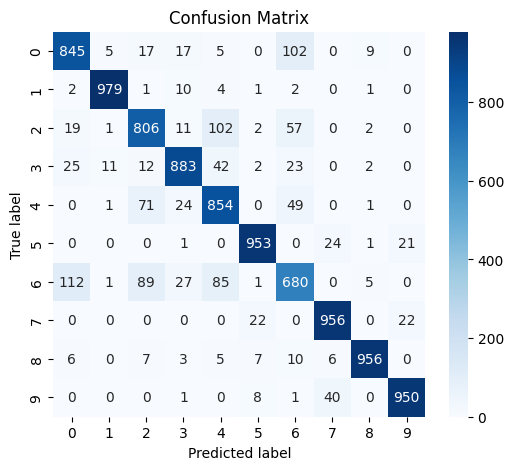

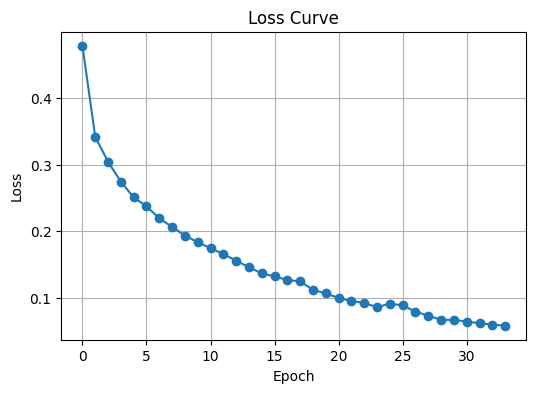

{'training accuracy': 0.9688166666666667,
 'testing accuracy': 0.8862,
 'validation score': 0.8975,
 'confusion_matrix': array([[845,   5,  17,  17,   5,   0, 102,   0,   9,   0],
        [  2, 979,   1,  10,   4,   1,   2,   0,   1,   0],
        [ 19,   1, 806,  11, 102,   2,  57,   0,   2,   0],
        [ 25,  11,  12, 883,  42,   2,  23,   0,   2,   0],
        [  0,   1,  71,  24, 854,   0,  49,   0,   1,   0],
        [  0,   0,   0,   1,   0, 953,   0,  24,   1,  21],
        [112,   1,  89,  27,  85,   1, 680,   0,   5,   0],
        [  0,   0,   0,   0,   0,  22,   0, 956,   0,  22],
        [  6,   0,   7,   3,   5,   7,  10,   6, 956,   0],
        [  0,   0,   0,   1,   0,   8,   1,  40,   0, 950]]),
 'training_time': 69.28629326820374,
 'n_iter': 34,
 'loss_curve': [np.float64(0.4778490907489584),
  np.float64(0.34165752692811513),
  np.float64(0.3039992471135214),
  np.float64(0.274460132941515),
  np.float64(0.2507842010652095),
  np.float64(0.2374913623727597),
  np.flo

In [5]:
 # baseline
 train_mlp_pipeline(X_train, y_train, X_test, y_test)

Training one layer with size (1,)
Train Accuracy 0.4096166666666667
Test Accuracy: 0.4037
training time 11.228578090667725
n_iter 44
Best validation score: 0.4028333333333333


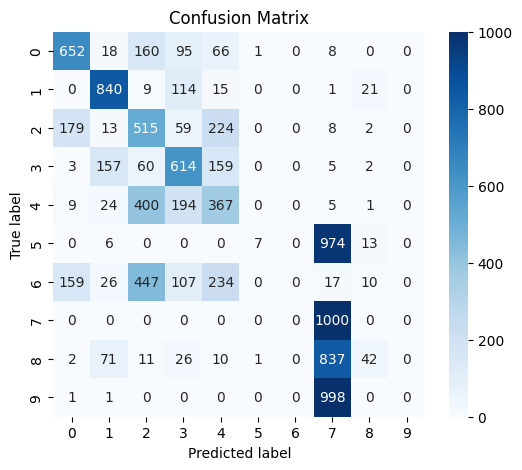

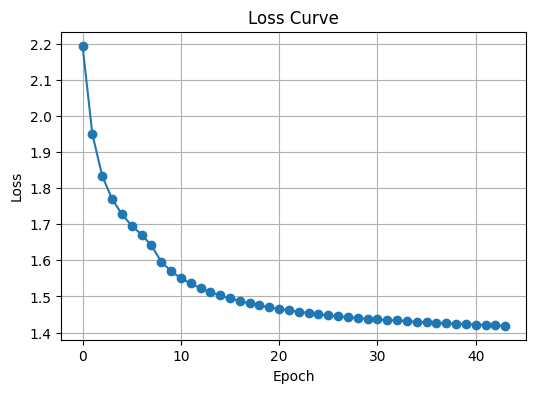

Training one layer with size (2,)
Train Accuracy 0.7406
Test Accuracy: 0.732
training time 33.99046492576599
n_iter 85
Best validation score: 0.7395


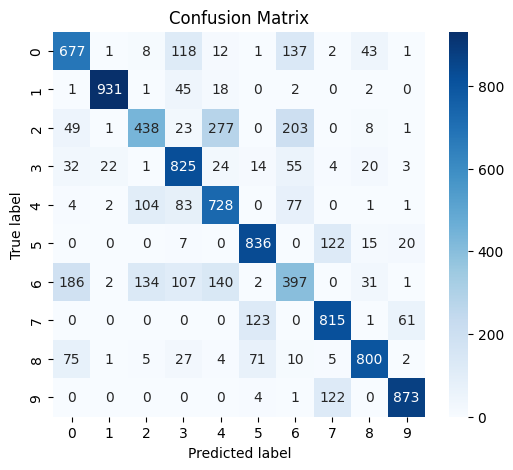

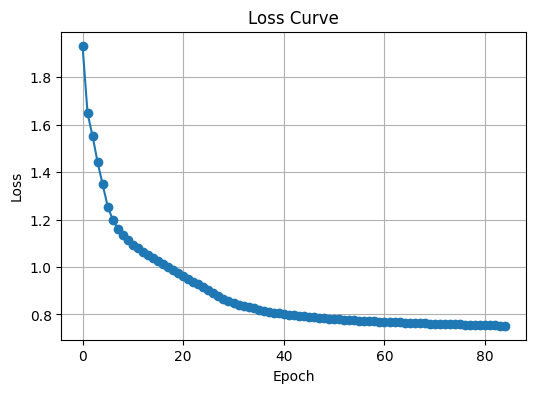

Training one layer with size (4,)
Train Accuracy 0.8373166666666667
Test Accuracy: 0.8135
training time 45.533097982406616
n_iter 84
Best validation score: 0.8208333333333333


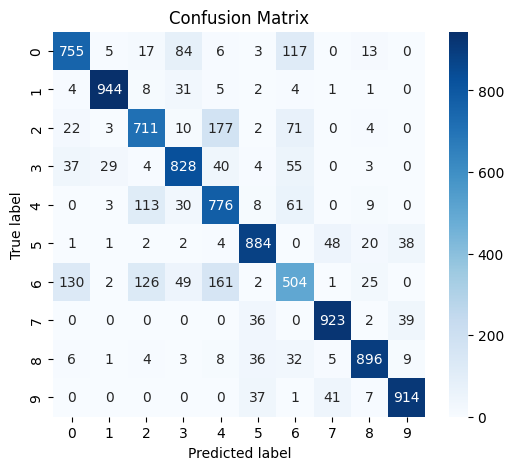

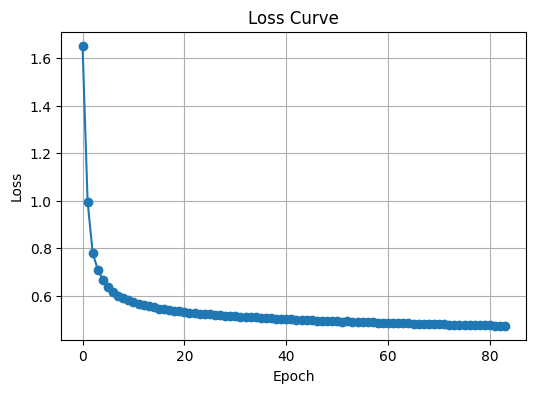

Training one layer with size (8,)
Train Accuracy 0.88195
Test Accuracy: 0.8502
training time 34.59278416633606
n_iter 61
Best validation score: 0.8601666666666666


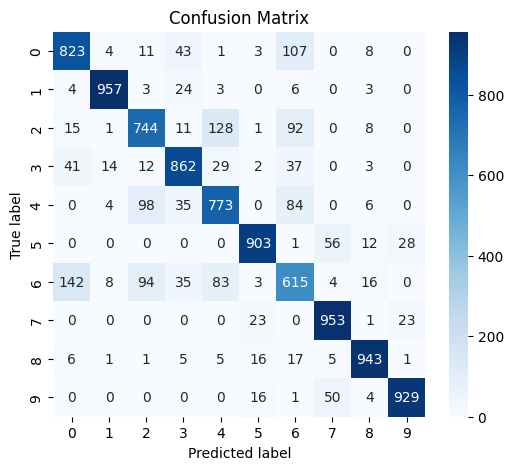

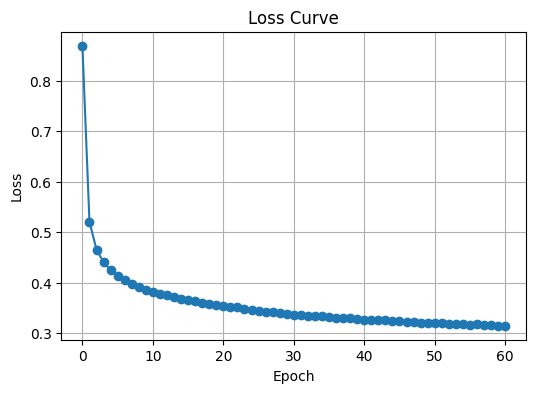

Training one layer with size (16,)
Train Accuracy 0.9009
Test Accuracy: 0.8641
training time 24.987849473953247
n_iter 32
Best validation score: 0.8718333333333333


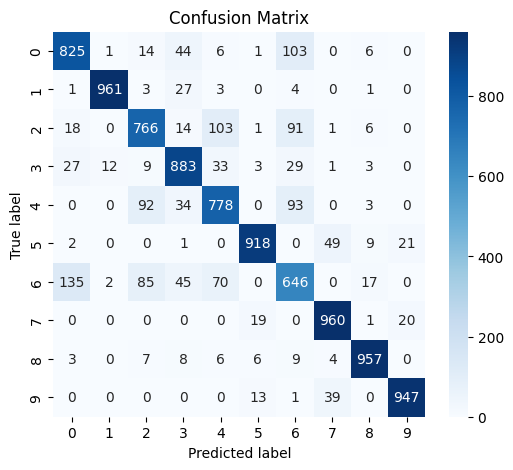

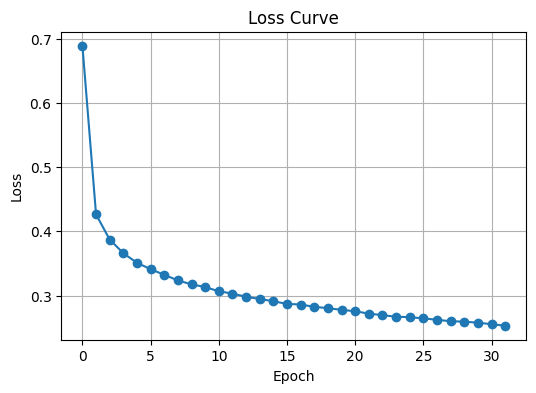

Training one layer with size (32,)
Train Accuracy 0.9296333333333333
Test Accuracy: 0.8732
training time 38.15112352371216
n_iter 35
Best validation score: 0.8855


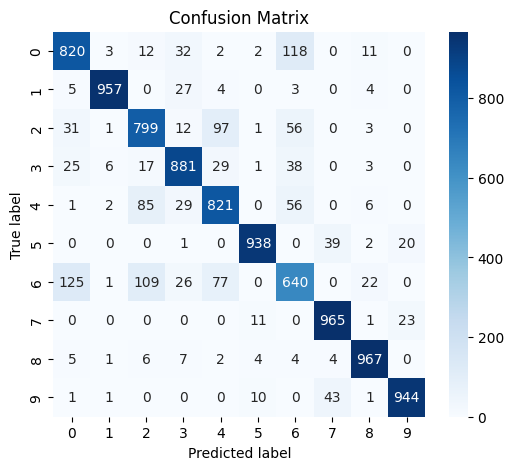

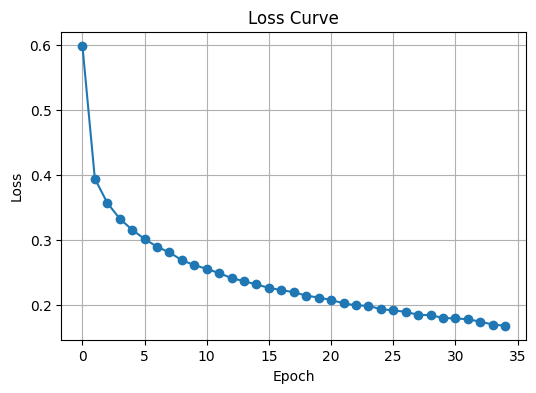

Training one layer with size (64,)
Train Accuracy 0.9280333333333334
Test Accuracy: 0.879
training time 30.34149146080017
n_iter 22
Best validation score: 0.8898333333333334


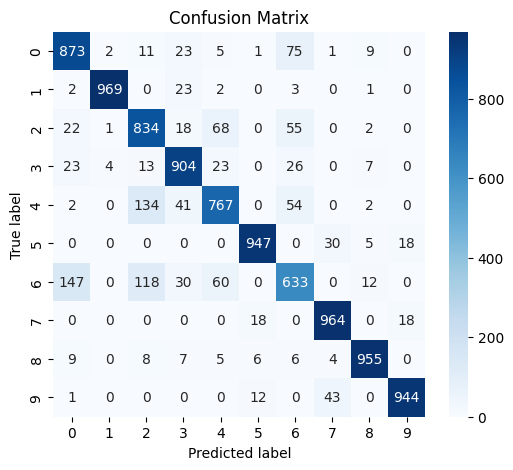

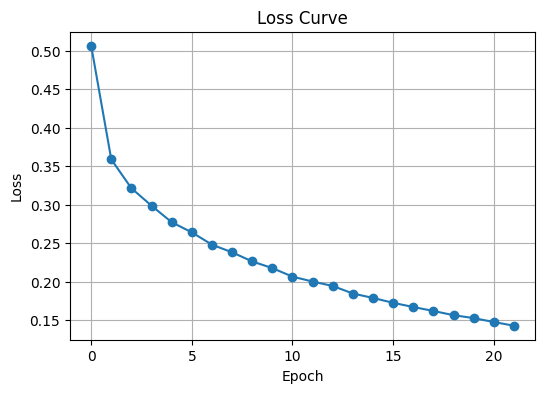

Training one layer with size (128,)
Train Accuracy 0.9688166666666667
Test Accuracy: 0.8862
training time 78.08449029922485
n_iter 34
Best validation score: 0.8975


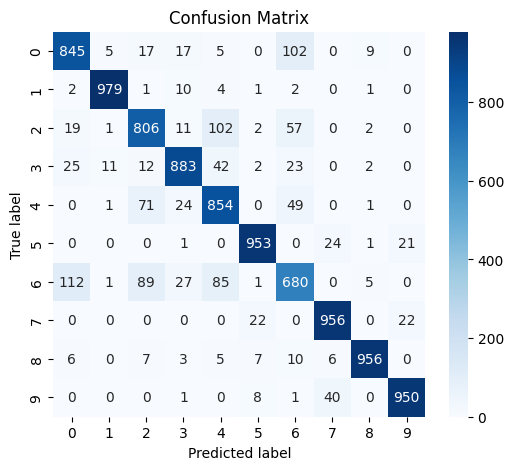

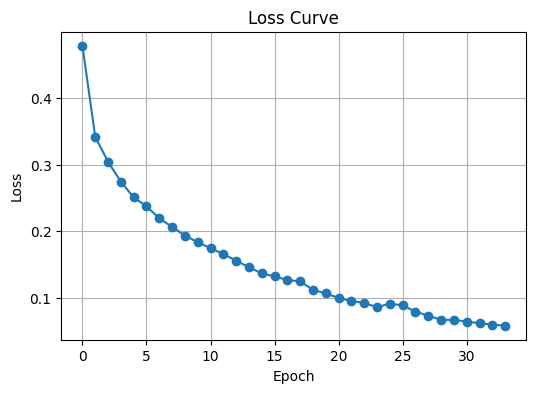

Training one layer with size (256,)
Train Accuracy 0.9691833333333333
Test Accuracy: 0.8911
training time 129.5423390865326
n_iter 31
Best validation score: 0.8958333333333334


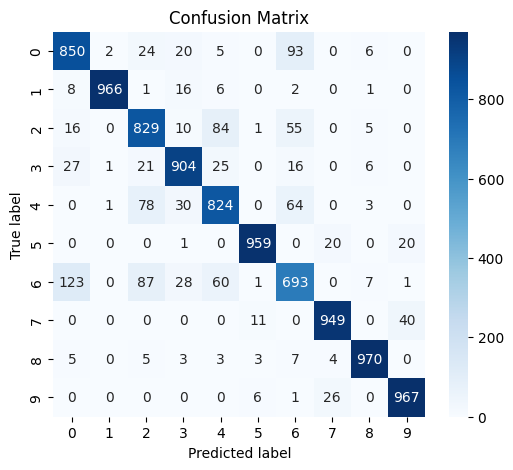

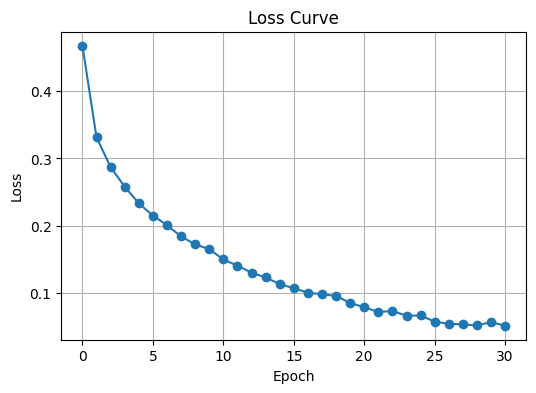

Training one layer with size (512,)
Train Accuracy 0.9701333333333333
Test Accuracy: 0.8901
training time 224.789160490036
n_iter 29
Best validation score: 0.9026666666666666


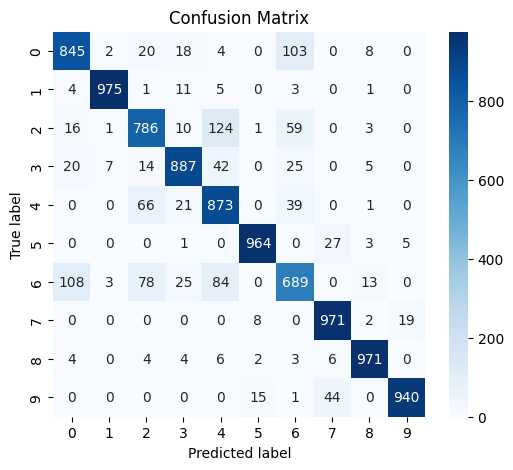

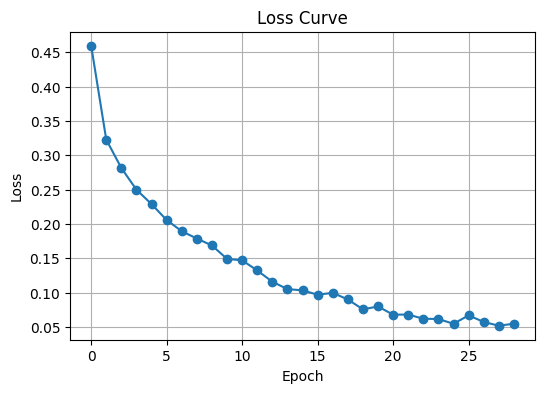

Training two layers with sizes (2, 1)
Train Accuracy 0.4416
Test Accuracy: 0.4362
training time 44.5945725440979
n_iter 105
Best validation score: 0.43466666666666665


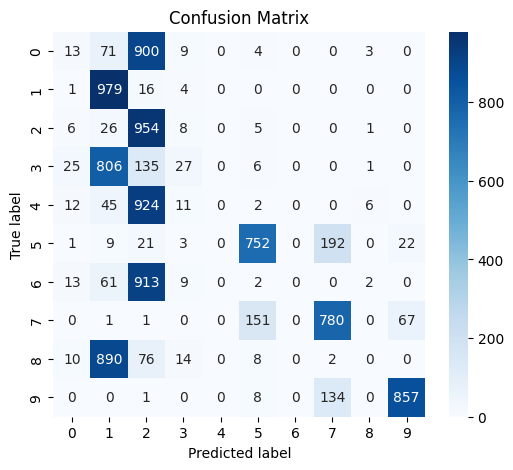

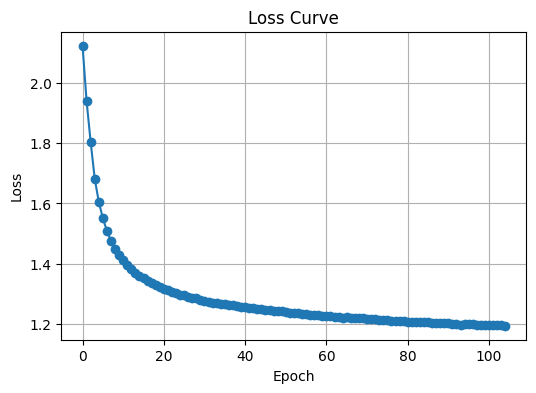

Training two layers with sizes (4, 2)
Train Accuracy 0.8019166666666667
Test Accuracy: 0.7819
training time 37.1436402797699
n_iter 64
Best validation score: 0.79


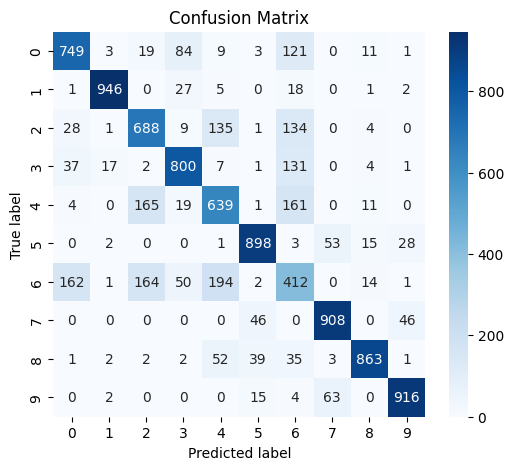

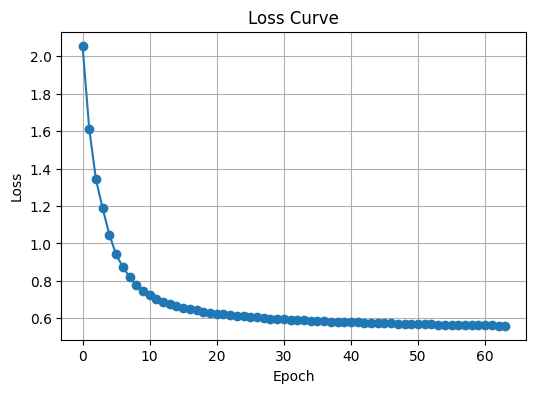

Training two layers with sizes (8, 4)
Train Accuracy 0.8639333333333333
Test Accuracy: 0.8357
training time 23.567174196243286
n_iter 36
Best validation score: 0.85


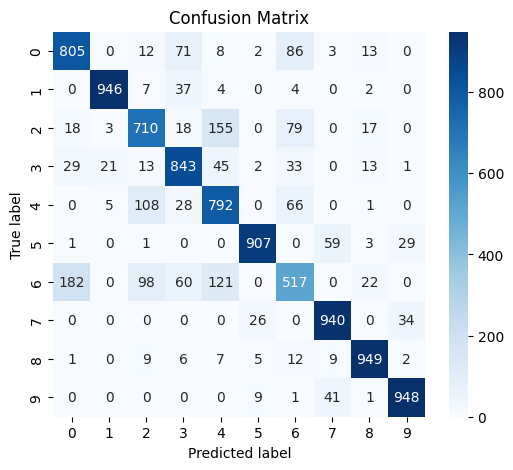

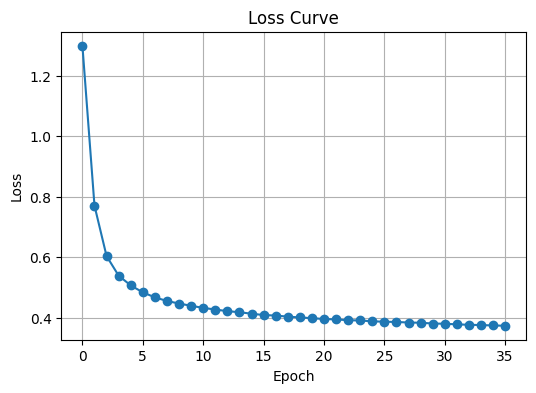

Training two layers with sizes (16, 8)
Train Accuracy 0.90745
Test Accuracy: 0.8623
training time 33.95896887779236
n_iter 44
Best validation score: 0.8743333333333333


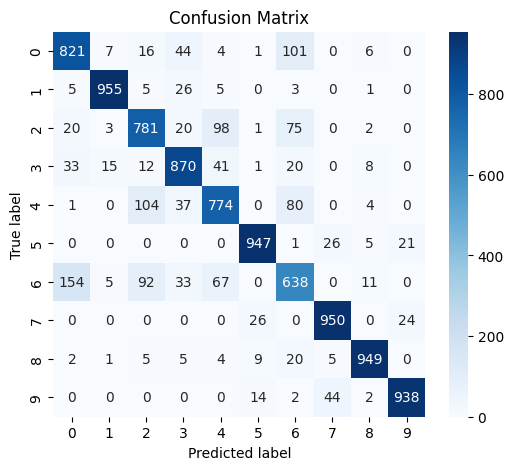

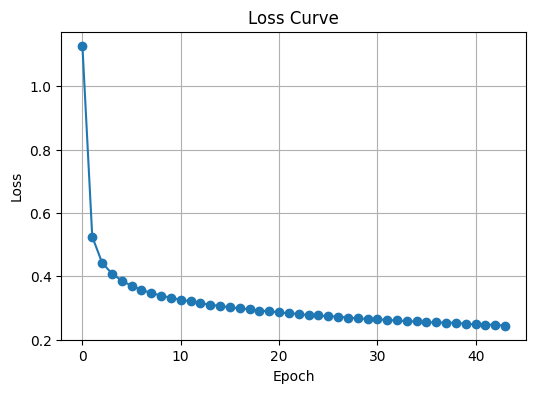

Training two layers with sizes (32, 16)
Train Accuracy 0.9048333333333334
Test Accuracy: 0.8676
training time 22.544549465179443
n_iter 21
Best validation score: 0.8765


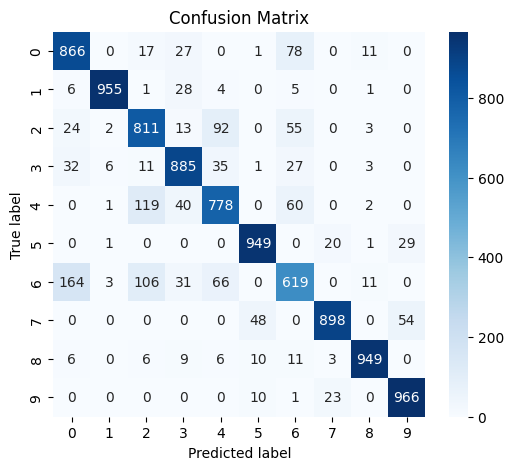

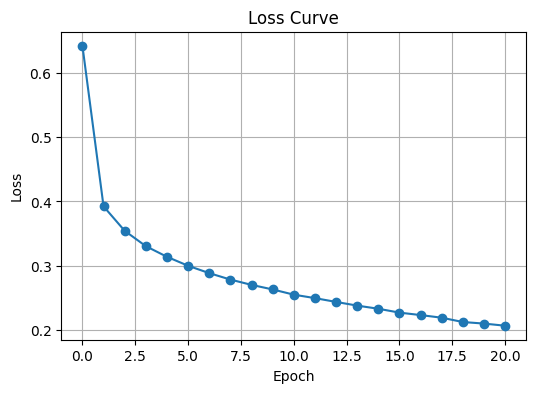

Training two layers with sizes (64, 32)
Train Accuracy 0.92235
Test Accuracy: 0.8745
training time 33.12567067146301
n_iter 20
Best validation score: 0.8873333333333333


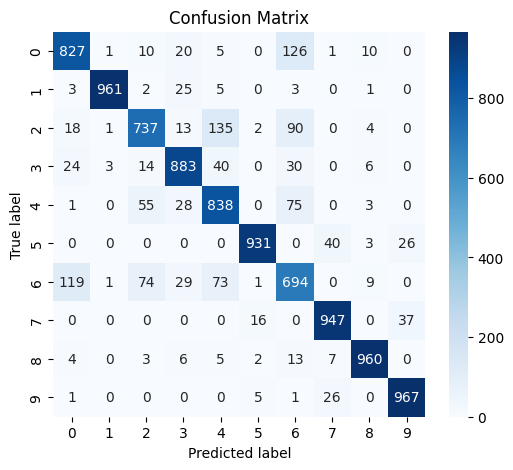

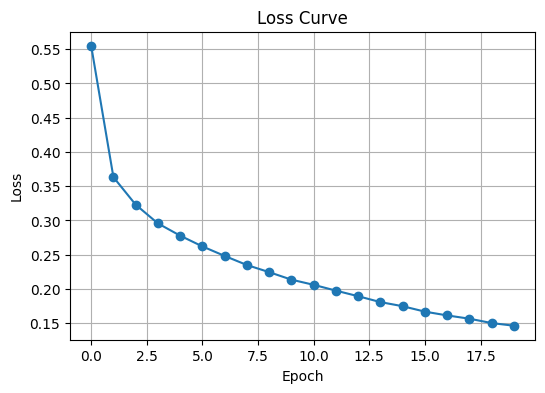

Training two layers with sizes (128, 64)
Train Accuracy 0.96185
Test Accuracy: 0.8833
training time 77.59334659576416
n_iter 29
Best validation score: 0.8951666666666667


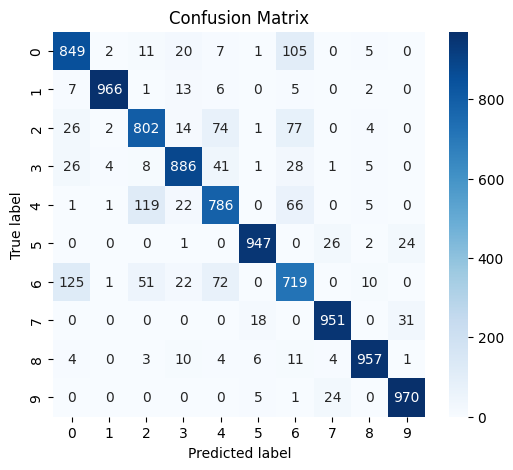

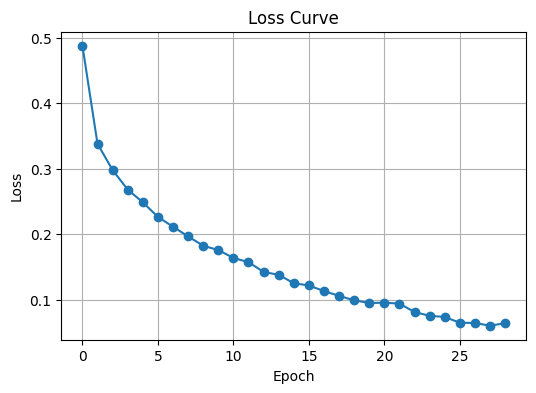

Training two layers with sizes (256, 128)
Train Accuracy 0.9639833333333333
Test Accuracy: 0.8894
training time 126.05667781829834
n_iter 25
Best validation score: 0.897


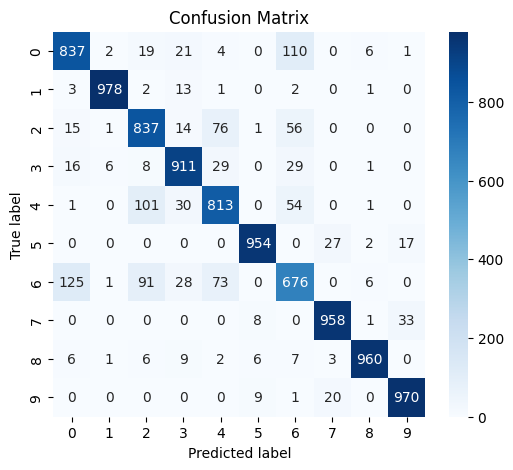

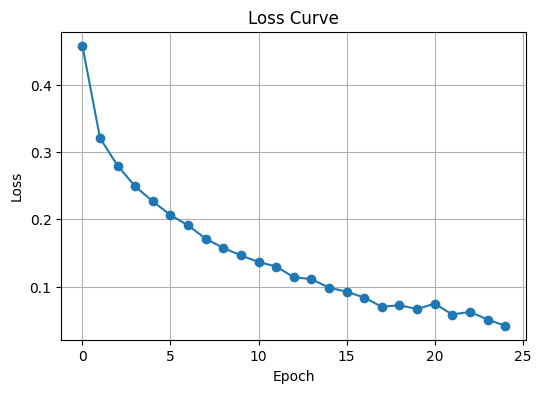

Training two layers with sizes (512, 256)
Train Accuracy 0.9708
Test Accuracy: 0.8915
training time 314.0488257408142
n_iter 29
Best validation score: 0.8986666666666666


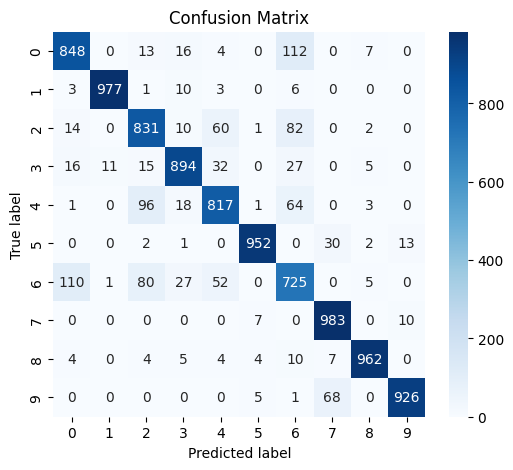

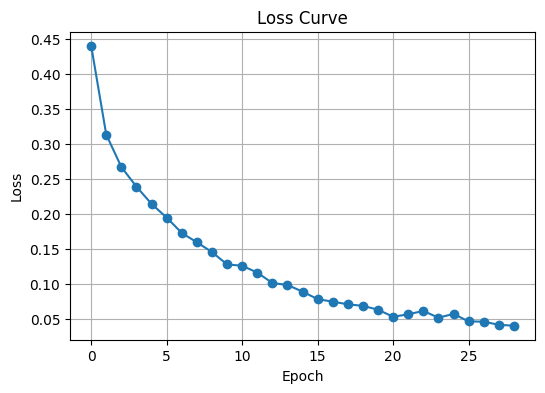

Training three layers with sizes (4, 2, 1)
Train Accuracy 0.49583333333333335
Test Accuracy: 0.4892
training time 23.357473850250244
n_iter 36
Best validation score: 0.4935


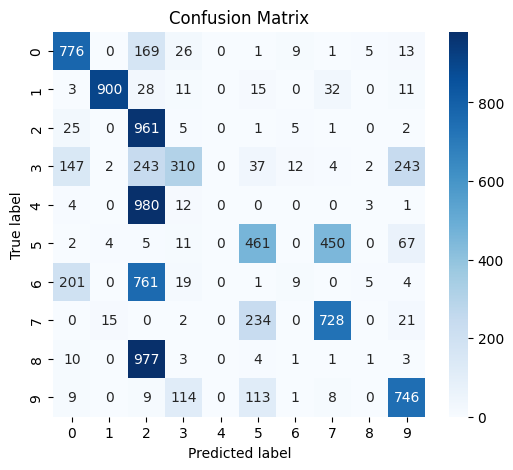

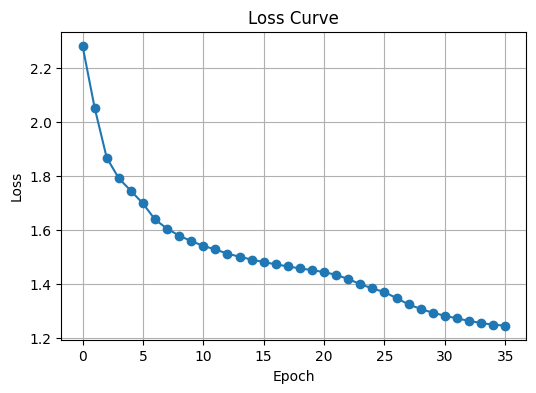

Training three layers with sizes (8, 4, 2)
Train Accuracy 0.8263333333333334
Test Accuracy: 0.8048
training time 35.39651703834534
n_iter 47
Best validation score: 0.814


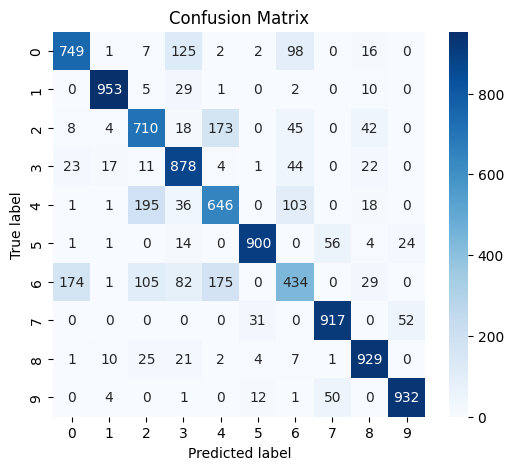

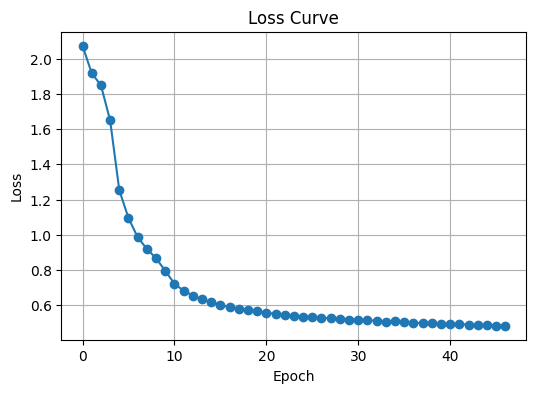

Training three layers with sizes (16, 8, 4)
Train Accuracy 0.8984833333333333
Test Accuracy: 0.849
training time 53.85065507888794
n_iter 63
Best validation score: 0.8558333333333333


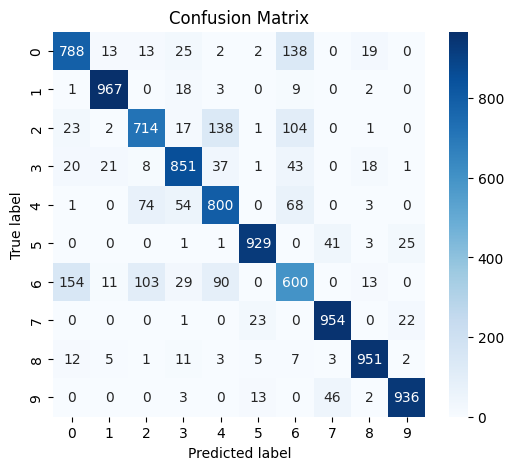

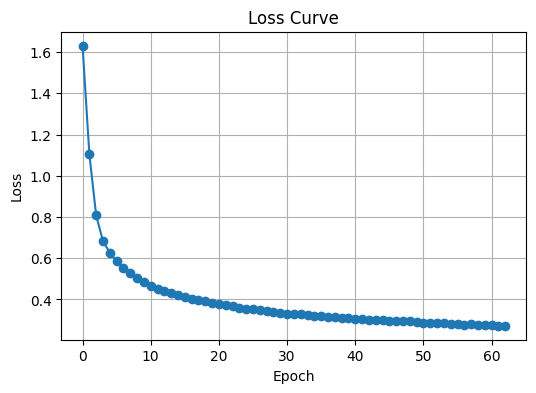

Training three layers with sizes (32, 16, 8)
Train Accuracy 0.9055833333333333
Test Accuracy: 0.8658
training time 21.43544316291809
n_iter 20
Best validation score: 0.8805


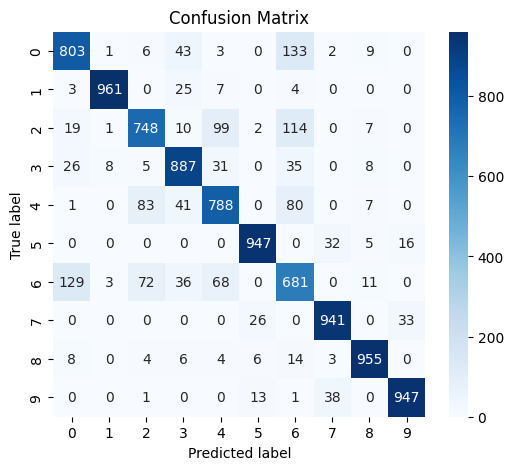

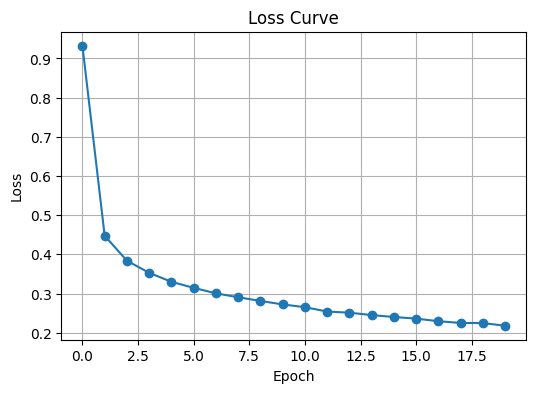

Training three layers with sizes (64, 32, 16)
Train Accuracy 0.9267833333333333
Test Accuracy: 0.8773
training time 35.144296407699585
n_iter 22
Best validation score: 0.8911666666666667


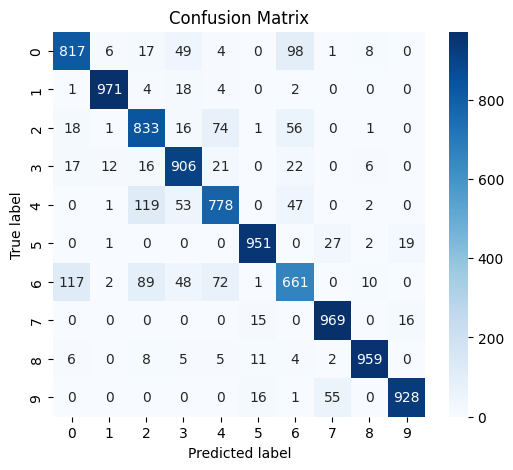

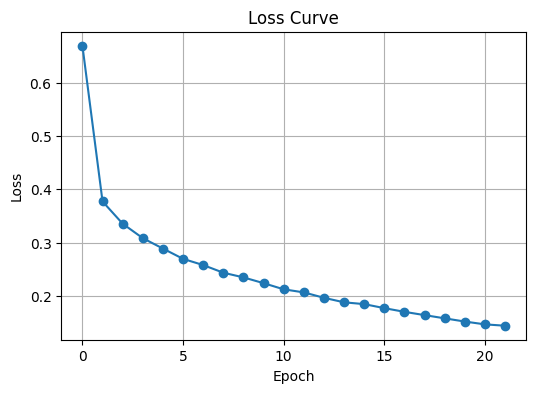

Training three layers with sizes (128, 64, 32)
Train Accuracy 0.9589
Test Accuracy: 0.8825
training time 77.32893705368042
n_iter 28
Best validation score: 0.8973333333333333


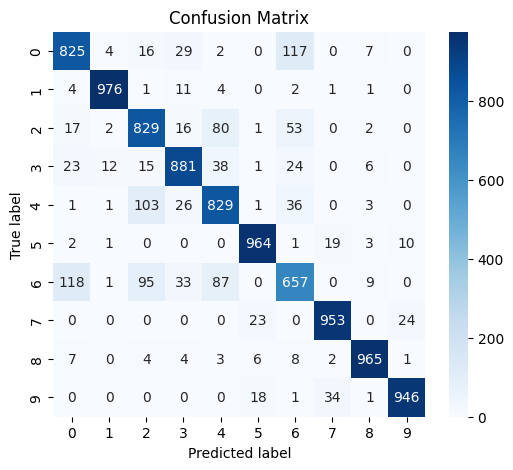

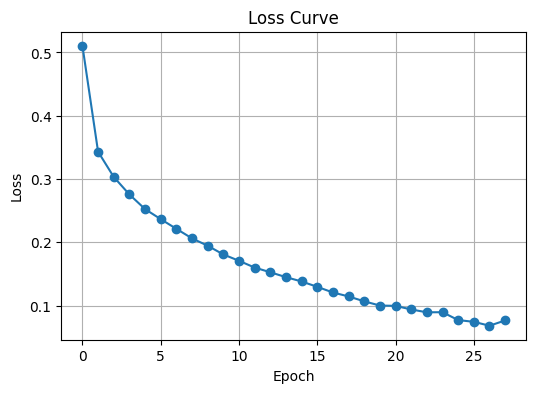

Training three layers with sizes (256, 128, 64)
Train Accuracy 0.9730166666666666
Test Accuracy: 0.889
training time 165.94943380355835
n_iter 31
Best validation score: 0.896


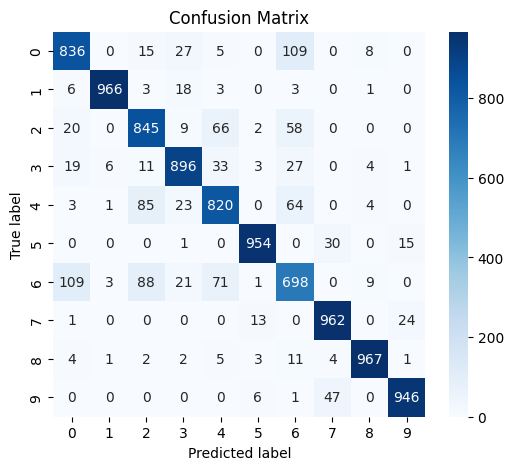

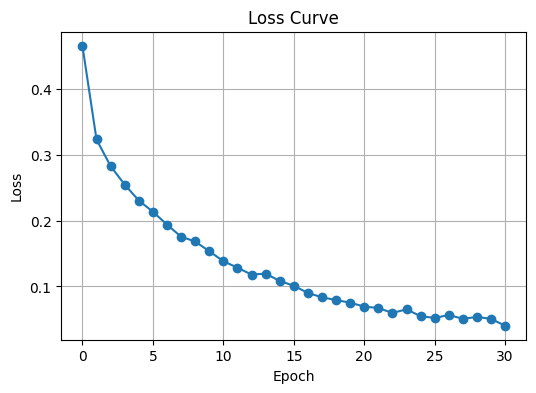

Training three layers with sizes (512, 256, 128)
Train Accuracy 0.9524333333333334
Test Accuracy: 0.8883
training time 247.37518525123596
n_iter 21
Best validation score: 0.8996666666666666


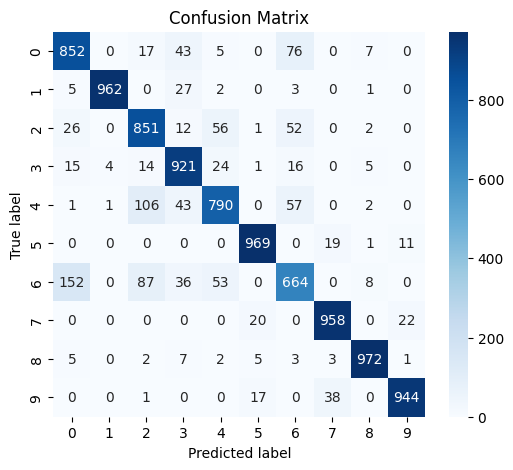

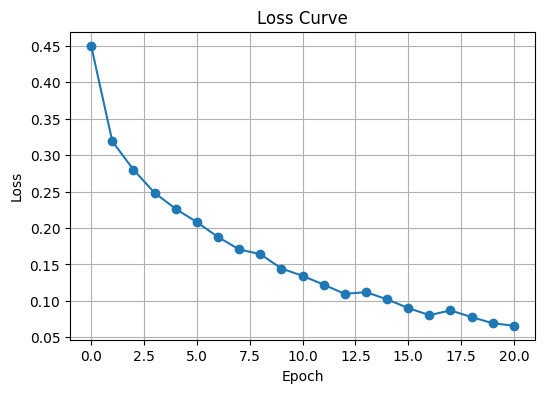

In [3]:
# nunmbers of hidden layers and neurons

results_dict = {
    '1-layer': [],
    '2-layer': [],
    '3-layer': []
}

# --- one hidden layer ---
for n in [2**i for i in range(0, 10)]:
    print(f"Training one layer with size ({n},)")
    result = train_mlp_pipeline(
        X_train, y_train, X_test, y_test,
        hidden_layer_sizes=(n,)
    )
    result['hidden_layer'] = (n,)
    results_dict['1-layer'].append(result)

# --- two hidden layers ---
for n in [2**i for i in range(0, 9)]:
    print(f"Training two layers with sizes ({2*n}, {n})")
    result = train_mlp_pipeline(
        X_train, y_train, X_test, y_test,
        hidden_layer_sizes=(2*n, n)
    )
    result['hidden_layer'] = (2*n, n)
    results_dict['2-layer'].append(result)

# --- three hidden layers ---
for n in [2**i for i in range(0, 8)]:
    print(f"Training three layers with sizes ({4*n}, {2*n}, {n})")
    result = train_mlp_pipeline(
        X_train, y_train, X_test, y_test,
        hidden_layer_sizes=(4*n, 2*n, n)
    )
    result['hidden_layer'] = (4*n, 2*n, n)
    results_dict['3-layer'].append(result)


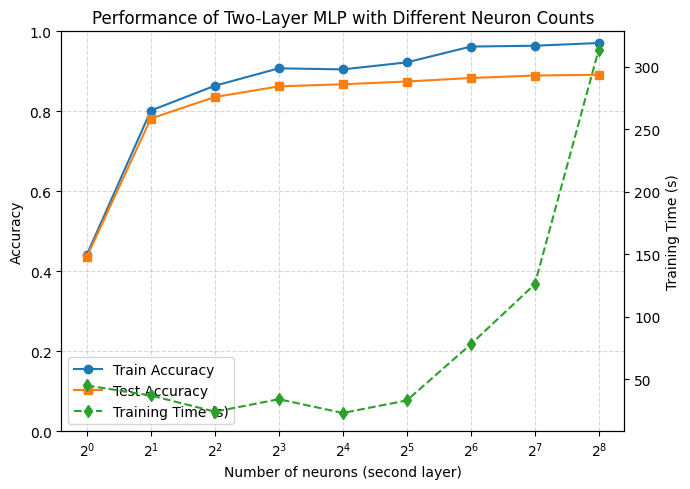

In [4]:
import matplotlib.pyplot as plt
import numpy as np

neuron_nums = np.array([1,2,4,8,16,32,64,128,256])
train_acc = np.array([0.4416,0.8019,0.8639,0.9075,0.9048,0.9224,0.9619,0.9640,0.9708])
test_acc  = np.array([0.4362,0.7819,0.8357,0.8623,0.8676,0.8745,0.8833,0.8894,0.8915])
training_time = np.array([45,37,24,34,23,33,78,126,314])

fig, ax1 = plt.subplots(figsize=(7,5))

# Plot train & test accuracy
ax1.plot(neuron_nums, train_acc, 'o-', label='Train Accuracy', color='tab:blue')
ax1.plot(neuron_nums, test_acc, 's-', label='Test Accuracy', color='tab:orange')
ax1.set_xlabel('Number of neurons (second layer)')
ax1.set_ylabel('Accuracy')
ax1.set_xscale('log', base=2)
ax1.set_xticks(neuron_nums)


exponents = np.log2(neuron_nums).astype(int)
ax1.set_xticklabels([f'$2^{e}$' for e in exponents])

ax1.set_ylim(0,1)
ax1.grid(True, linestyle='--', alpha=0.5)

# Plot training time on secondary y-axis
ax2 = ax1.twinx()
ax2.plot(neuron_nums, training_time, 'd--', label='Training Time (s)', color='tab:green')
ax2.set_ylabel('Training Time (s)')

# Combine legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc="best")

plt.title("Performance of Two-Layer MLP with Different Neuron Counts")
plt.tight_layout()
plt.show()


logistic
Train Accuracy 0.9377166666666666
Test Accuracy: 0.8788
training time 49.960068702697754
n_iter 37
Best validation score: 0.8863333333333333


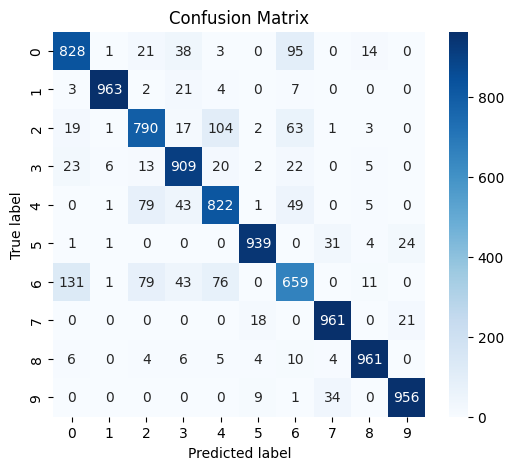

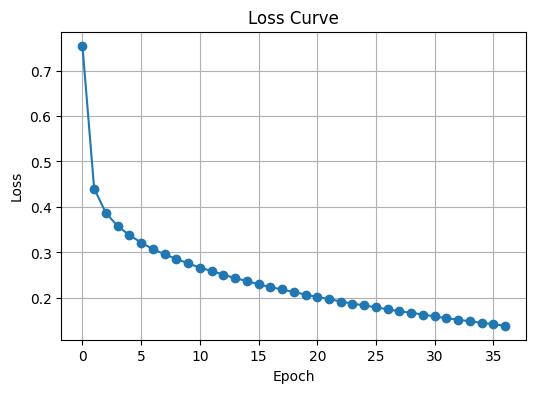

tanh
Train Accuracy 0.91845
Test Accuracy: 0.8718
training time 30.127553462982178
n_iter 19
Best validation score: 0.8826666666666667


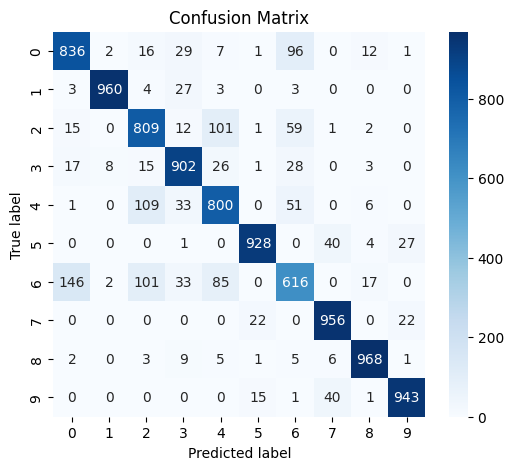

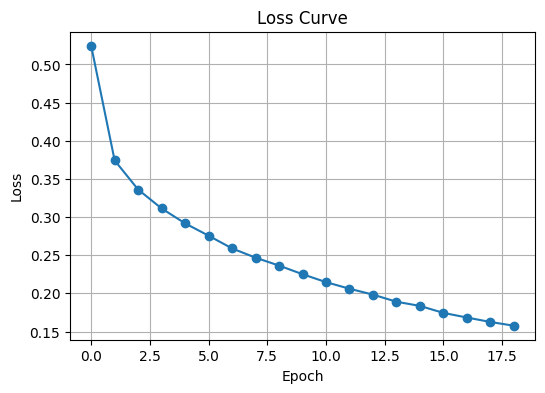

relu
Train Accuracy 0.9280333333333334
Test Accuracy: 0.879
training time 28.85929775238037
n_iter 22
Best validation score: 0.8898333333333334


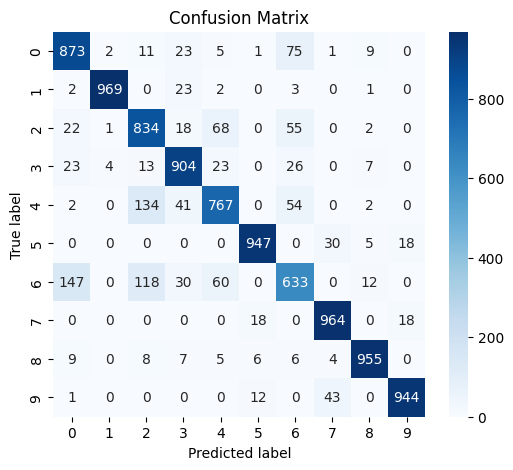

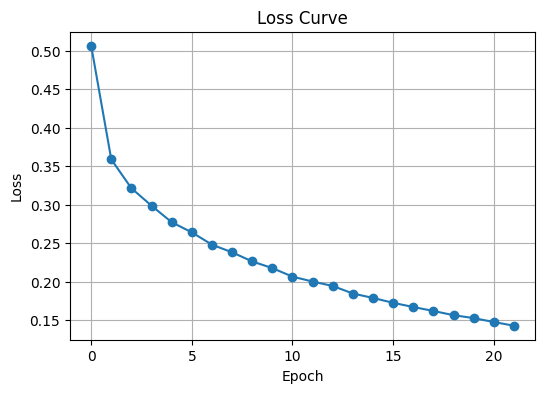

{'training accuracy': 0.9280333333333334,
 'testing accuracy': 0.879,
 'validation score': 0.8898333333333334,
 'confusion_matrix': array([[873,   2,  11,  23,   5,   1,  75,   1,   9,   0],
        [  2, 969,   0,  23,   2,   0,   3,   0,   1,   0],
        [ 22,   1, 834,  18,  68,   0,  55,   0,   2,   0],
        [ 23,   4,  13, 904,  23,   0,  26,   0,   7,   0],
        [  2,   0, 134,  41, 767,   0,  54,   0,   2,   0],
        [  0,   0,   0,   0,   0, 947,   0,  30,   5,  18],
        [147,   0, 118,  30,  60,   0, 633,   0,  12,   0],
        [  0,   0,   0,   0,   0,  18,   0, 964,   0,  18],
        [  9,   0,   8,   7,   5,   6,   6,   4, 955,   0],
        [  1,   0,   0,   0,   0,  12,   0,  43,   0, 944]]),
 'training_time': 28.85929775238037,
 'n_iter': 22,
 'loss_curve': [np.float64(0.5066122262089645),
  np.float64(0.35870956893420847),
  np.float64(0.3212581152443881),
  np.float64(0.2985727652288061),
  np.float64(0.2771167514343164),
  np.float64(0.263935120361314

In [5]:
print("logistic")
train_mlp_pipeline(X_train, y_train, X_test, y_test, activation='logistic')
print("tanh")
train_mlp_pipeline(X_train, y_train, X_test, y_test, activation='tanh')
print("relu")
train_mlp_pipeline(X_train, y_train, X_test, y_test, activation='relu')

adam
learning rate: 0.1
Train Accuracy 0.79515
Test Accuracy: 0.7801
training time 20.940958976745605
n_iter 15
Best validation score: 0.7888333333333334


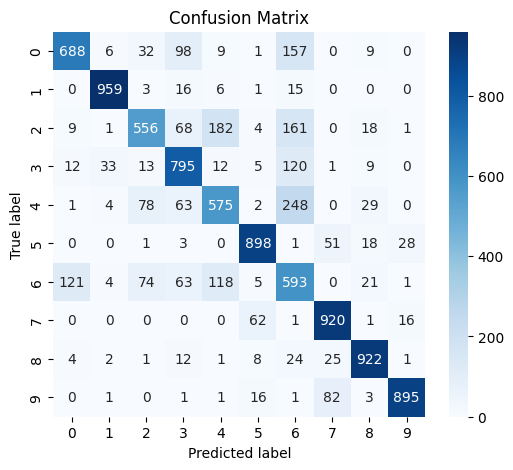

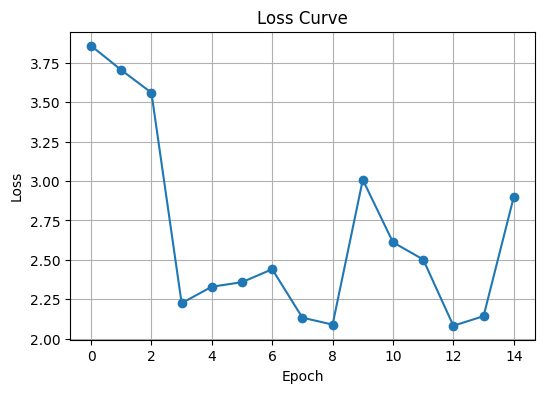

learning rate: 0.03162277660168379
Train Accuracy 0.8504
Test Accuracy: 0.8236
training time 22.636223554611206
n_iter 18
Best validation score: 0.8353333333333334


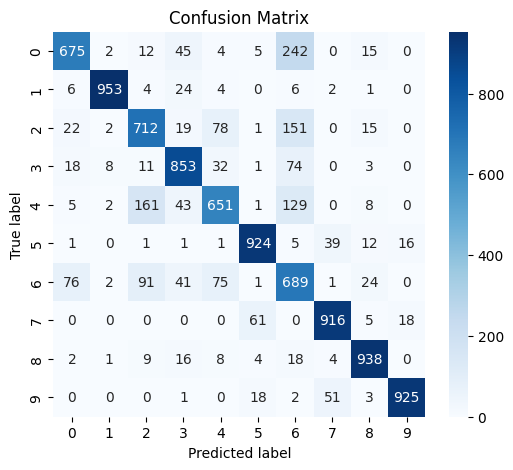

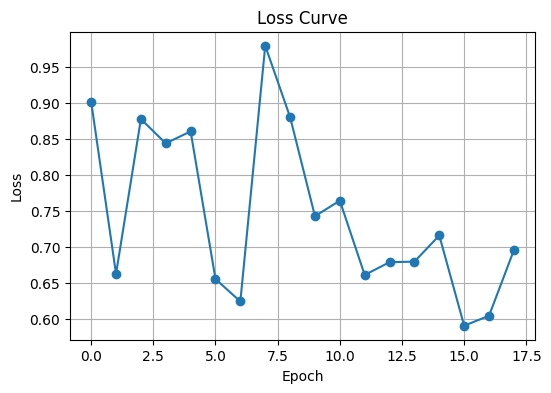

learning rate: 0.01
Train Accuracy 0.9108
Test Accuracy: 0.8676
training time 26.50377082824707
n_iter 22
Best validation score: 0.8771666666666667


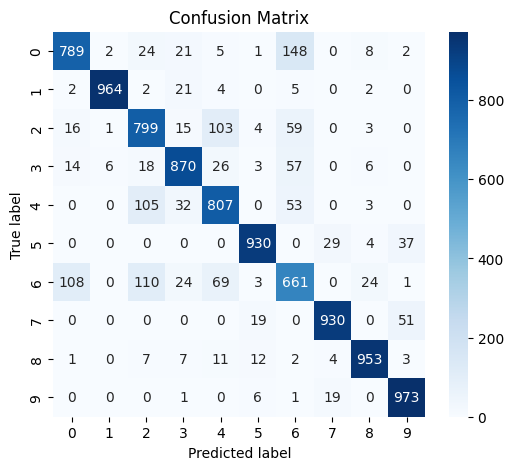

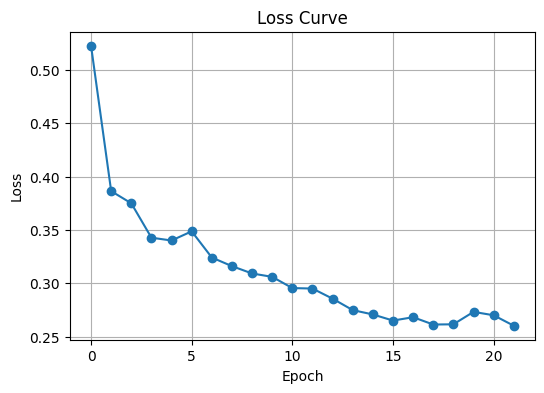

learning rate: 0.0031622776601683794
Train Accuracy 0.9305166666666667
Test Accuracy: 0.8777
training time 29.30862545967102
n_iter 22
Best validation score: 0.8865


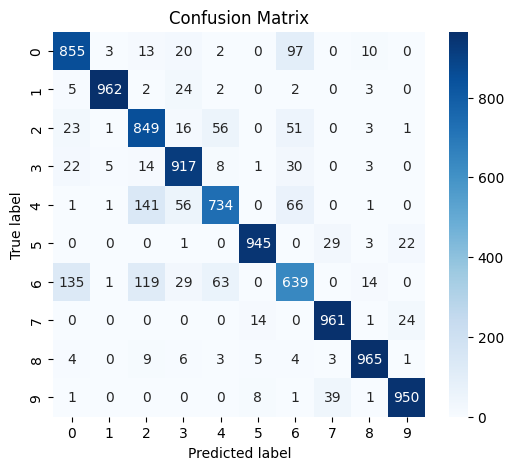

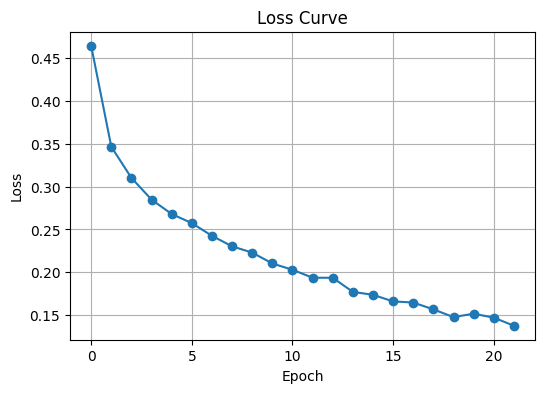

learning rate: 0.001
Train Accuracy 0.9280333333333334
Test Accuracy: 0.879
training time 29.132808923721313
n_iter 22
Best validation score: 0.8898333333333334


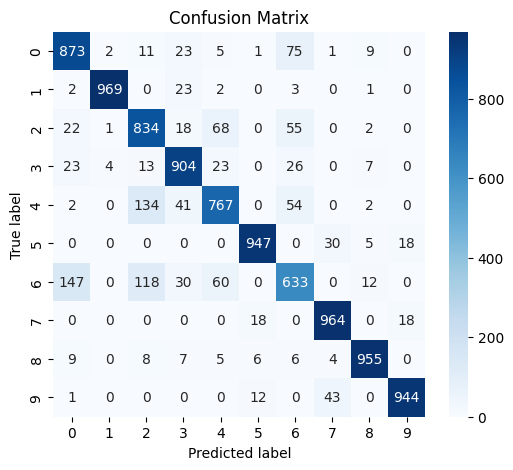

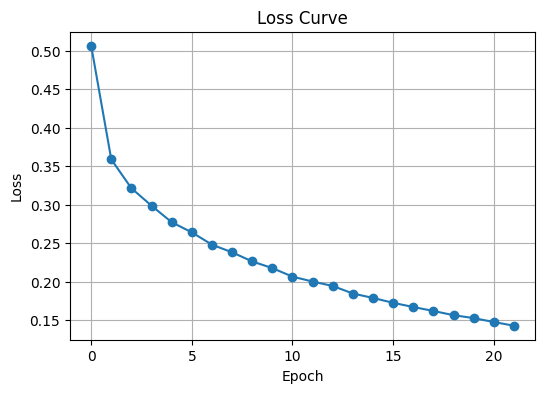

learning rate: 0.00031622776601683794
Train Accuracy 0.9435666666666667
Test Accuracy: 0.8786
training time 58.36354327201843
n_iter 48
Best validation score: 0.8898333333333334


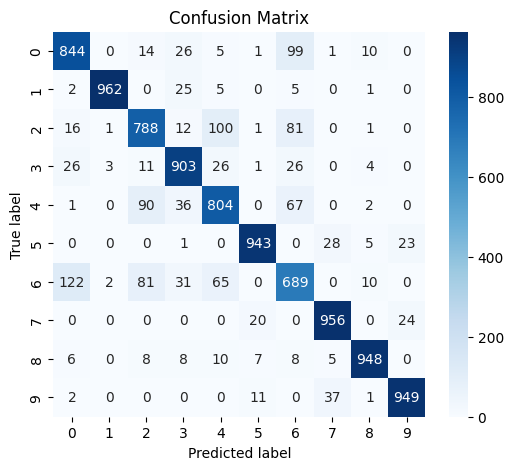

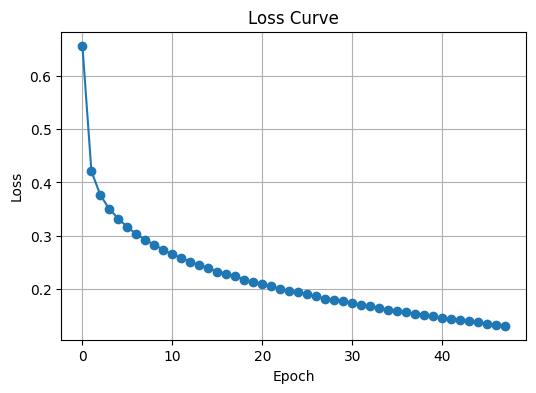

learning rate: 0.0001
Train Accuracy 0.93185
Test Accuracy: 0.8791
training time 92.38975024223328
n_iter 77
Best validation score: 0.892


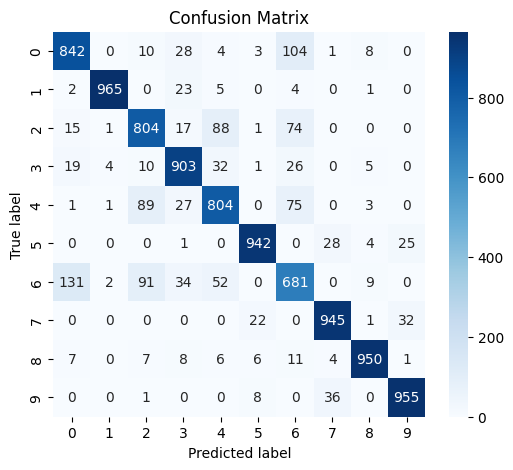

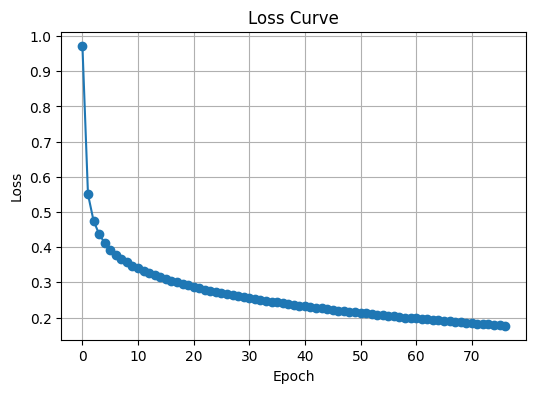

learning rate: 3.1622776601683795e-05
Train Accuracy 0.9043333333333333
Test Accuracy: 0.8707
training time 107.58116030693054
n_iter 87
Best validation score: 0.885


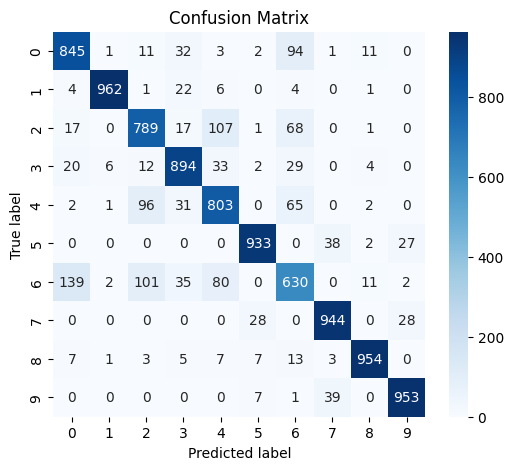

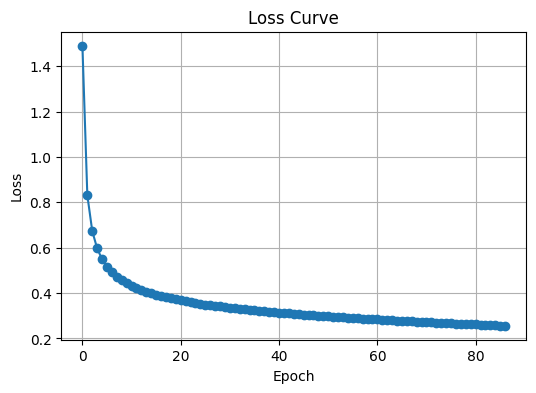

learning rate: 1e-05
Train Accuracy 0.8945
Test Accuracy: 0.8663
training time 217.52908611297607
n_iter 168
Best validation score: 0.8785


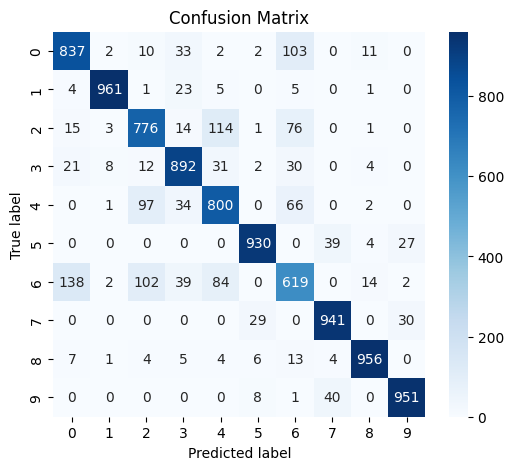

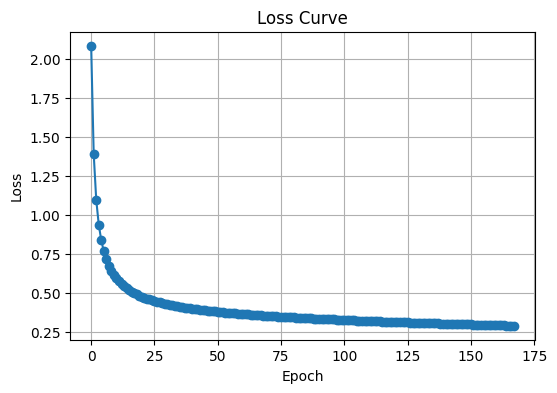

In [7]:
# solver&learning rate (adam)

import numpy as np

lrs = np.logspace(-1, -5, num=9)
print("adam")
for lr in lrs:
  print(f"learning rate: {lr}")
  train_mlp_pipeline(X_train, y_train, X_test, y_test, solver='adam', learning_rate_init=lr)

learning rate: 0.1
sgd+constant
Train Accuracy 0.9286166666666666
Test Accuracy: 0.8686
training time 26.627338886260986
n_iter 24
Best validation score: 0.8821666666666667


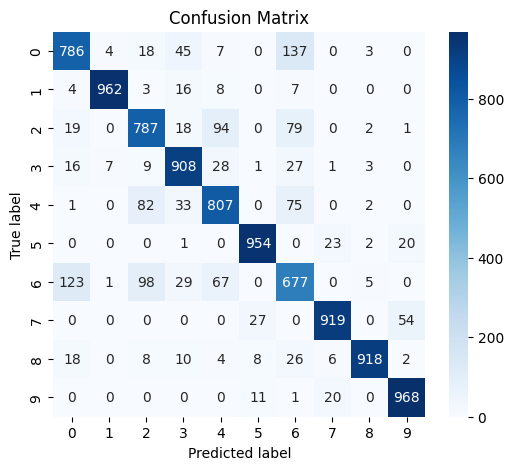

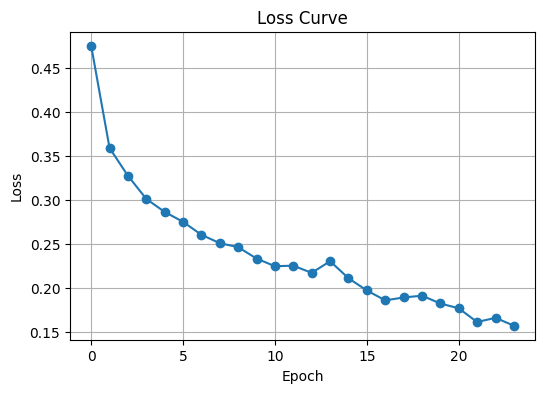

sgd+invscaling
Train Accuracy 0.9286166666666666
Test Accuracy: 0.8686
training time 26.52526831626892
n_iter 24
Best validation score: 0.8821666666666667


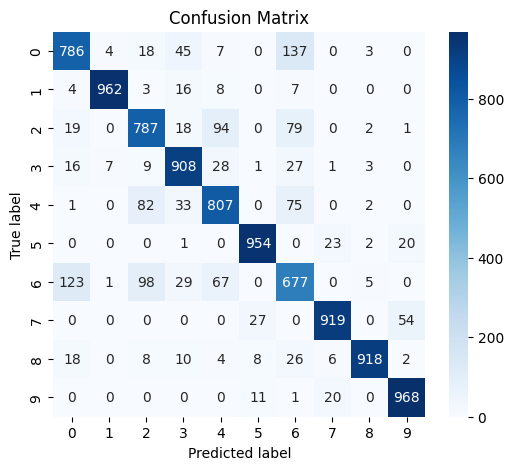

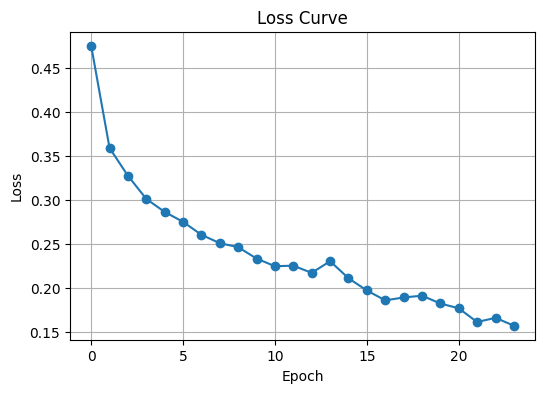

sgd+adaptive
Train Accuracy 0.9286166666666666
Test Accuracy: 0.8686
training time 26.547533750534058
n_iter 24
Best validation score: 0.8821666666666667


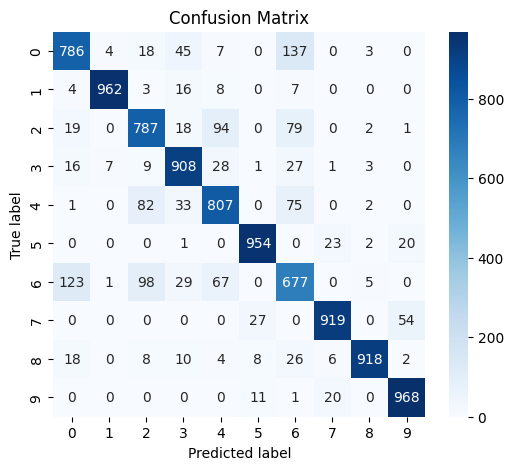

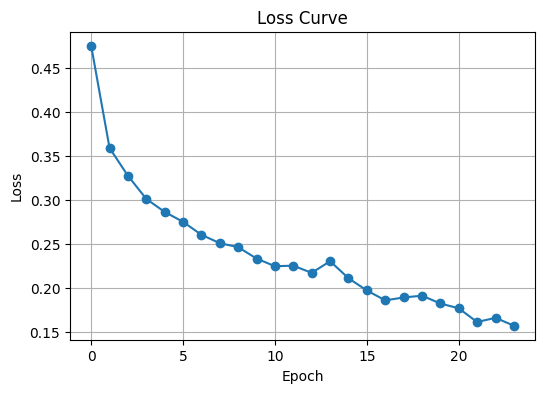

learning rate: 0.03162277660168379
sgd+constant
Train Accuracy 0.923
Test Accuracy: 0.8752
training time 23.619413137435913
n_iter 19
Best validation score: 0.8886666666666667


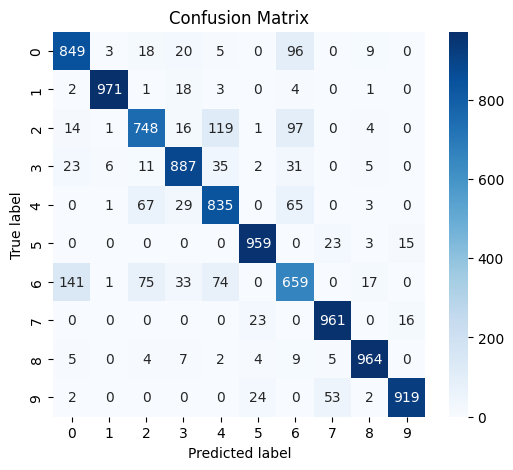

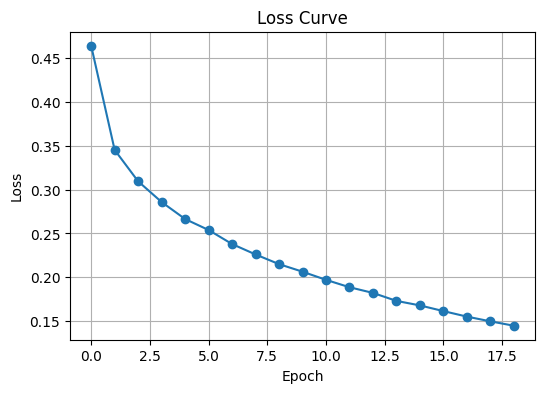

sgd+invscaling
Train Accuracy 0.923
Test Accuracy: 0.8752
training time 20.105385780334473
n_iter 19
Best validation score: 0.8886666666666667


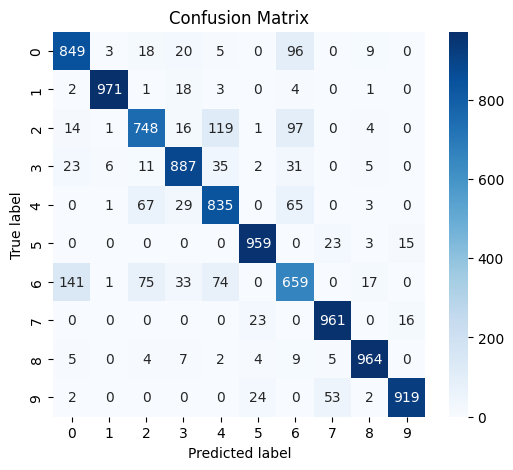

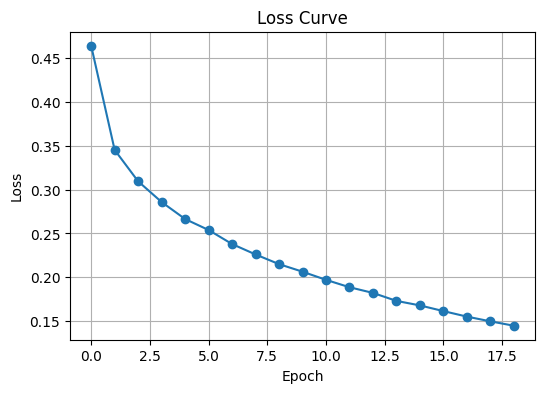

sgd+adaptive
Train Accuracy 0.923
Test Accuracy: 0.8752
training time 20.49020504951477
n_iter 19
Best validation score: 0.8886666666666667


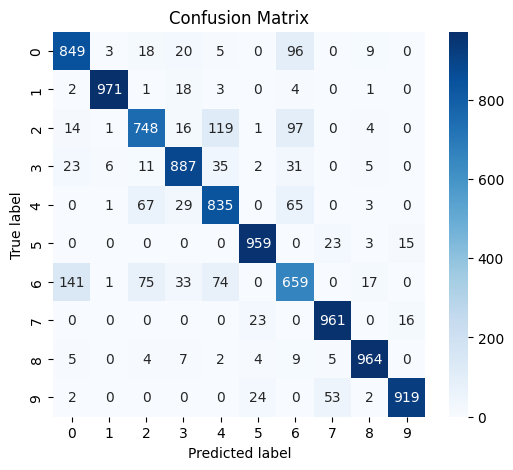

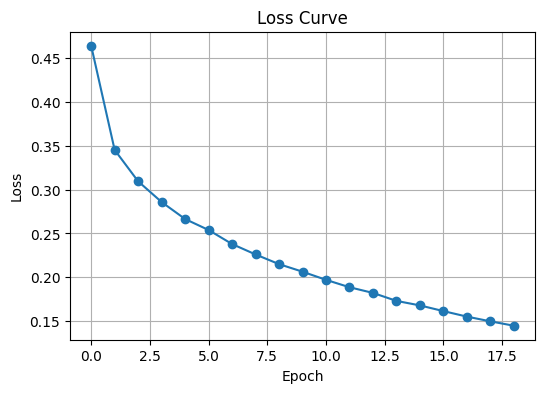

learning rate: 0.01
sgd+constant
Train Accuracy 0.93825
Test Accuracy: 0.879
training time 38.09090852737427
n_iter 33
Best validation score: 0.8913333333333333


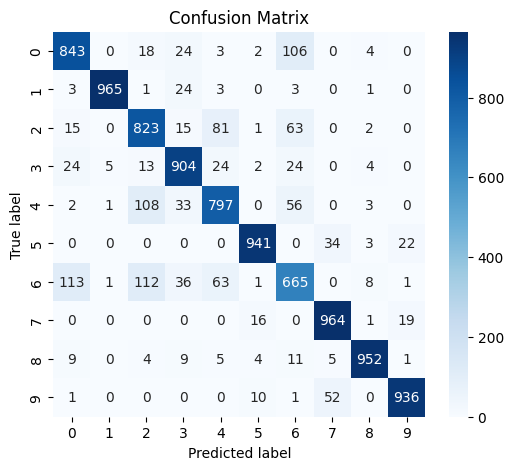

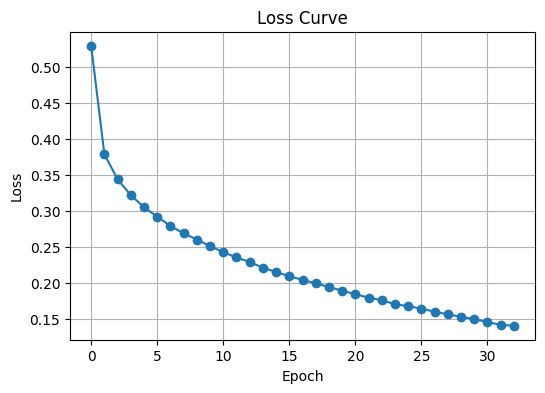

sgd+invscaling
Train Accuracy 0.93825
Test Accuracy: 0.879
training time 37.17212247848511
n_iter 33
Best validation score: 0.8913333333333333


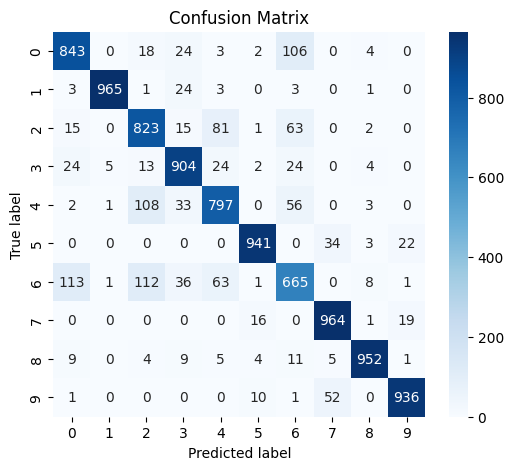

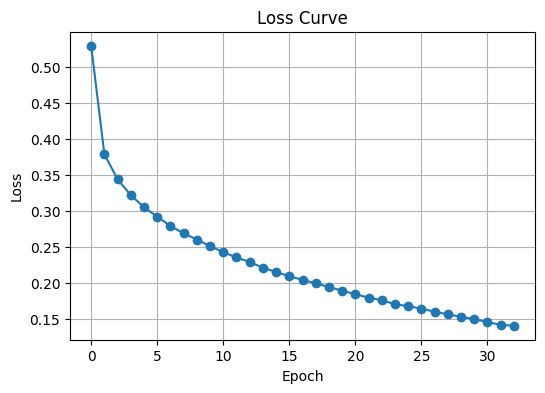

sgd+adaptive
Train Accuracy 0.93825
Test Accuracy: 0.879
training time 37.54579305648804
n_iter 33
Best validation score: 0.8913333333333333


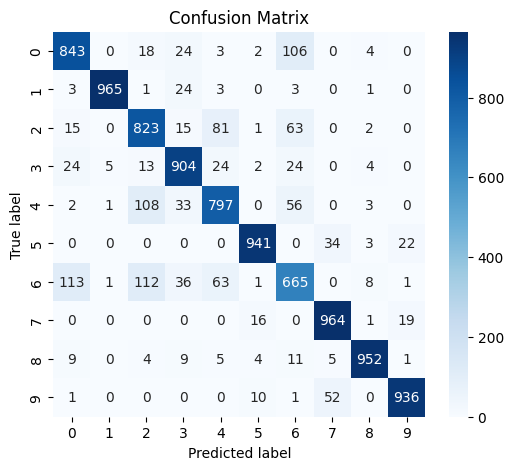

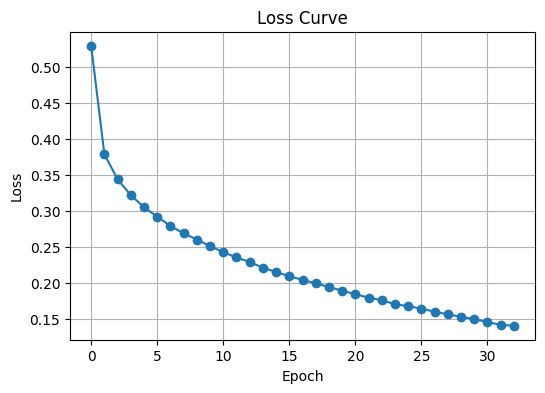

learning rate: 0.0031622776601683794
sgd+constant
Train Accuracy 0.9168833333333334
Test Accuracy: 0.8768
training time 43.47783422470093
n_iter 40
Best validation score: 0.889


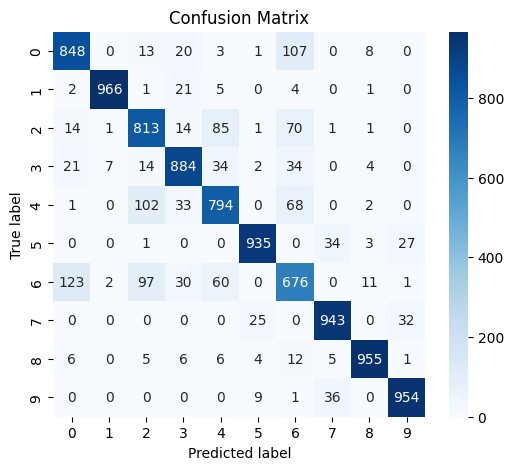

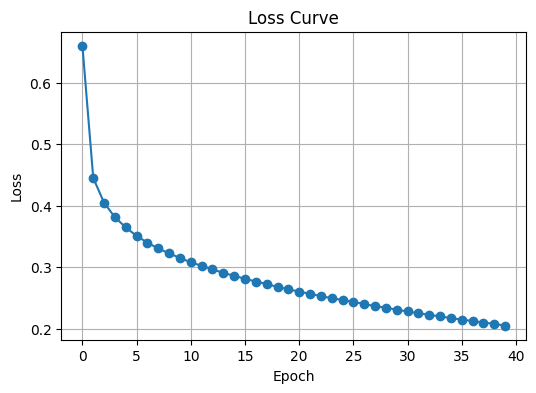

sgd+invscaling
Train Accuracy 0.9168833333333334
Test Accuracy: 0.8768
training time 45.7590012550354
n_iter 40
Best validation score: 0.889


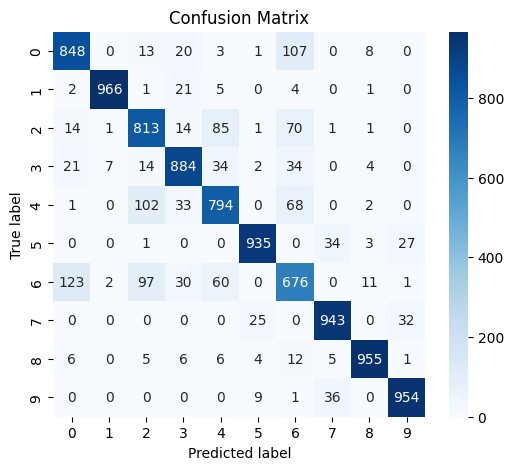

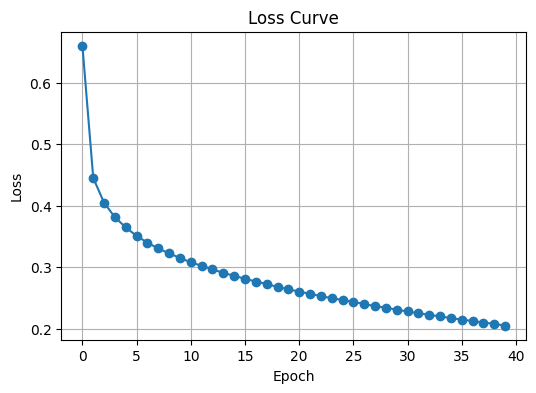

sgd+adaptive
Train Accuracy 0.9168833333333334
Test Accuracy: 0.8768
training time 43.67179250717163
n_iter 40
Best validation score: 0.889


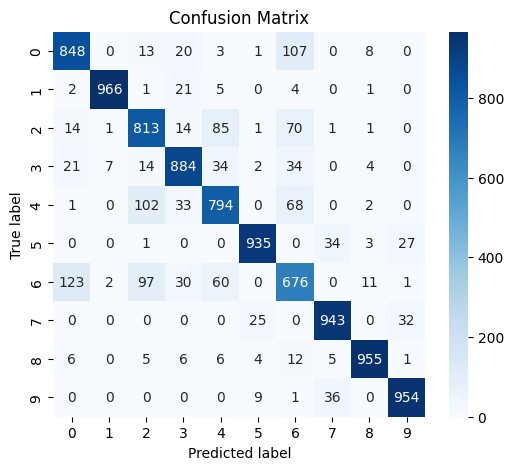

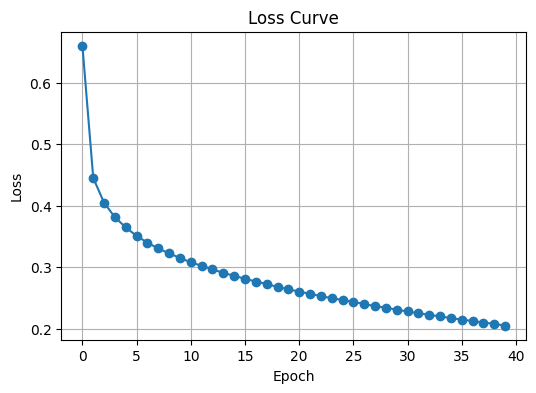

learning rate: 0.001
sgd+constant
Train Accuracy 0.90405
Test Accuracy: 0.8722
training time 74.48176503181458
n_iter 66
Best validation score: 0.8848333333333334


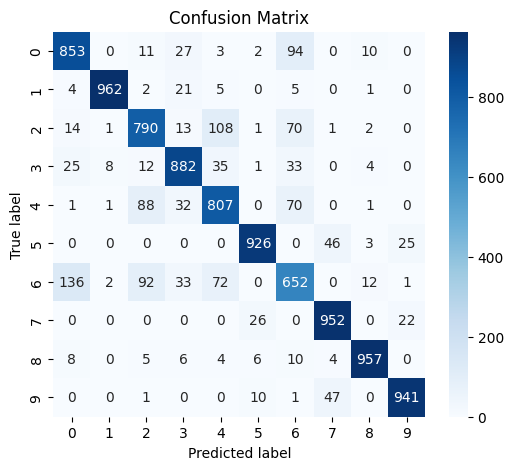

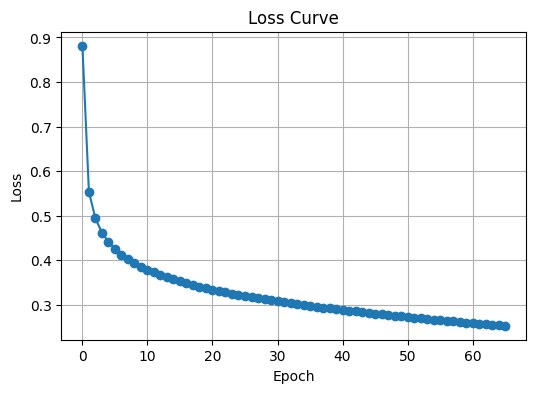

sgd+invscaling
Train Accuracy 0.90405
Test Accuracy: 0.8722
training time 71.55677890777588
n_iter 66
Best validation score: 0.8848333333333334


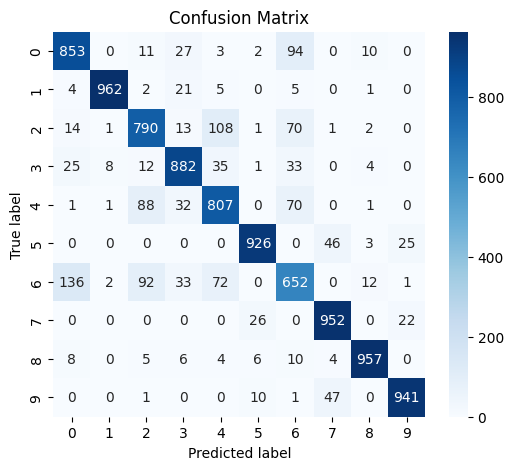

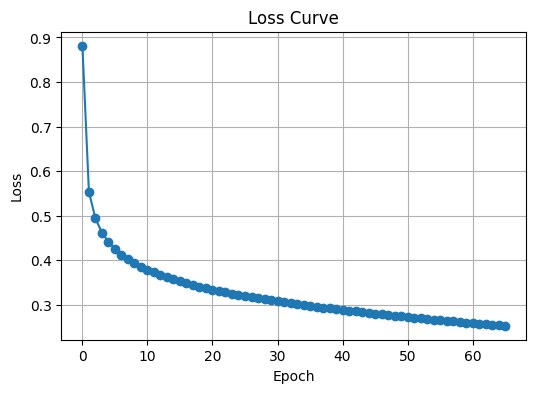

sgd+adaptive
Train Accuracy 0.90405
Test Accuracy: 0.8722
training time 76.71627259254456
n_iter 66
Best validation score: 0.8848333333333334


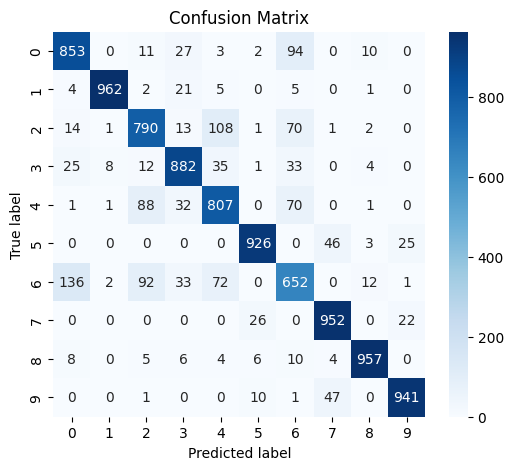

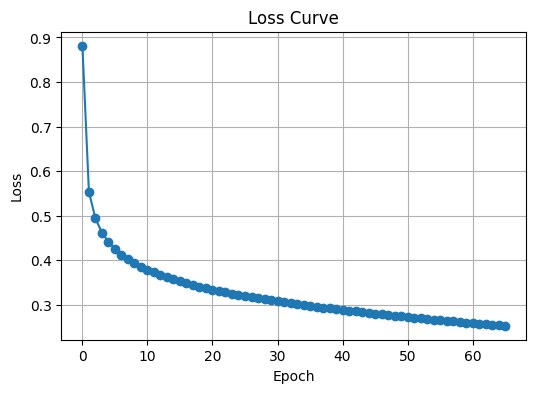

learning rate: 0.00031622776601683794
sgd+constant
Train Accuracy 0.8960333333333333
Test Accuracy: 0.868
training time 148.14271593093872
n_iter 135
Best validation score: 0.8803333333333333


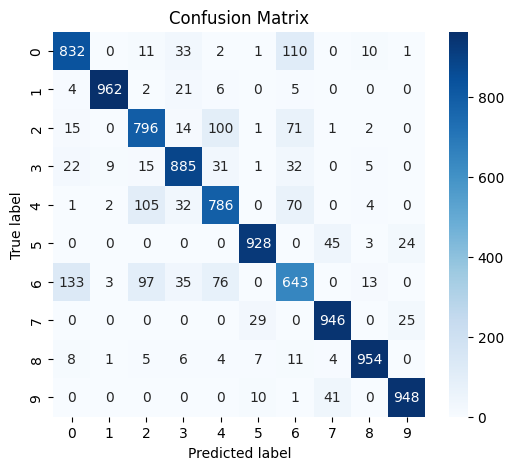

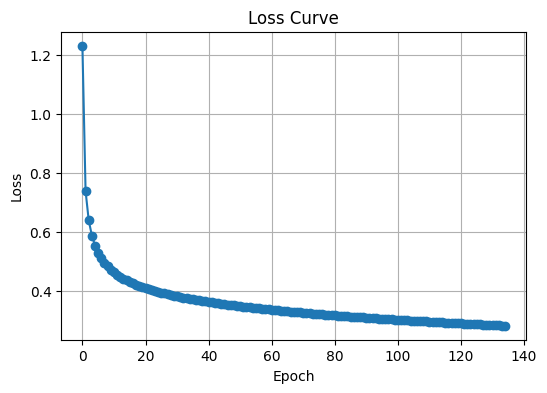

sgd+invscaling
Train Accuracy 0.8960333333333333
Test Accuracy: 0.868
training time 151.23194694519043
n_iter 135
Best validation score: 0.8803333333333333


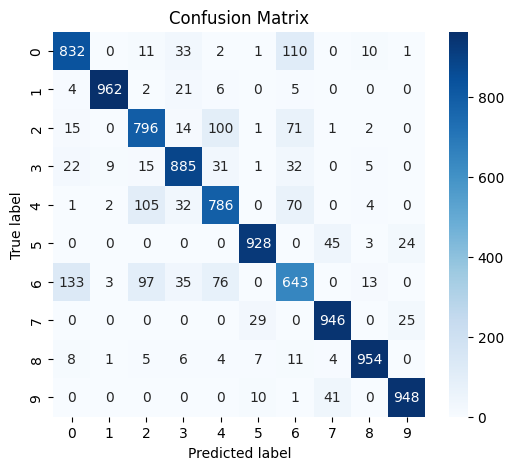

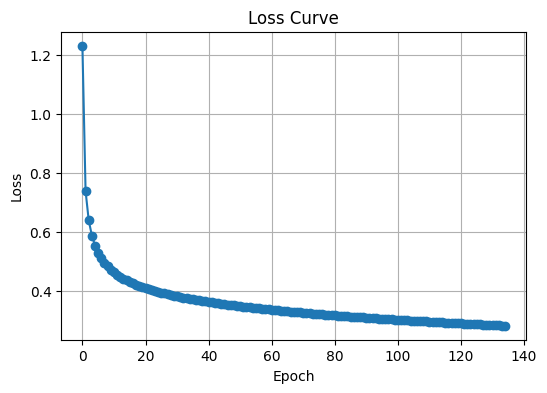

sgd+adaptive
Train Accuracy 0.8960333333333333
Test Accuracy: 0.868
training time 149.29886746406555
n_iter 135
Best validation score: 0.8803333333333333


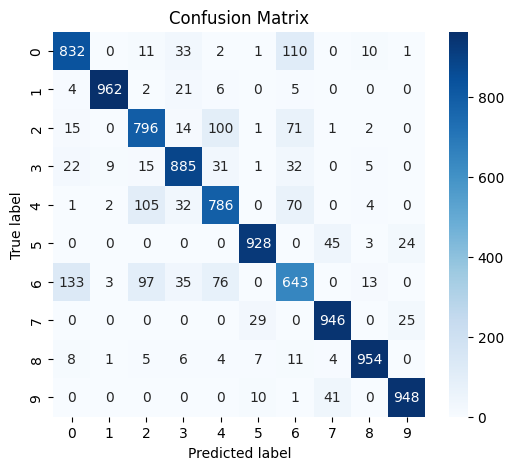

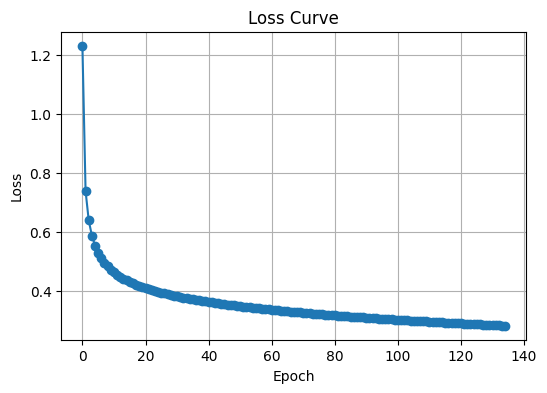

learning rate: 0.0001
sgd+constant
Train Accuracy 0.8758
Test Accuracy: 0.8537
training time 178.71291160583496
n_iter 164
Best validation score: 0.8676666666666667


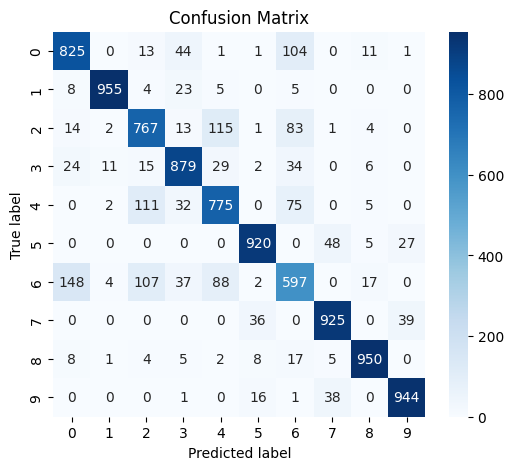

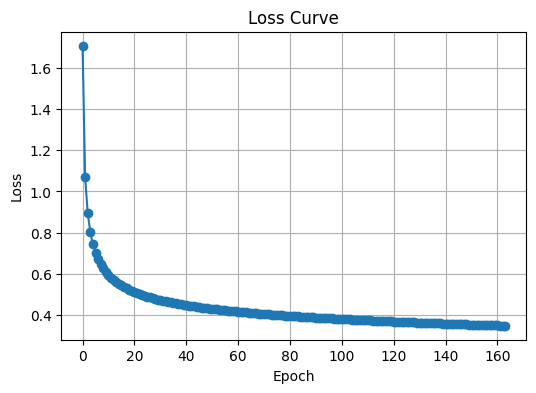

sgd+invscaling
Train Accuracy 0.8758
Test Accuracy: 0.8537
training time 183.07253313064575
n_iter 164
Best validation score: 0.8676666666666667


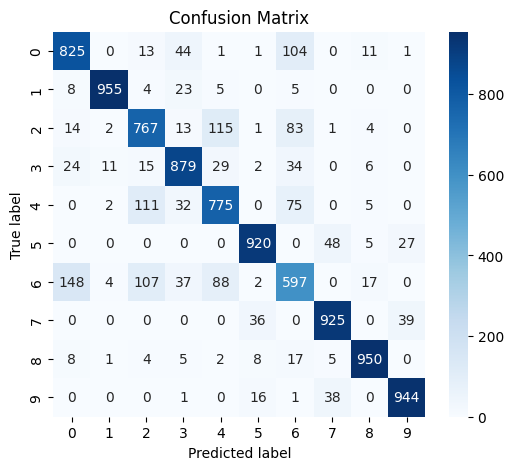

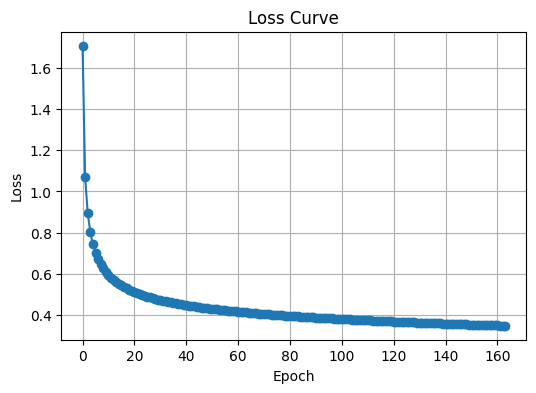

sgd+adaptive
Train Accuracy 0.8758
Test Accuracy: 0.8537
training time 182.03648400306702
n_iter 164
Best validation score: 0.8676666666666667


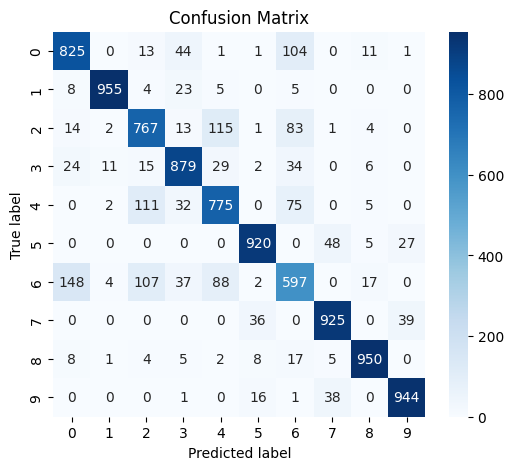

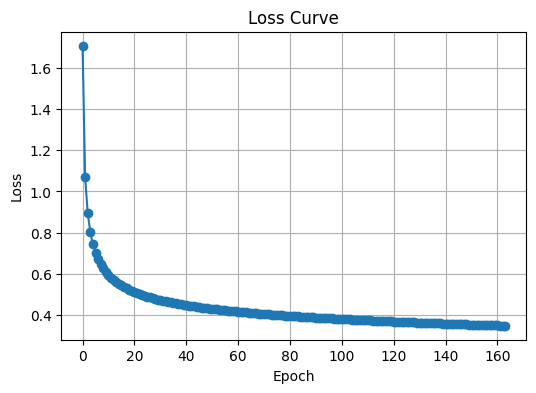

learning rate: 3.1622776601683795e-05
sgd+constant


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Accuracy 0.8551166666666666
Test Accuracy: 0.8386
training time 222.96625471115112
n_iter 200
Best validation score: 0.8461666666666666


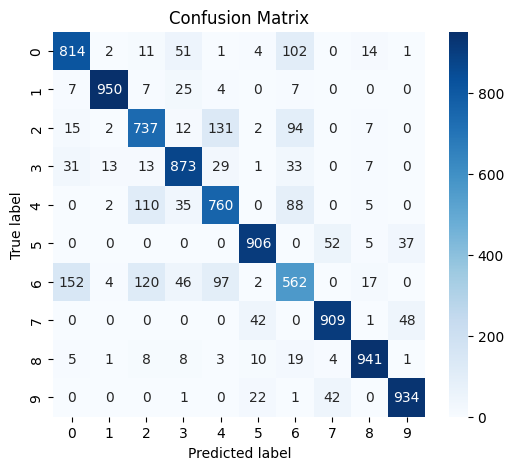

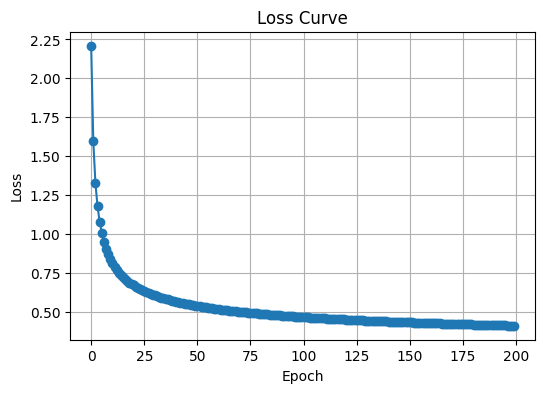

sgd+invscaling


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Accuracy 0.8551166666666666
Test Accuracy: 0.8386
training time 222.27987813949585
n_iter 200
Best validation score: 0.8461666666666666


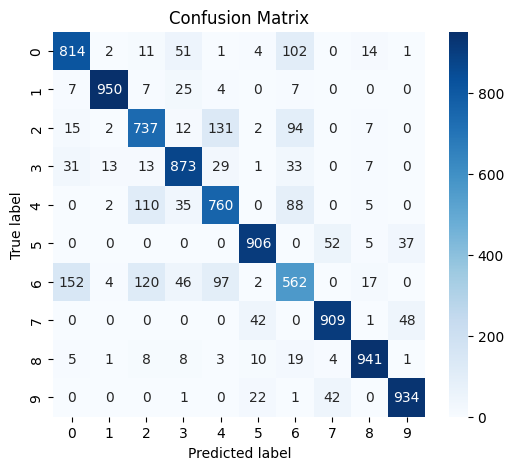

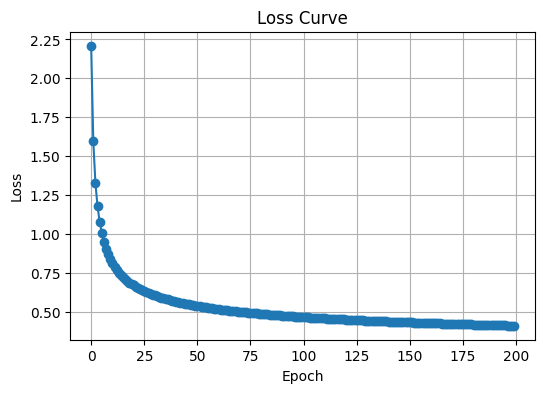

sgd+adaptive


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Accuracy 0.8551166666666666
Test Accuracy: 0.8386
training time 221.18798899650574
n_iter 200
Best validation score: 0.8461666666666666


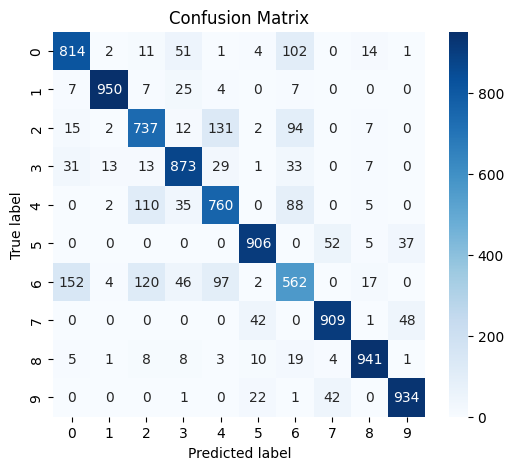

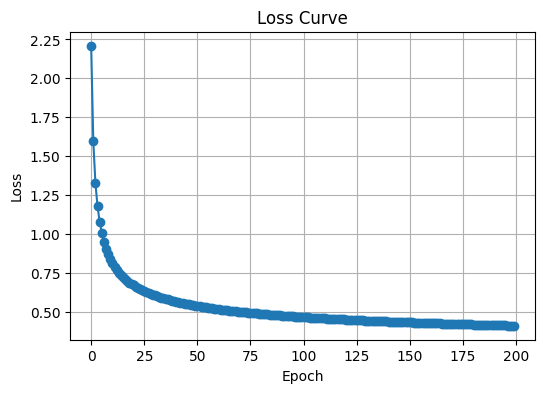

learning rate: 1e-05
sgd+constant


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Accuracy 0.8207333333333333
Test Accuracy: 0.8072
training time 224.8480384349823
n_iter 200
Best validation score: 0.8108333333333333


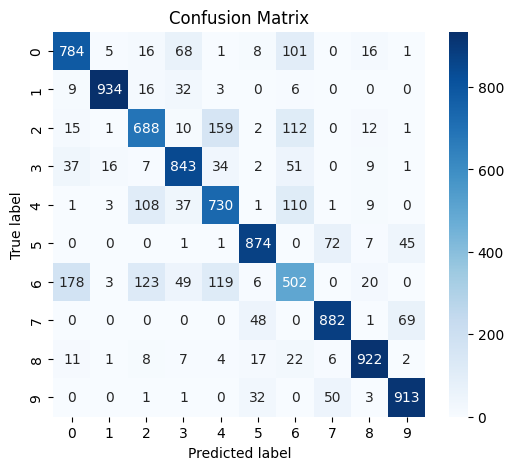

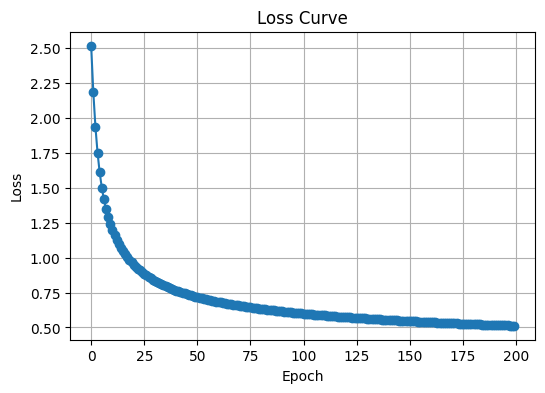

sgd+invscaling


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Accuracy 0.8207333333333333
Test Accuracy: 0.8072
training time 222.73583030700684
n_iter 200
Best validation score: 0.8108333333333333


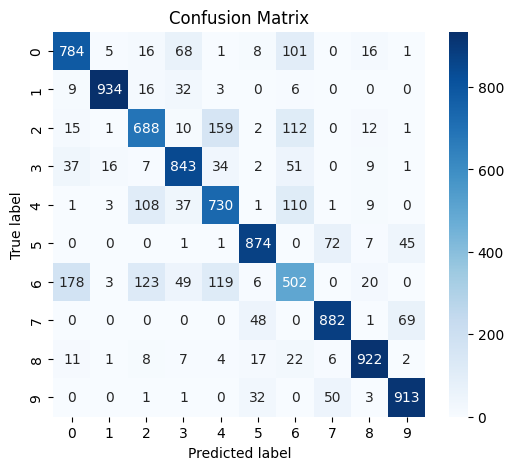

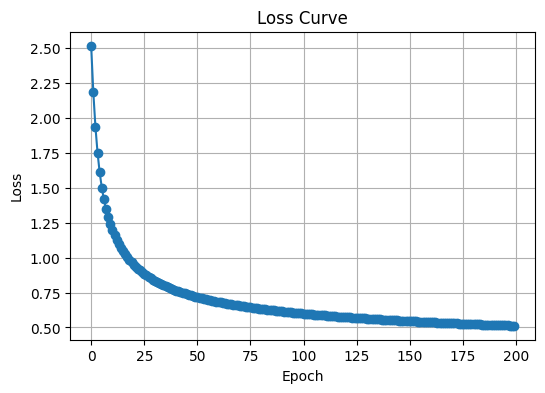

sgd+adaptive


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Accuracy 0.8207333333333333
Test Accuracy: 0.8072
training time 219.82864141464233
n_iter 200
Best validation score: 0.8108333333333333


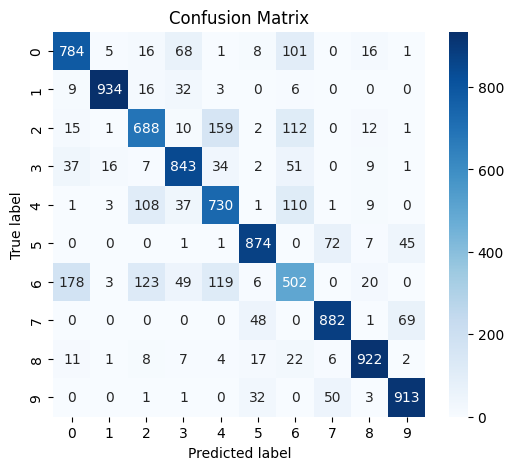

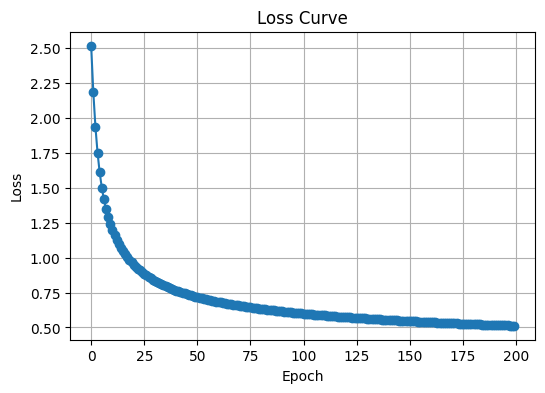

In [12]:
import numpy as np

lrs = np.logspace(-1, -5, num=9)

for lr in lrs:
  print(f"learning rate: {lr}")
  print("sgd+constant")
  train_mlp_pipeline(X_train, y_train, X_test, y_test, solver='sgd', learning_rate = 'constant', learning_rate_init = lr)
  print("sgd+invscaling")
  train_mlp_pipeline(X_train, y_train, X_test, y_test, solver='sgd', learning_rate = 'invscaling', learning_rate_init = lr)
  print("sgd+adaptive")
  train_mlp_pipeline(X_train, y_train, X_test, y_test, solver='sgd', learning_rate = 'adaptive', learning_rate_init = lr)


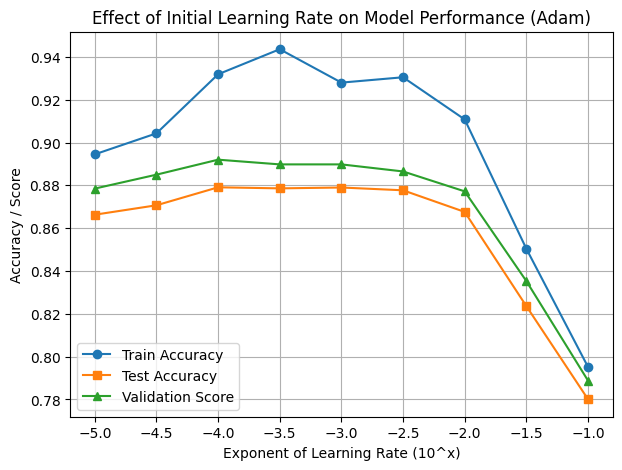

In [2]:
import matplotlib.pyplot as plt
import numpy as np

# Data
lr_exp = np.array([-1, -1.5, -2, -2.5, -3, -3.5, -4, -4.5, -5])  # exponent part of 10^x
train_acc = np.array([0.7952, 0.8504, 0.9108, 0.9305, 0.9280, 0.9436, 0.9319, 0.9043, 0.8945])
test_acc = np.array([0.7801, 0.8236, 0.8676, 0.8777, 0.8790, 0.8786, 0.8791, 0.8707, 0.8663])
val_score = np.array([0.7888, 0.8353, 0.8772, 0.8865, 0.8898, 0.8898, 0.8920, 0.8850, 0.8785])

# Plot
plt.figure(figsize=(7,5))
plt.plot(lr_exp, train_acc, marker='o', label='Train Accuracy')
plt.plot(lr_exp, test_acc, marker='s', label='Test Accuracy')
plt.plot(lr_exp, val_score, marker='^', label='Validation Score')

plt.xlabel('Exponent of Learning Rate (10^x)')
plt.ylabel('Accuracy / Score')
plt.title('Effect of Initial Learning Rate on Model Performance (Adam)')
plt.legend()
plt.grid(True)
plt.show()



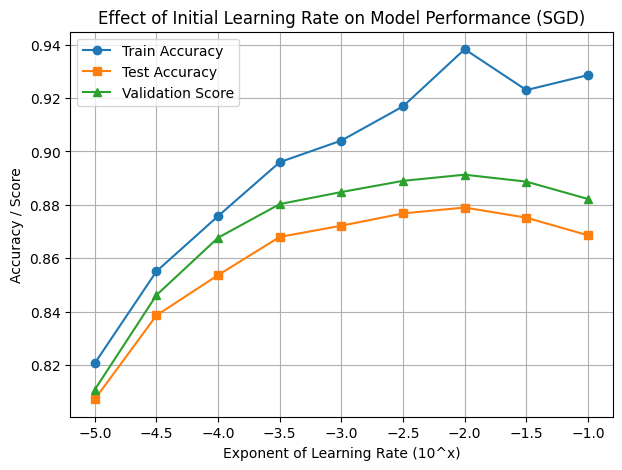

In [4]:
import matplotlib.pyplot as plt
import numpy as np

# Data for SGD
lr_exp = np.array([-5, -4.5, -4, -3.5, -3, -2.5, -2, -1.5, -1])  # exponent part of 10^x
train_acc = np.array([0.8207, 0.8551, 0.8758, 0.8960, 0.9041, 0.9169, 0.9383, 0.9230, 0.9286])
test_acc = np.array([0.8072, 0.8386, 0.8537, 0.8680, 0.8722, 0.8768, 0.8790, 0.8752, 0.8686])
val_score = np.array([0.8108, 0.8462, 0.8677, 0.8803, 0.8848, 0.8890, 0.8913, 0.8887, 0.8822])

# Plot
plt.figure(figsize=(7,5))
plt.plot(lr_exp, train_acc, marker='o', label='Train Accuracy')
plt.plot(lr_exp, test_acc, marker='s', label='Test Accuracy')
plt.plot(lr_exp, val_score, marker='^', label='Validation Score')

plt.xlabel('Exponent of Learning Rate (10^x)')
plt.ylabel('Accuracy / Score')
plt.title('Effect of Initial Learning Rate on Model Performance (SGD)')
plt.legend()
plt.grid(True)
plt.show()


Best Validation Score: 0.8898333333333334
Train Accuracy 0.9280333333333334
Test Accuracy: 0.879
training time 24.071035385131836
n_iter 17


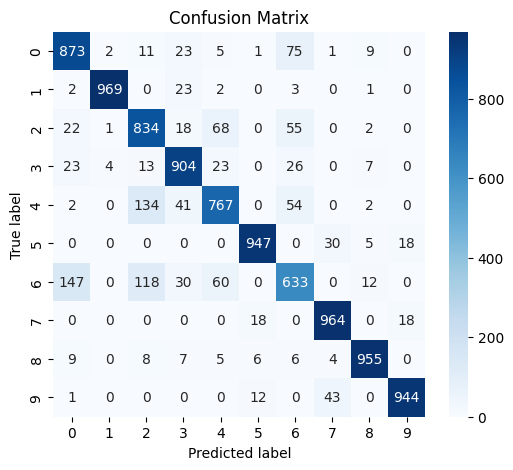

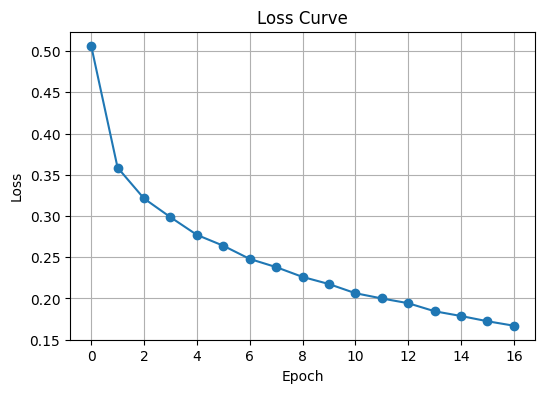

Best Validation Score: 0.8898333333333334
Train Accuracy 0.9280333333333334
Test Accuracy: 0.879
training time 47.33884644508362
n_iter 32


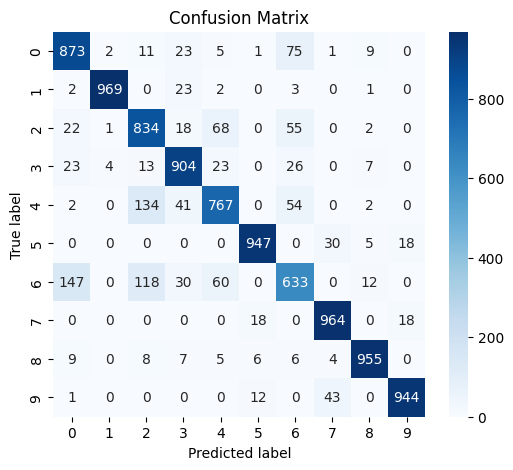

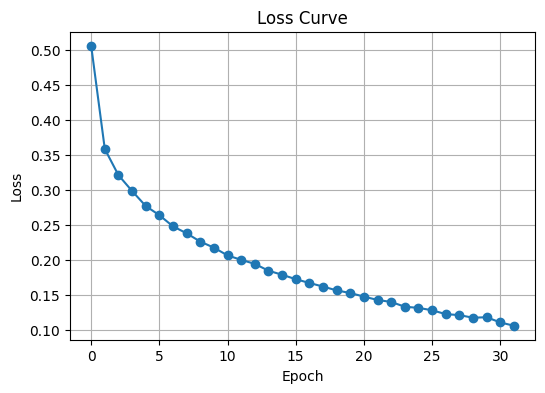

Early stopping not enabled; no validation scores available.
Train Accuracy 0.9902166666666666
Test Accuracy: 0.8701
training time 226.1821002960205
n_iter 138


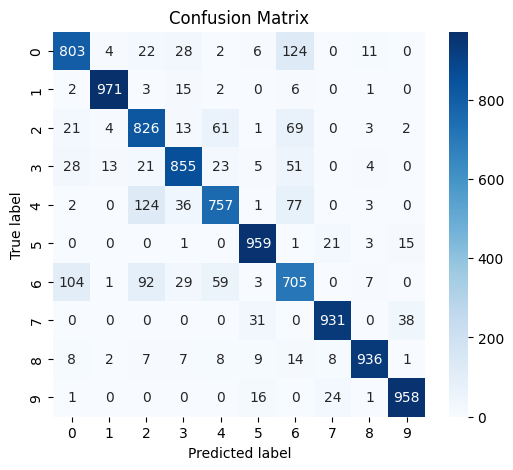

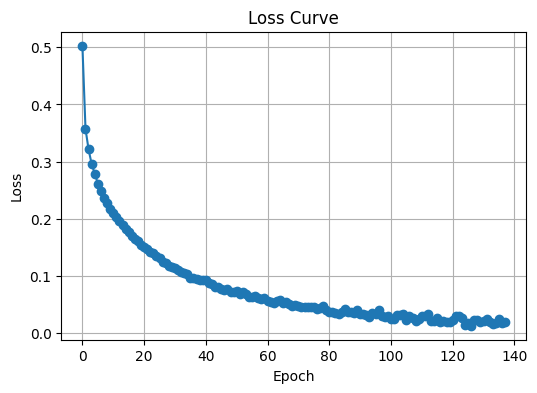

{'training accuracy': 0.9902166666666666,
 'testing accuracy': 0.8701,
 'confusion_matrix': array([[803,   4,  22,  28,   2,   6, 124,   0,  11,   0],
        [  2, 971,   3,  15,   2,   0,   6,   0,   1,   0],
        [ 21,   4, 826,  13,  61,   1,  69,   0,   3,   2],
        [ 28,  13,  21, 855,  23,   5,  51,   0,   4,   0],
        [  2,   0, 124,  36, 757,   1,  77,   0,   3,   0],
        [  0,   0,   0,   1,   0, 959,   1,  21,   3,  15],
        [104,   1,  92,  29,  59,   3, 705,   0,   7,   0],
        [  0,   0,   0,   0,   0,  31,   0, 931,   0,  38],
        [  8,   2,   7,   7,   8,   9,  14,   8, 936,   1],
        [  1,   0,   0,   0,   0,  16,   0,  24,   1, 958]]),
 'training_time': 226.1821002960205,
 'n_iter': 138,
 'loss_curve': [np.float64(0.5026885617361319),
  np.float64(0.3572587449159551),
  np.float64(0.32142732926917583),
  np.float64(0.29569161636116736),
  np.float64(0.2791264406109437),
  np.float64(0.26184510967565117),
  np.float64(0.24861417564637578)

In [21]:
train_mlp_pipeline(X_train, y_train, X_test, y_test, n_iter_no_change=5)
train_mlp_pipeline(X_train, y_train, X_test, y_test, n_iter_no_change=20)
train_mlp_pipeline(X_train, y_train, X_test, y_test, early_stopping=False)

alpha: 0.01
Best Validation Score: 0.892
Train Accuracy 0.9374833333333333
Test Accuracy: 0.8795
training time 37.232409954071045
n_iter 26


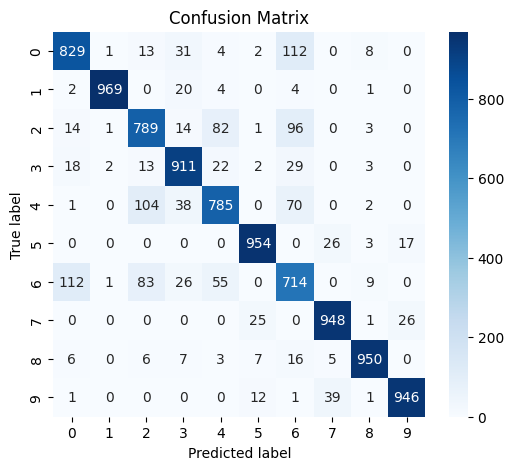

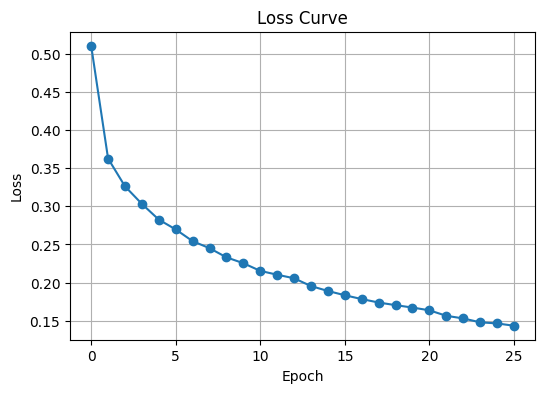

alpha: 0.0031622776601683794
Best Validation Score: 0.8901666666666667
Train Accuracy 0.94215
Test Accuracy: 0.88
training time 45.423670530319214
n_iter 30


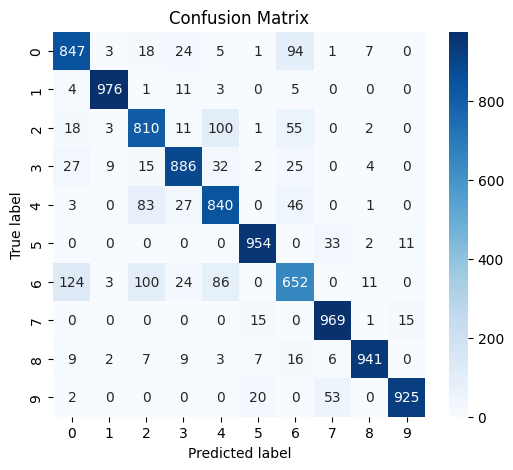

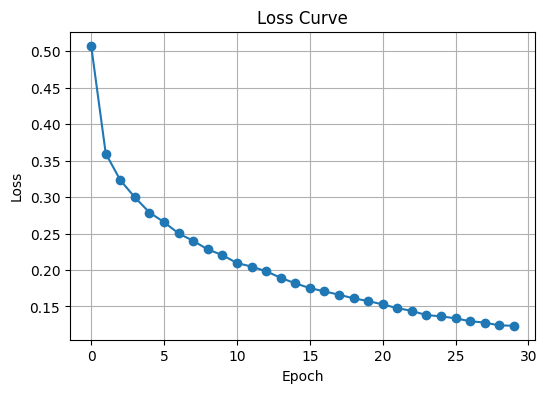

alpha: 0.001
Best Validation Score: 0.8906666666666667
Train Accuracy 0.92825
Test Accuracy: 0.8816
training time 33.872905015945435
n_iter 22


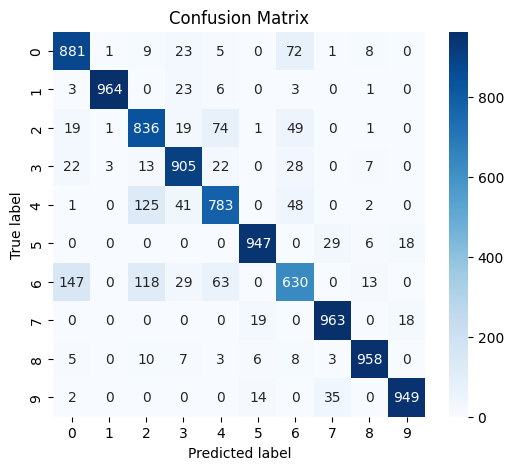

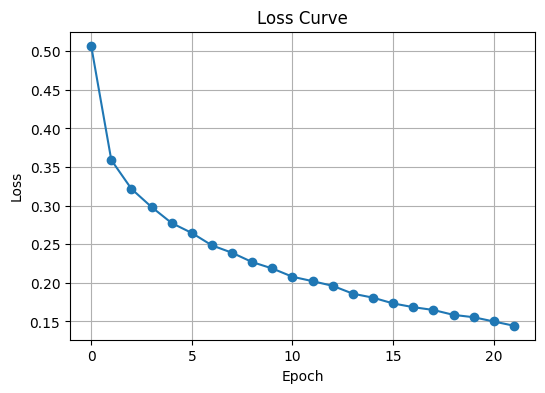

alpha: 0.00031622776601683794
Best Validation Score: 0.8916666666666667
Train Accuracy 0.9365166666666667
Test Accuracy: 0.8795
training time 34.86517262458801
n_iter 25


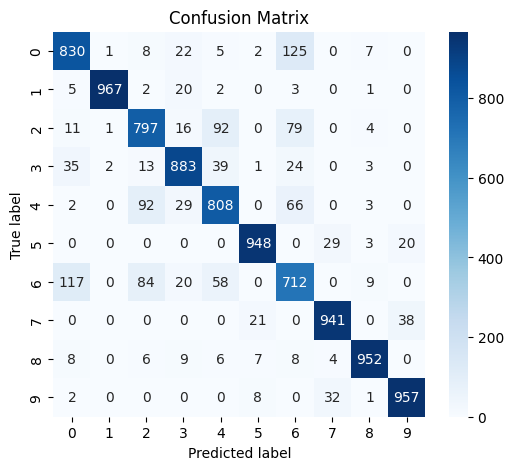

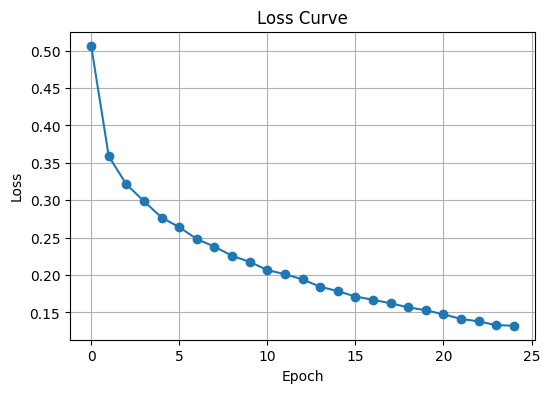

alpha: 0.0001
Best Validation Score: 0.8898333333333334
Train Accuracy 0.9280333333333334
Test Accuracy: 0.879
training time 33.22208833694458
n_iter 22


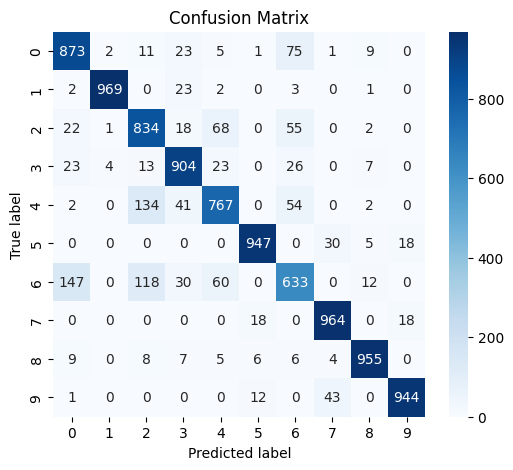

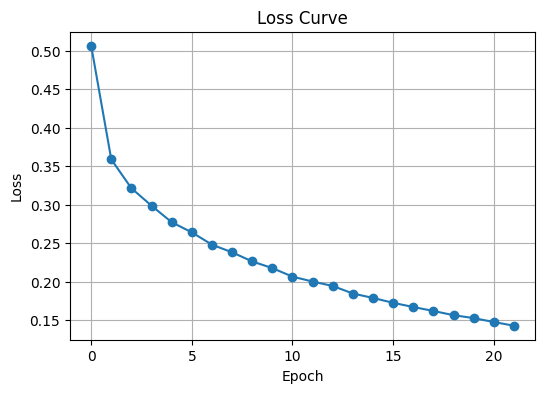

alpha: 3.1622776601683795e-05
Best Validation Score: 0.8905
Train Accuracy 0.9285833333333333
Test Accuracy: 0.8797
training time 31.423476457595825
n_iter 22


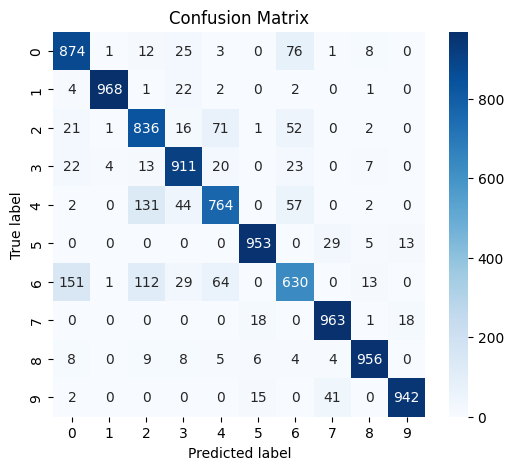

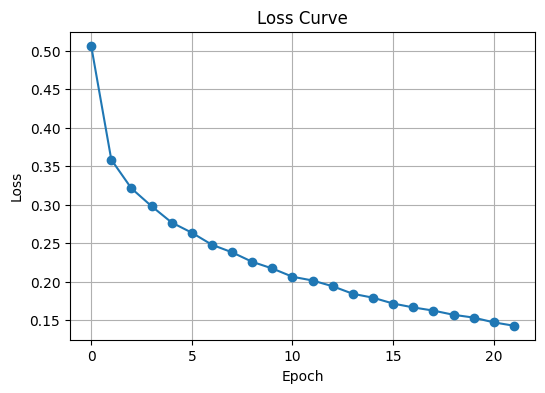

alpha: 1e-05
Best Validation Score: 0.89
Train Accuracy 0.9286
Test Accuracy: 0.8795
training time 35.73212718963623
n_iter 22


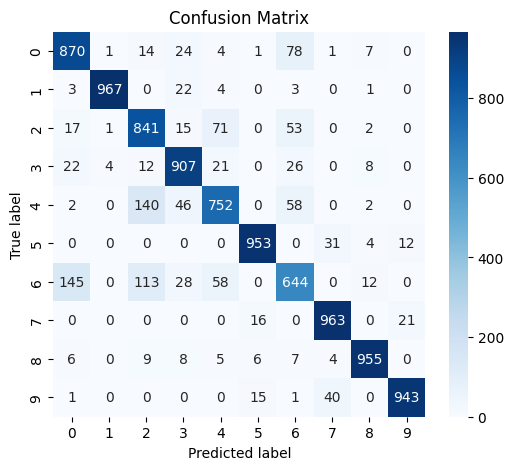

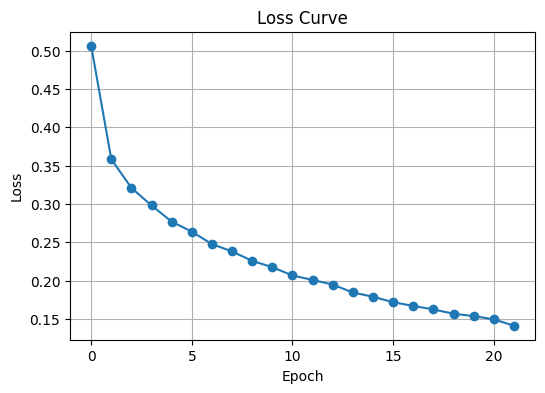

alpha: 3.162277660168379e-06
Best Validation Score: 0.8906666666666667
Train Accuracy 0.92835
Test Accuracy: 0.8804
training time 32.51935648918152
n_iter 22


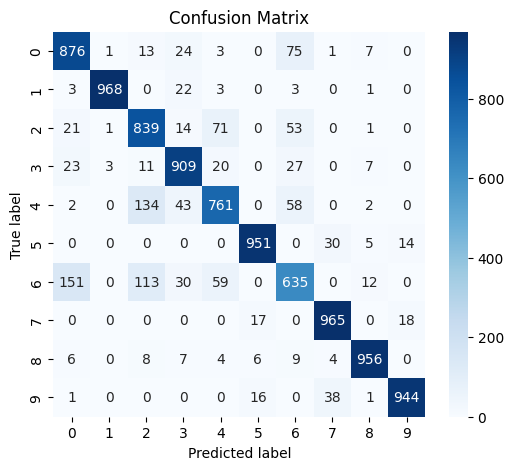

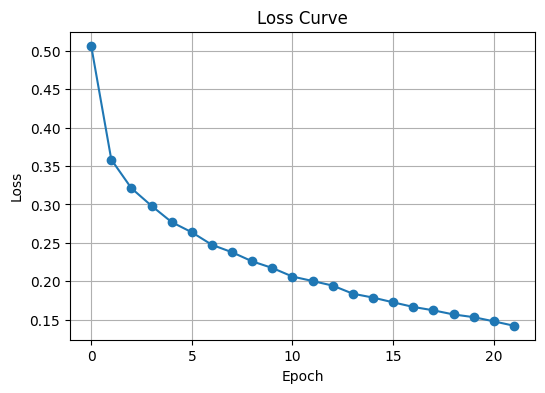

alpha: 1e-06
Best Validation Score: 0.8895
Train Accuracy 0.9512333333333334
Test Accuracy: 0.8804
training time 47.14048719406128
n_iter 33


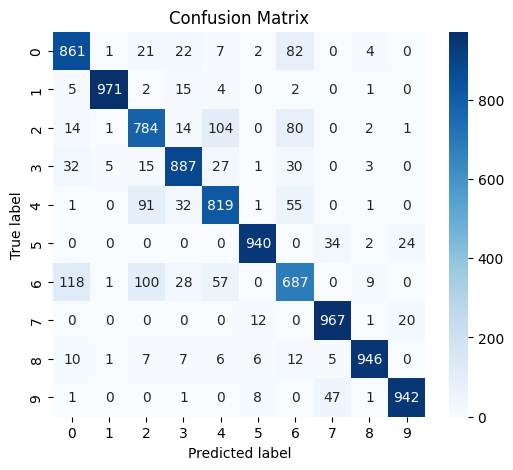

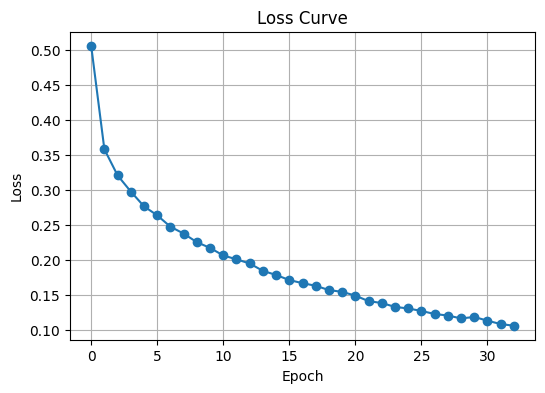

In [22]:
# Regularization
import numpy as np
lrs = np.logspace(-2, -6, num=9)
for lr in lrs:
  print(f"alpha: {lr}")
  train_mlp_pipeline(X_train, y_train, X_test, y_test, alpha=lr, early_stopping=True)

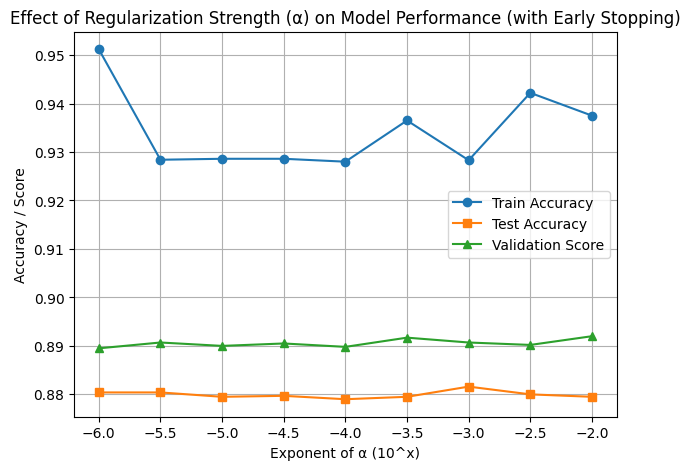

In [1]:
import matplotlib.pyplot as plt
import numpy as np

# Data
alpha_exp = np.array([-6, -5.5, -5, -4.5, -4, -3.5, -3, -2.5, -2])
train_acc = np.array([0.9512, 0.9284, 0.9286, 0.9286, 0.9280, 0.9365, 0.9283, 0.9422, 0.9375])
test_acc = np.array([0.8804, 0.8804, 0.8795, 0.8797, 0.8790, 0.8795, 0.8816, 0.8800, 0.8795])
val_score = np.array([0.8895, 0.8907, 0.8900, 0.8905, 0.8898, 0.8917, 0.8907, 0.8902, 0.8920])

# Plot
plt.figure(figsize=(7,5))
plt.plot(alpha_exp, train_acc, marker='o', label='Train Accuracy')
plt.plot(alpha_exp, test_acc, marker='s', label='Test Accuracy')
plt.plot(alpha_exp, val_score, marker='^', label='Validation Score')

plt.xlabel('Exponent of α (10^x)')
plt.ylabel('Accuracy / Score')
plt.title('Effect of Regularization Strength (α) on Model Performance (with Early Stopping)')
plt.legend()
plt.grid(True)
plt.show()


alpha: 1.0
Early stopping not enabled; no validation scores available.
Train Accuracy 0.8979
Test Accuracy: 0.8708
training time 101.99176549911499
n_iter 61


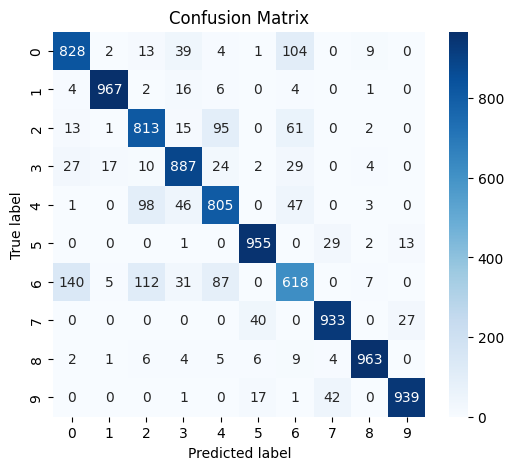

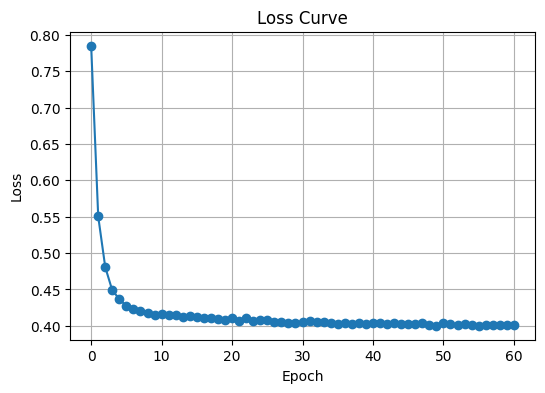

alpha: 0.31622776601683794
Early stopping not enabled; no validation scores available.
Train Accuracy 0.9343833333333333
Test Accuracy: 0.887
training time 100.76460528373718
n_iter 60


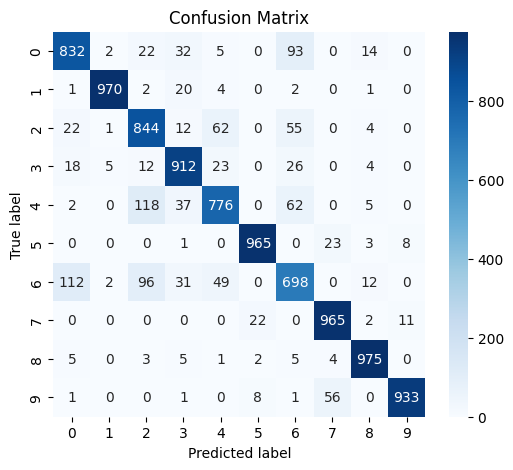

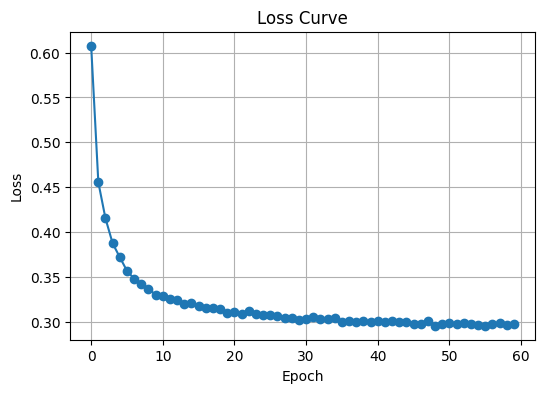

alpha: 0.1
Early stopping not enabled; no validation scores available.
Train Accuracy 0.9681333333333333
Test Accuracy: 0.8796
training time 250.40880966186523
n_iter 142


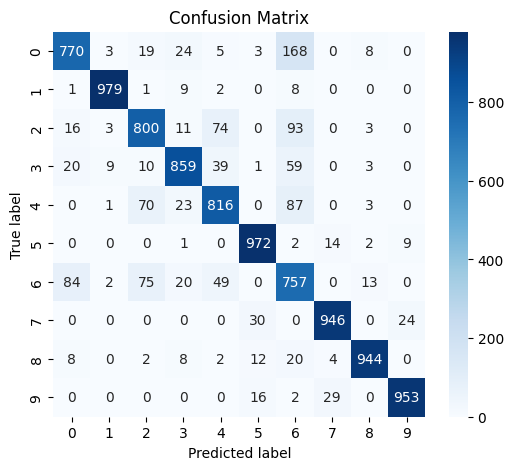

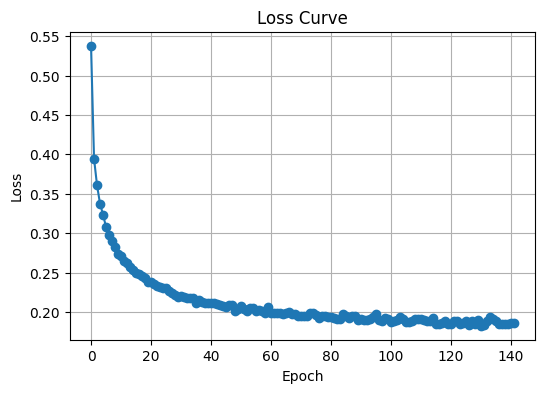

alpha: 0.03162277660168379
Early stopping not enabled; no validation scores available.
Train Accuracy 0.9806666666666667
Test Accuracy: 0.8718
training time 184.301424741745
n_iter 112


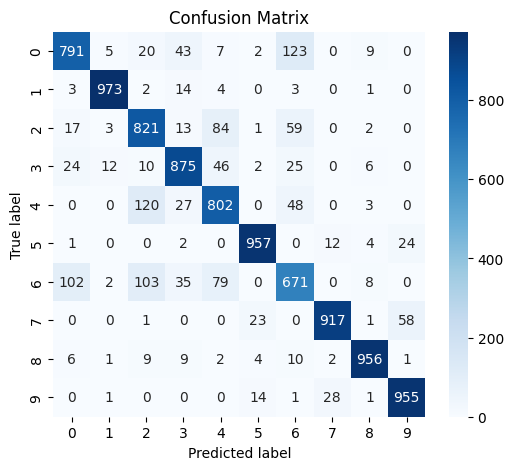

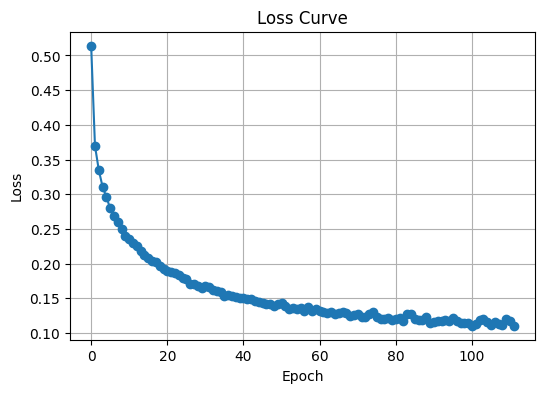

alpha: 0.01
Early stopping not enabled; no validation scores available.
Train Accuracy 0.9866833333333334
Test Accuracy: 0.8745
training time 188.61744809150696
n_iter 112


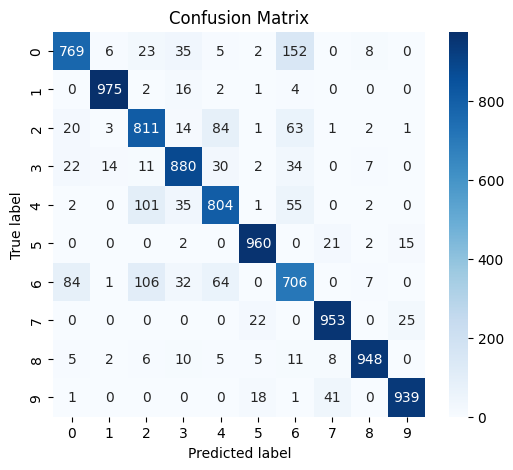

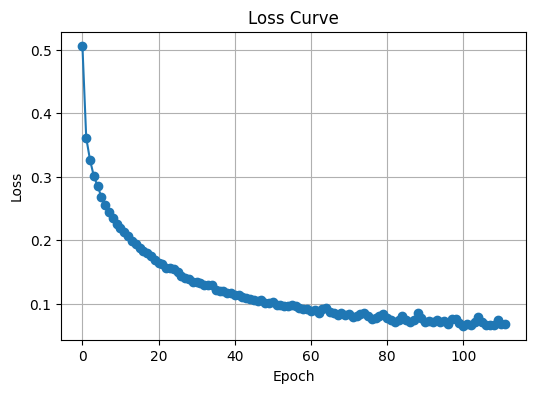

alpha: 0.0031622776601683794
Early stopping not enabled; no validation scores available.
Train Accuracy 0.99585
Test Accuracy: 0.8713
training time 213.0361566543579
n_iter 130


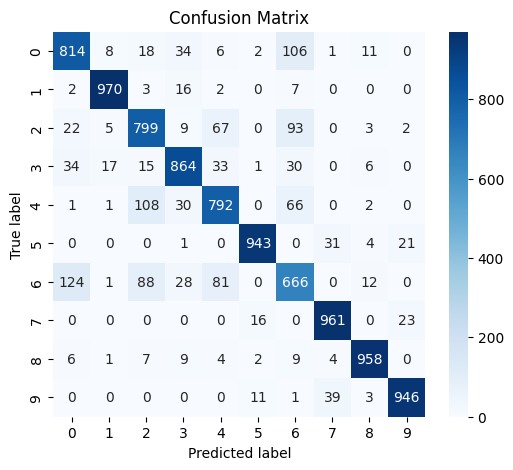

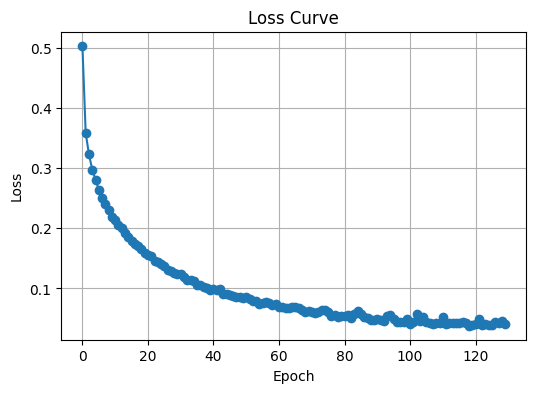

alpha: 0.001
Early stopping not enabled; no validation scores available.
Train Accuracy 0.9847166666666667
Test Accuracy: 0.8691
training time 256.5807592868805
n_iter 158


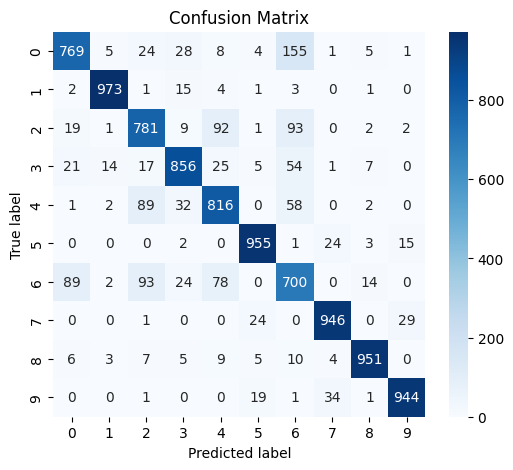

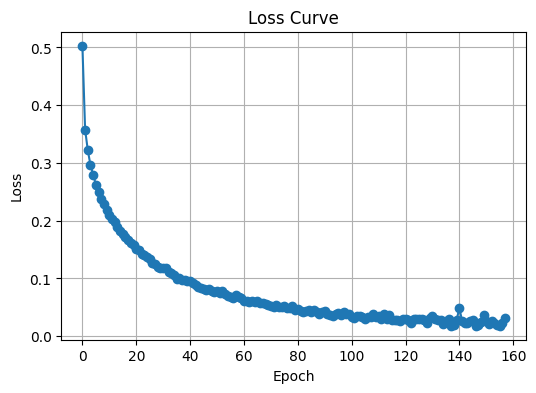

alpha: 0.00031622776601683794
Early stopping not enabled; no validation scores available.
Train Accuracy 0.9962
Test Accuracy: 0.8711
training time 222.58588242530823
n_iter 136


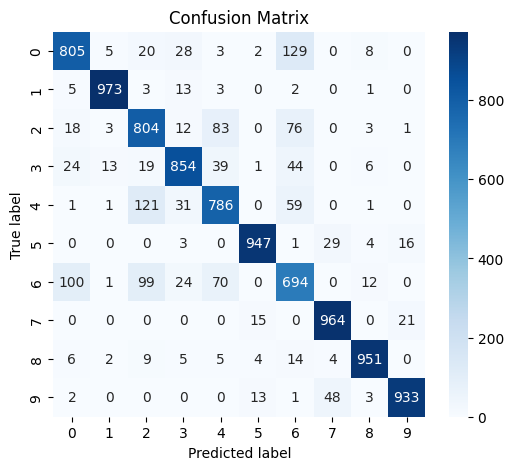

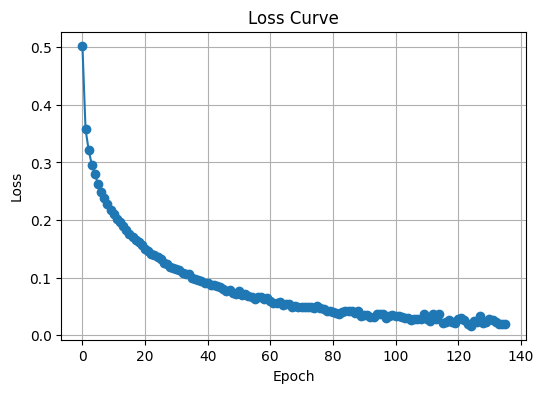

alpha: 0.0001
Early stopping not enabled; no validation scores available.
Train Accuracy 0.9902166666666666
Test Accuracy: 0.8701
training time 228.57757425308228
n_iter 138


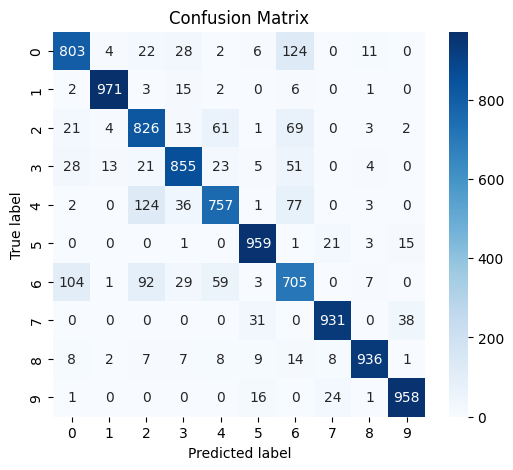

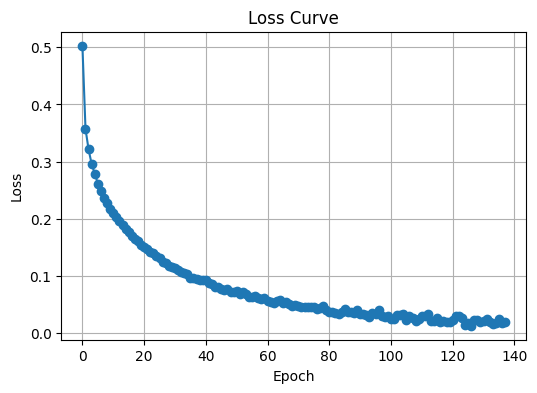

In [3]:
# Regularization
import numpy as np
lrs = np.logspace(0, -4, num=9)
for lr in lrs:
  print(f"alpha: {lr}")
  train_mlp_pipeline(X_train, y_train, X_test, y_test, alpha=lr, early_stopping=False)

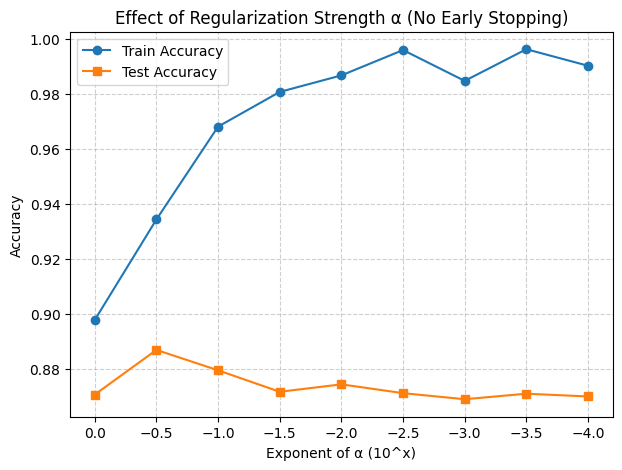

In [3]:
import matplotlib.pyplot as plt
import numpy as np

# Data
alpha_exp = np.array([-4, -3.5, -3, -2.5, -2, -1.5, -1, -0.5, 0])
train_acc = np.array([0.9902, 0.9962, 0.9847, 0.9959, 0.9867, 0.9807, 0.9681, 0.9344, 0.8979])
test_acc  = np.array([0.8701, 0.8711, 0.8691, 0.8713, 0.8745, 0.8718, 0.8796, 0.8870, 0.8708])

# Plot
plt.figure(figsize=(7, 5))
plt.plot(alpha_exp, train_acc, marker='o', label='Train Accuracy')
plt.plot(alpha_exp, test_acc, marker='s', label='Test Accuracy')

# Labels and formatting
plt.xlabel('Exponent of α (10^x)')
plt.ylabel('Accuracy')
plt.title('Effect of Regularization Strength α (No Early Stopping)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)

# Optional: invert x-axis so larger α (smaller regularization) is to the right
plt.gca().invert_xaxis()

plt.show()


# 3. Fashion-MNIST image classification  using pytorch

In [2]:
import random
import numpy as np
import torch

def set_seed(seed=42, deterministic=False):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = deterministic
    torch.backends.cudnn.benchmark = not deterministic


set_seed(42, deterministic=True)

In [3]:
import numpy as np
from tensorflow.keras.datasets import fashion_mnist
import torch
from torch.utils.data import TensorDataset, DataLoader

# Load Fashion-MNIST
# Classes (0-9): T-shirt/top, Trouser, Pullover, Dress, Coat, Sandal, Shirt, Sneaker, Bag, Ankle boot
(X_train, y_train), (X_test, y_test) = fashion_mnist.load_data()

# scale to [0,1], add channel dimension -> (N, 1, 28, 28)
X_train = (X_train.astype("float32") / 255.0)[:, None, :, :]
X_test  = (X_test.astype("float32")  / 255.0)[:,  None, :, :]

y_train = y_train.astype(np.int64)
y_test  = y_test.astype(np.int64)

# train/val split: last 10k of train as validation
X_tr, X_val = X_train[:50000], X_train[50000:]
y_tr, y_val = y_train[:50000], y_train[50000:]

# wrap in PyTorch TensorDatasets and DataLoaders
train_ds = TensorDataset(torch.from_numpy(X_tr),  torch.from_numpy(y_tr))
val_ds   = TensorDataset(torch.from_numpy(X_val), torch.from_numpy(y_val))
test_ds  = TensorDataset(torch.from_numpy(X_test), torch.from_numpy(y_test))

train_loader = DataLoader(train_ds, batch_size=128, shuffle=True)
val_loader   = DataLoader(val_ds,   batch_size=256, shuffle=False)
test_loader  = DataLoader(test_ds,  batch_size=256, shuffle=False)

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 5us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [4]:
import torch.nn as nn
import torch.optim as optim

# In colab, you should ``change runtime type'' to GPU.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# your code here

Using device: cuda


In [5]:
import torch
from torch import nn

class NeuralNetwork(nn.Module):
    def __init__(self, hidden_layers = [64], activation_fn=nn.ReLU):


        """
        input_size: int, e.g. 28*28 for MNIST
        hidden_layers: list of int, e.g. [128, 64, 32]
        output_size: int, e.g. 10 for 10 classes
        activation_fn: class (not instance), e.g. nn.ReLU or nn.Sigmoid
        """

        super().__init__()

        layers = []
        in_features = 28*28

        for h in hidden_layers:
            layers.append(nn.Linear(in_features, h))
            layers.append(activation_fn())
            in_features = h

        layers.append(nn.Linear(in_features, 10))

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = torch.flatten(x, 1)
        return self.model(x)


In [6]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    correct = 0
    train_loss = 0


    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)

        # Compute prediction error
        pred = model(X)
        loss = loss_fn(pred, y)
        train_loss += loss.item()
        correct += (pred.argmax(1) == y).type(torch.float).sum().item()


        # Backpropagation
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
    train_loss /= len(dataloader)
    correct /= size
    return correct, train_loss

In [7]:
from sklearn.metrics import confusion_matrix
def test(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)
            pred = model(X)
            test_loss += loss_fn(pred, y).item()
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()

            all_preds.extend(pred.argmax(1).cpu().numpy())
            all_labels.extend(y.cpu().numpy())
    test_loss /= num_batches


    correct /= size
    cm = confusion_matrix(all_labels, all_preds)
    return test_loss, correct, cm

In [22]:
# pipeline with convergence check
from sklearn.metrics import confusion_matrix
from matplotlib import pyplot as plt
import time
import seaborn as sns
import copy

def train_pipeline(model_class,
                   model_params={},
                   optimizer_class=torch.optim.AdamW,
                   optimizer_params={"lr":1e-3, "weight_decay": 1e-4},
                   loss_fn_class=nn.CrossEntropyLoss,
                   epochs=200,
                   early_stopping=True,
                   patience=10,
                   min_delta=1e-4,
                   convergence_tol=1e-4,
                   convergence_patience=10,
                   device=device):

    model = model_class(**model_params)
    model.to(device)

    loss_fn = loss_fn_class()
    optimizer = optimizer_class(model.parameters(), **optimizer_params)

    best_val_score = 0
    val_losses = []
    train_losses = []
    start_time = time.time()
    n_iter = epochs
    trigger_times = 0
    conv_times = 0
    best_val_loss = float('inf')
    best_train_loss = float('inf')
    best_train_acc = 0
    best_model_wts = copy.deepcopy(model.state_dict())
    best_epoch = 0

    for epoch in range(epochs):
        # train
        train_acc, train_loss = train(train_loader, model, loss_fn, optimizer)
        val_loss, val_acc, cm_val = test(val_loader, model, loss_fn)

        train_losses.append(train_loss)
        val_losses.append(val_loss)


        if early_stopping:
          if val_loss < best_val_loss - min_delta:
            best_val_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            best_train_acc = train_acc
            best_val_score = val_acc
            trigger_times = 0
            best_epoch = epoch + 1
          else:
              trigger_times += 1
          if trigger_times >= patience:
              n_iter = epoch - patience + 1
              print(f"Early stopping at epoch {n_iter}")
              break

        # check convergence based on training loss
        if epoch >= convergence_patience:
            if train_loss < best_train_loss - convergence_tol:
                best_train_loss = train_loss
                best_model_wts = copy.deepcopy(model.state_dict())
                best_train_acc = train_acc
                conv_times = 0
            else:
                conv_times += 1
            if conv_times >= convergence_patience:
                n_iter = epoch + 1
                print(f"Converged at epoch {n_iter} (training loss)")
                break

    end_time = time.time()
    training_time = end_time - start_time


    model.load_state_dict(best_model_wts)
    print("Train Accuracy:", best_train_acc)
    if early_stopping:
      print("Best epoch:", best_epoch)
      print("Validation Score:", best_val_score)
    print("Training Time:", training_time, "seconds")

    # Loss curve
    plt.figure(figsize=(6,4))
    plt.plot(val_losses[:n_iter], marker='o', label='Validation Loss')
    plt.plot(train_losses[:n_iter], marker='x', label='Training Loss')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Curve")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Test
    test_loss, test_acc, cm = test(test_loader, model, loss_fn)
    print("Test Accuracy:", test_acc)

    # Confusion Matrix
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title("Confusion Matrix")
    plt.show()

    results = {
        'training accuracy' : best_train_acc,
        'testing accuracy': test_acc,
        'validation score': best_val_score,
        'confusion_matrix': cm,
        'training_time': training_time,
        'n_iter': n_iter,
    }
    return results


Early stopping at epoch 28
Train Accuracy: 0.92642
Best epoch: 28
Validation Score: 0.8859
Training Time: 41.696587562561035 seconds


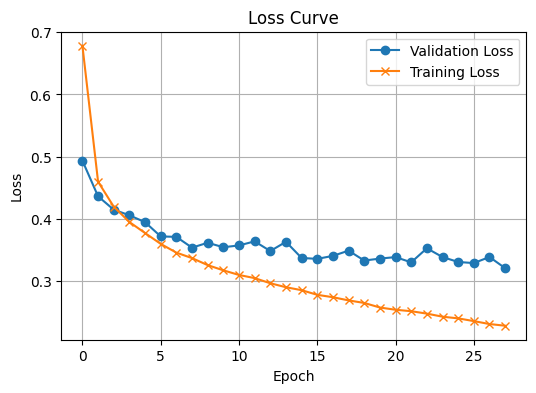

Test Accuracy: 0.8757


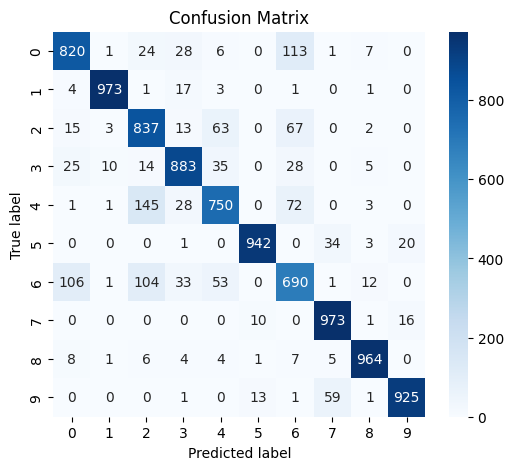

In [23]:
# Neural Network Baseline

results_list = {}
results_list['Baseline'] = train_pipeline(model_class = NeuralNetwork)


Number of neurons: 32
Early stopping at epoch 29
Best epoch: 29
Train Accuracy: 0.89854
Validation Score: 0.8789
Training Time: 39.76920819282532 seconds


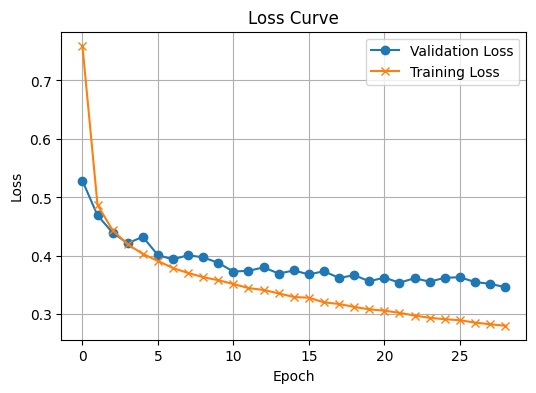

Test Accuracy: 0.8705


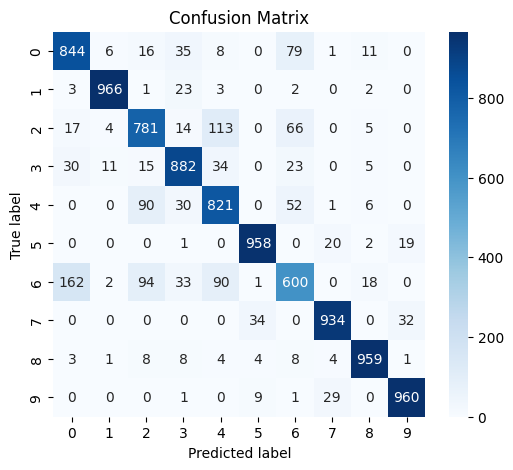

Number of neurons: 64
Early stopping at epoch 25
Best epoch: 25
Train Accuracy: 0.91372
Validation Score: 0.8845
Training Time: 36.87713050842285 seconds


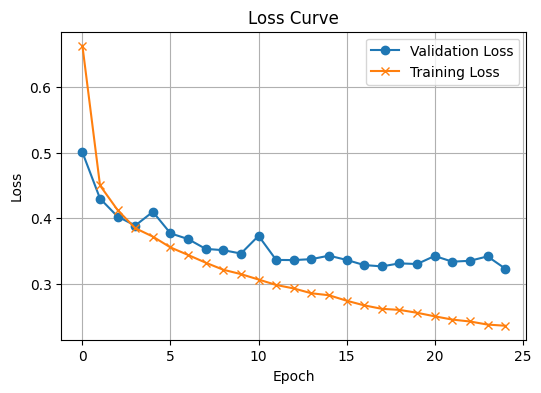

Test Accuracy: 0.8785


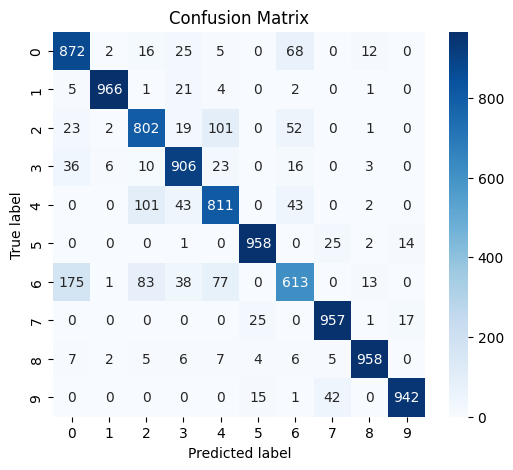

Number of neurons: 128
Early stopping at epoch 18
Best epoch: 18
Train Accuracy: 0.9184
Validation Score: 0.8924
Training Time: 29.818328857421875 seconds


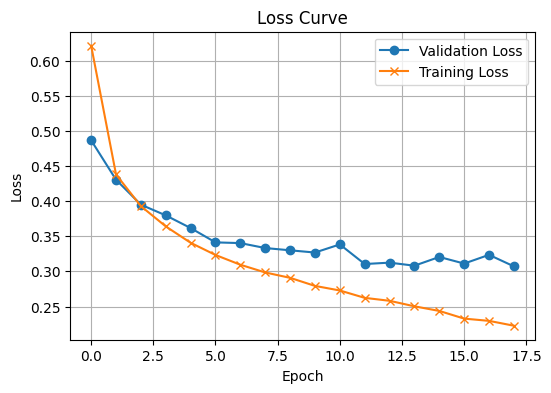

Test Accuracy: 0.8826


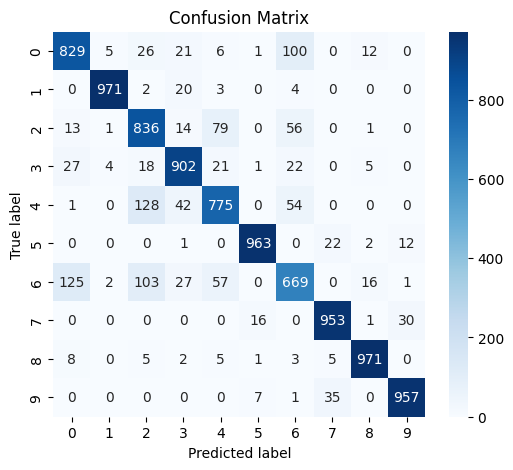

Number of neurons: 256
Early stopping at epoch 17
Best epoch: 17
Train Accuracy: 0.9246
Validation Score: 0.8928
Training Time: 28.306039094924927 seconds


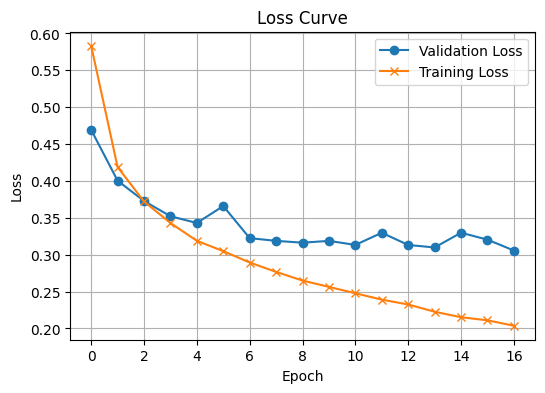

Test Accuracy: 0.8869


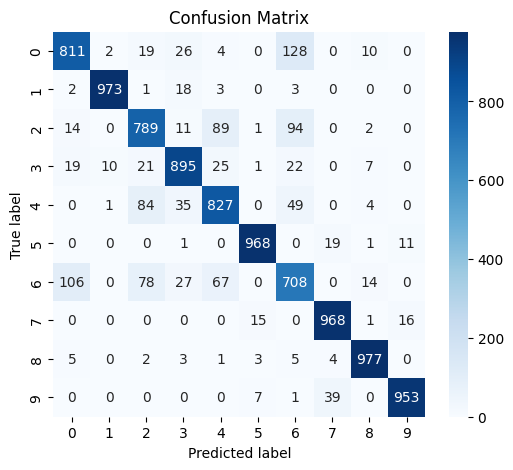

Number of neurons: 512
Early stopping at epoch 16
Best epoch: 16
Train Accuracy: 0.9291
Validation Score: 0.8937
Training Time: 27.127229690551758 seconds


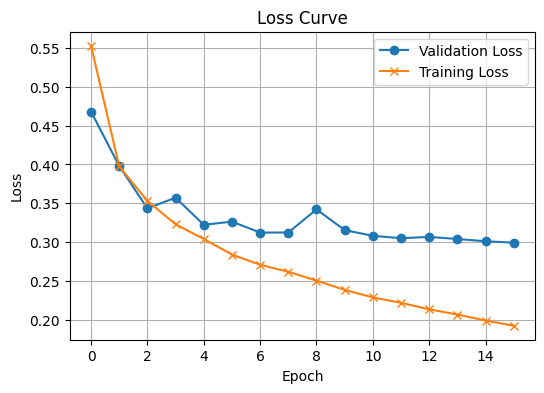

Test Accuracy: 0.89


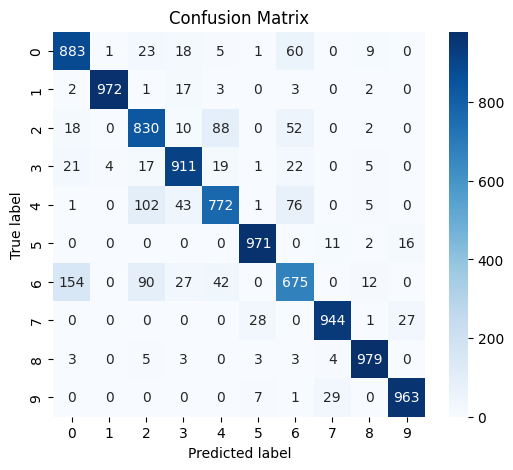

In [44]:
# Single Layer

Single_layer_results = {}

for i in range(5, 10):
  n = 2 ** i
  print(f"Number of neurons: {n}")
  Single_layer_results[n] = train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [n]})

Number of neurons: (32, 16)
Early stopping at epoch 24
Best epoch: 24
Train Accuracy: 0.899
Validation Score: 0.8765
Training Time: 38.23029136657715 seconds


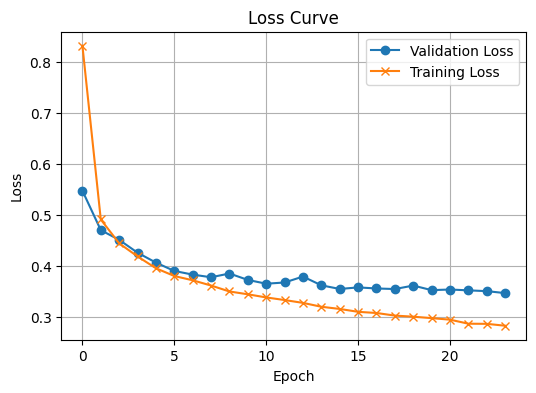

Test Accuracy: 0.867


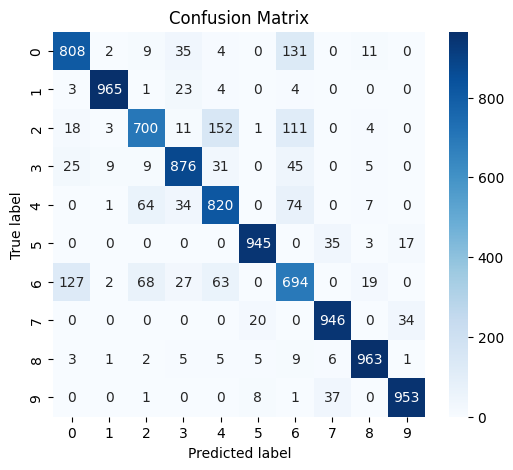

Number of neurons: (64, 32)
Early stopping at epoch 20
Best epoch: 20
Train Accuracy: 0.90866
Validation Score: 0.886
Training Time: 33.324137687683105 seconds


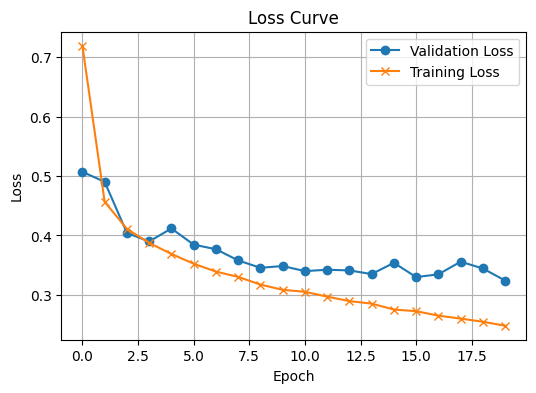

Test Accuracy: 0.8803


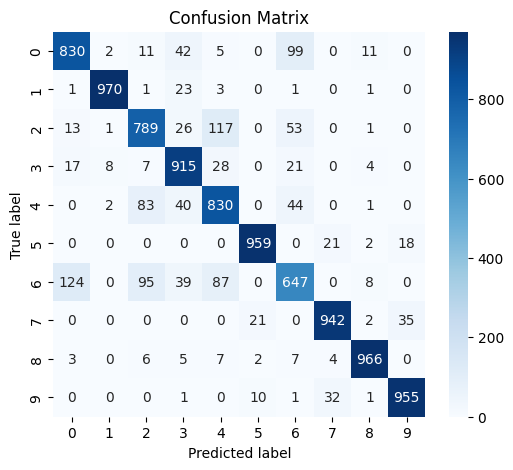

Number of neurons: (128, 64)
Early stopping at epoch 13
Best epoch: 13
Train Accuracy: 0.90786
Validation Score: 0.8876
Training Time: 25.724992752075195 seconds


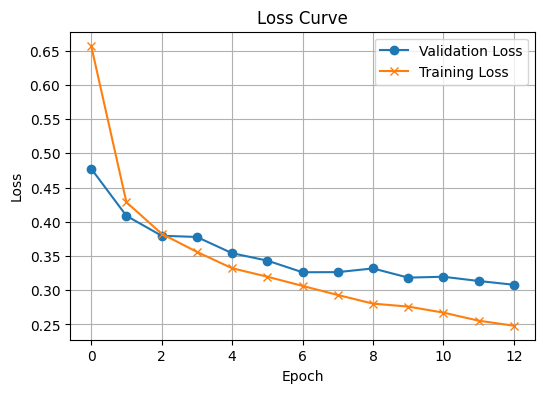

Test Accuracy: 0.8791


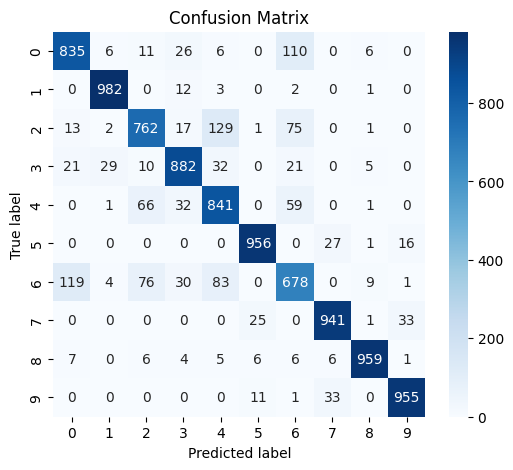

Number of neurons: (256, 128)
Early stopping at epoch 9
Best epoch: 9
Train Accuracy: 0.9061
Validation Score: 0.8913
Training Time: 21.37709331512451 seconds


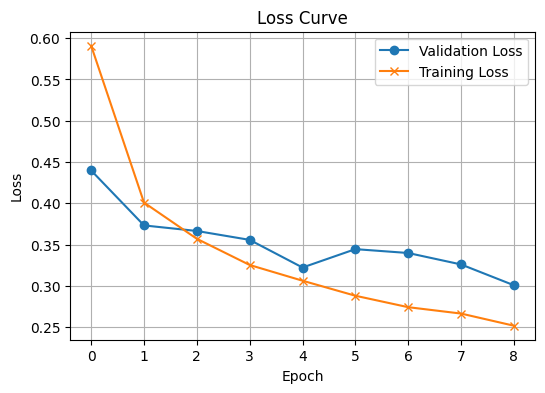

Test Accuracy: 0.8842


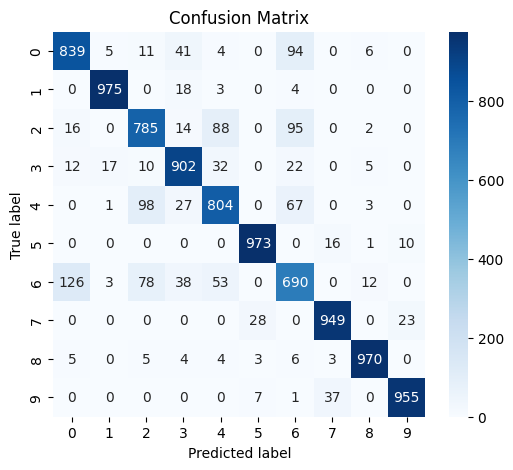

Number of neurons: (512, 256)
Early stopping at epoch 9
Best epoch: 9
Train Accuracy: 0.91208
Validation Score: 0.8922
Training Time: 21.434159517288208 seconds


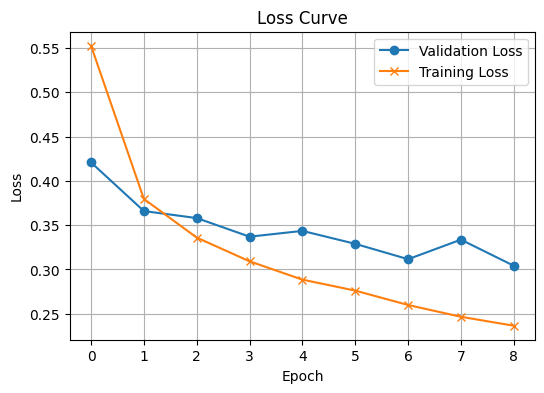

Test Accuracy: 0.8859


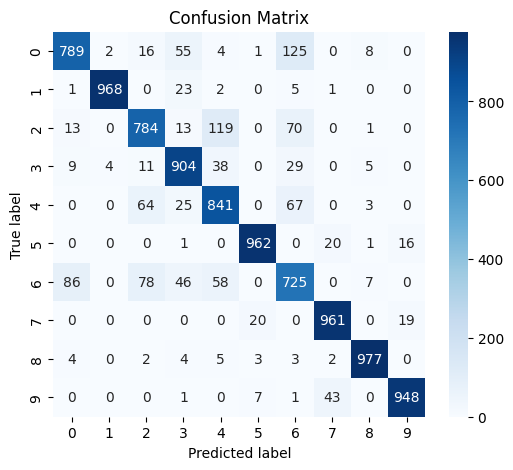

In [9]:
# Double Layer

Double_layer_results = {}

for i in range(5, 10):
  n = 2 ** (i-1)
  print(f"Number of neurons: {2*n, n}")
  Double_layer_results[n] = train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [2*n, n]})

Number of neurons: (32, 16, 8)
Early stopping at epoch 31
Best epoch: 31
Train Accuracy: 0.89024
Validation Score: 0.8705
Training Time: 49.37840390205383 seconds


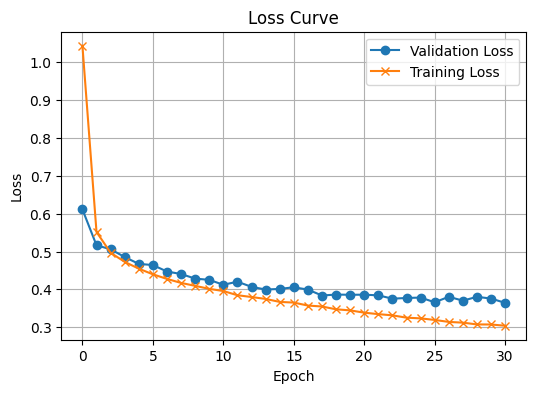

Test Accuracy: 0.8596


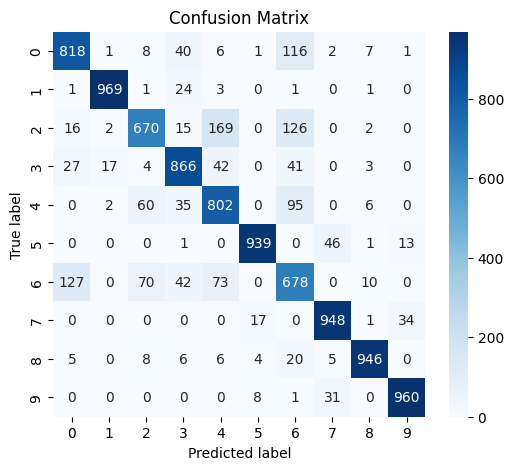

Number of neurons: (64, 32, 16)
Early stopping at epoch 20
Best epoch: 20
Train Accuracy: 0.90392
Validation Score: 0.8846
Training Time: 35.615736961364746 seconds


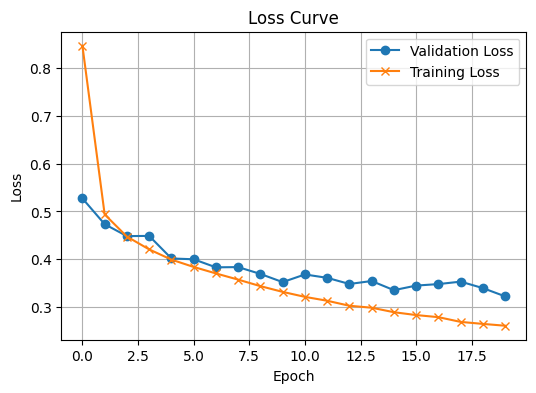

Test Accuracy: 0.8731


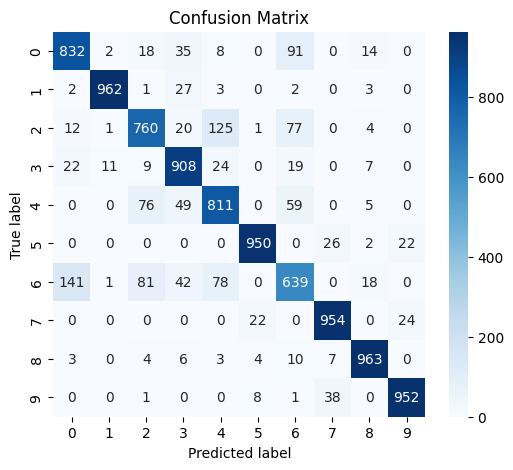

Number of neurons: (128, 64, 32)
Early stopping at epoch 12
Best epoch: 12
Train Accuracy: 0.90586
Validation Score: 0.8871
Training Time: 26.529889345169067 seconds


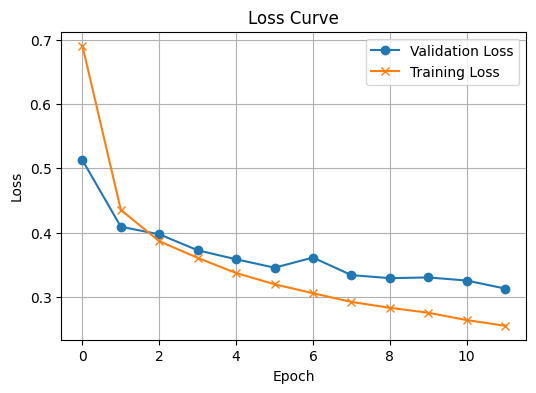

Test Accuracy: 0.8825


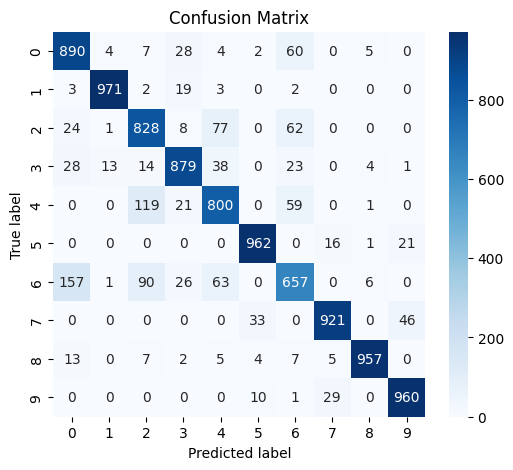

Number of neurons: (256, 128, 64)
Early stopping at epoch 9
Best epoch: 9
Train Accuracy: 0.90318
Validation Score: 0.8896
Training Time: 22.792139291763306 seconds


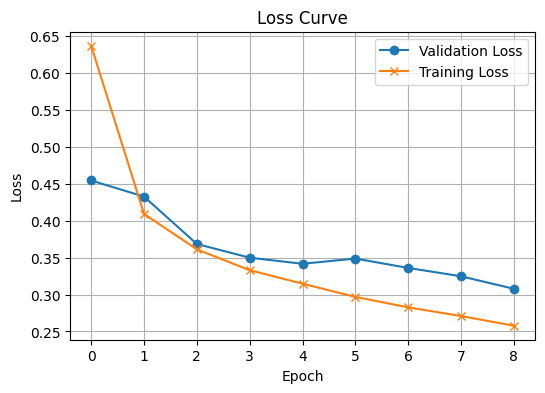

Test Accuracy: 0.8817


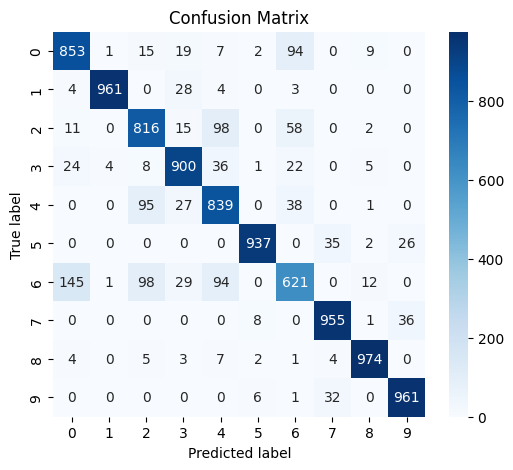

Number of neurons: (512, 256, 128)
Early stopping at epoch 10
Best epoch: 10
Train Accuracy: 0.91362
Validation Score: 0.8962
Training Time: 24.0226993560791 seconds


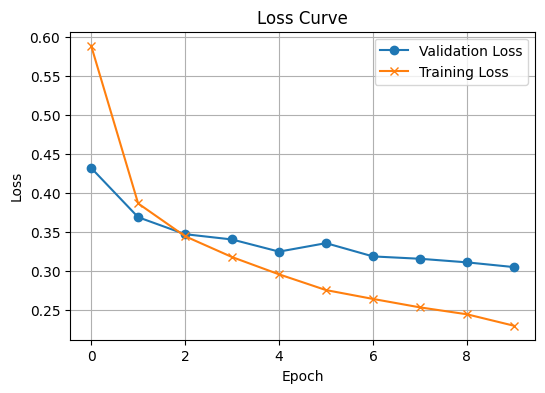

Test Accuracy: 0.8885


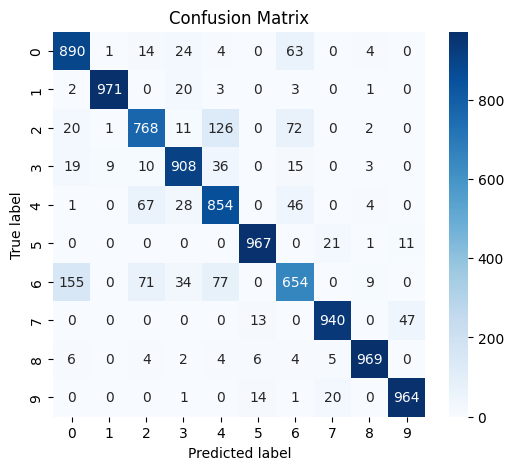

In [10]:
# Three Layers

Triple_layer_results = {}

for i in range(5, 10):
  n = 2 ** (i-2)
  print(f"Number of neurons: {4*n, 2*n, n}")
  Triple_layer_results[n] = train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [4*n, 2*n, n]})

Number of neurons: (32, 16, 8, 4)
Early stopping at epoch 40
Best epoch: 40
Train Accuracy: 0.87666
Validation Score: 0.8522
Training Time: 63.96858358383179 seconds


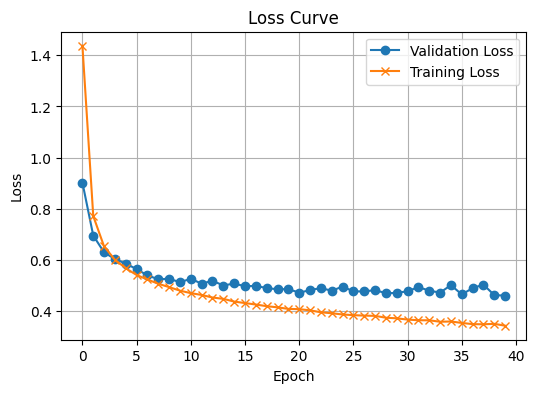

Test Accuracy: 0.8462


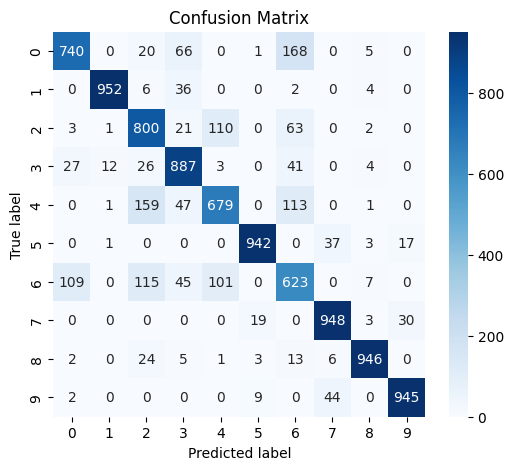

Number of neurons: (64, 32, 16, 8)
Early stopping at epoch 25
Best epoch: 25
Train Accuracy: 0.9044
Validation Score: 0.8788
Training Time: 44.54024863243103 seconds


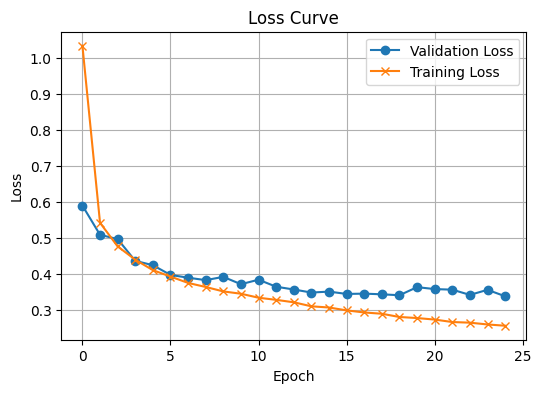

Test Accuracy: 0.8723


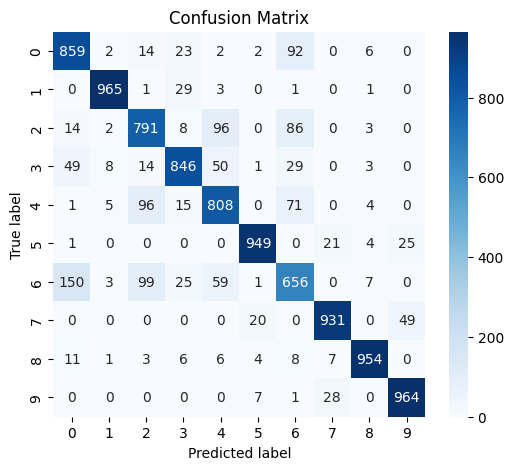

Number of neurons: (128, 64, 32, 16)
Early stopping at epoch 14
Best epoch: 14
Train Accuracy: 0.90472
Validation Score: 0.8854
Training Time: 30.604719877243042 seconds


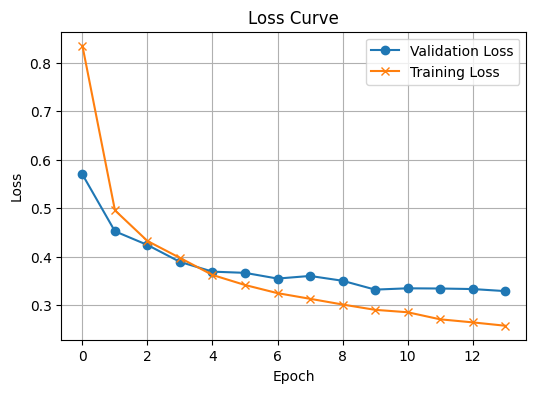

Test Accuracy: 0.876


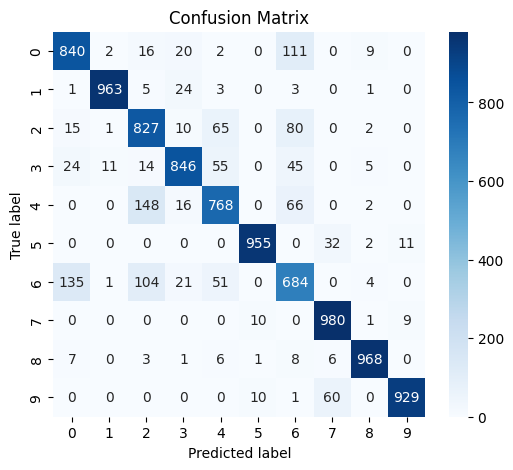

Number of neurons: (256, 128, 64, 32)
Early stopping at epoch 16
Best epoch: 16
Train Accuracy: 0.91962
Validation Score: 0.8934
Training Time: 33.72917199134827 seconds


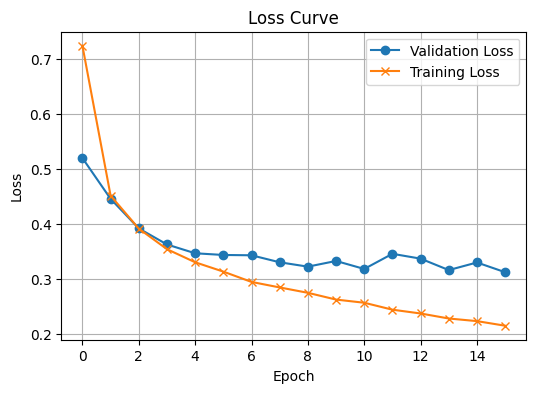

Test Accuracy: 0.8826


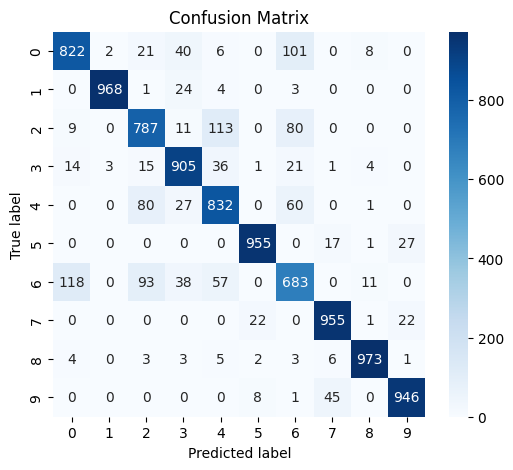

Number of neurons: (512, 256, 128, 64)
Early stopping at epoch 15
Best epoch: 15
Train Accuracy: 0.92368
Validation Score: 0.8942
Training Time: 31.701056718826294 seconds


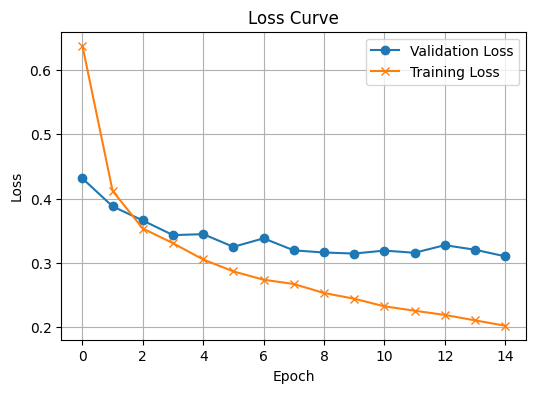

Test Accuracy: 0.8887


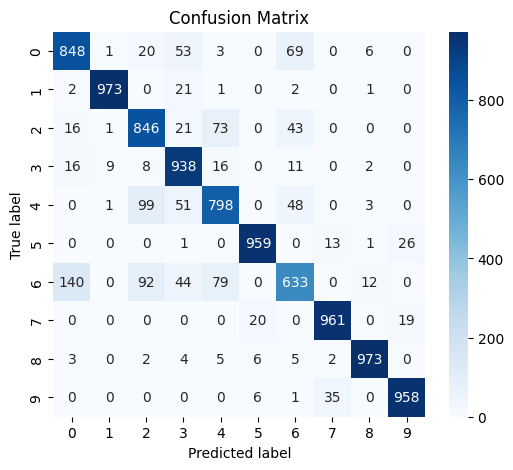

In [11]:
# four Layers

Four_layer_results = {}

for i in range(5, 10):
  n = 2 ** (i-3)
  print(f"Number of neurons: {8*n, 4*n, 2*n, n}")
  Four_layer_results[n] = train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [8*n, 4*n, 2*n, n]})

Early stopping at epoch 13
Best epoch: 13
Train Accuracy: 0.92194
Validation Score: 0.8943
Training Time: 27.493529081344604 seconds


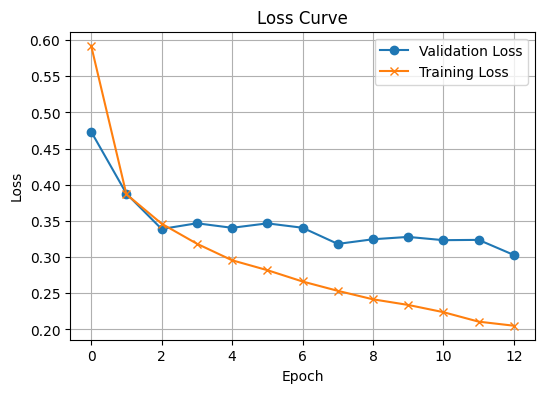

Test Accuracy: 0.8899


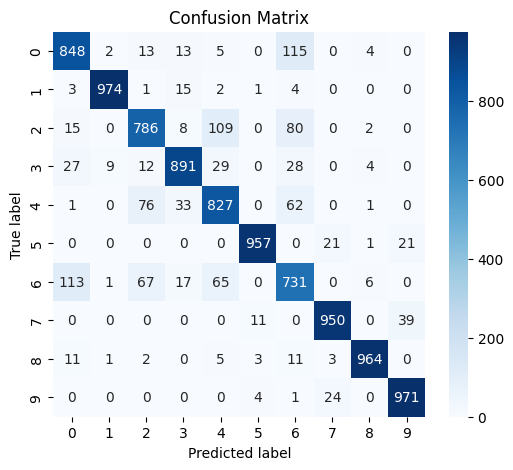

Early stopping at epoch 8
Best epoch: 8
Train Accuracy: 0.9136
Validation Score: 0.8924
Training Time: 21.93039321899414 seconds


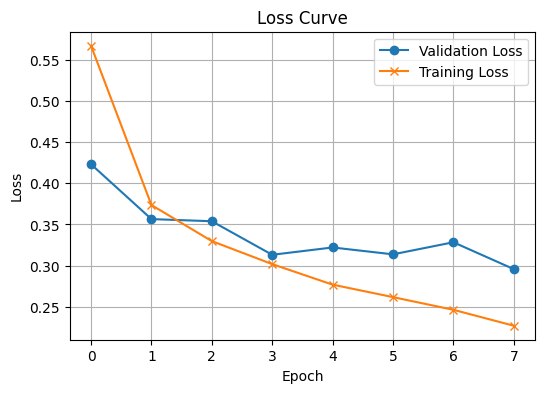

Test Accuracy: 0.8877


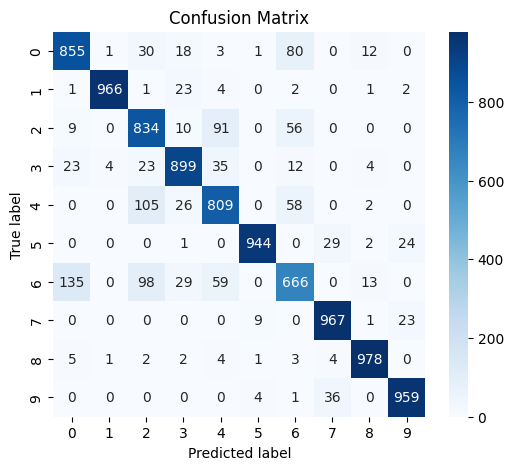

Early stopping at epoch 14
Best epoch: 14
Train Accuracy: 0.92706
Validation Score: 0.8897
Training Time: 28.655991554260254 seconds


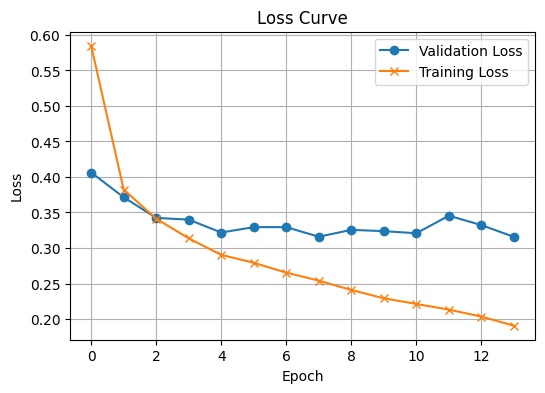

Test Accuracy: 0.8816


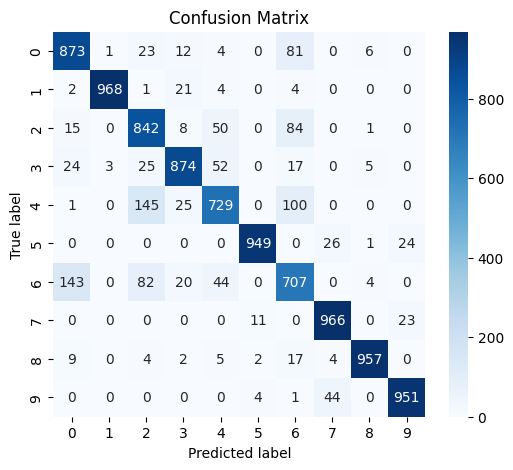

Early stopping at epoch 20
Best epoch: 20
Train Accuracy: 0.9263
Validation Score: 0.8945
Training Time: 36.386648416519165 seconds


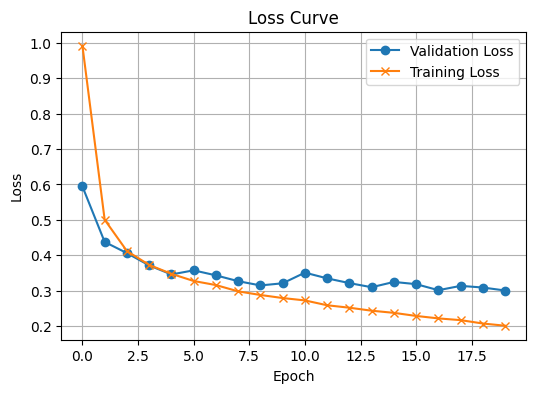

Test Accuracy: 0.8853


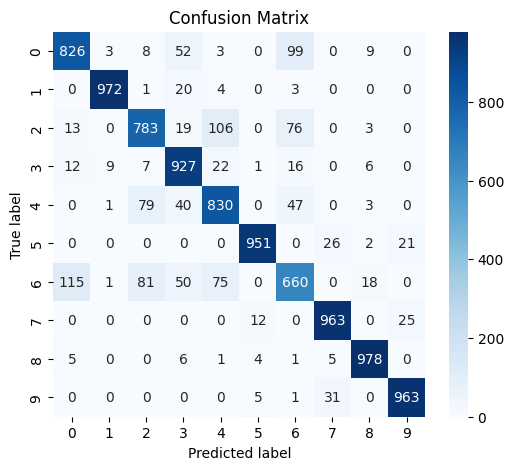

Early stopping at epoch 13
Best epoch: 13
Train Accuracy: 0.91688
Validation Score: 0.8944
Training Time: 28.342962980270386 seconds


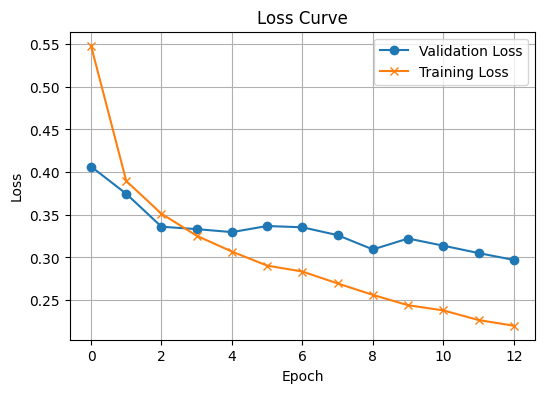

Test Accuracy: 0.8845


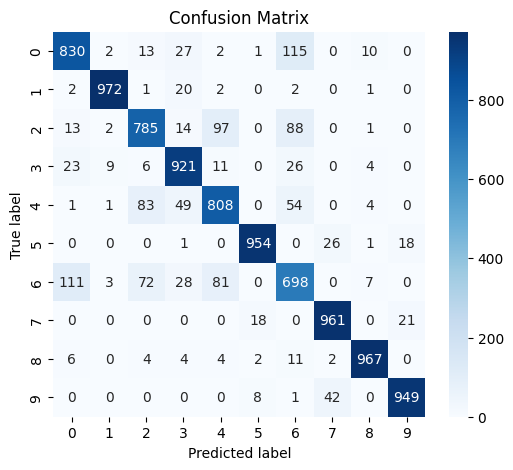

{'training accuracy': 0.91688,
 'testing accuracy': 0.8845,
 'validation score': 0.8944,
 'confusion_matrix': array([[830,   2,  13,  27,   2,   1, 115,   0,  10,   0],
        [  2, 972,   1,  20,   2,   0,   2,   0,   1,   0],
        [ 13,   2, 785,  14,  97,   0,  88,   0,   1,   0],
        [ 23,   9,   6, 921,  11,   0,  26,   0,   4,   0],
        [  1,   1,  83,  49, 808,   0,  54,   0,   4,   0],
        [  0,   0,   0,   1,   0, 954,   0,  26,   1,  18],
        [111,   3,  72,  28,  81,   0, 698,   0,   7,   0],
        [  0,   0,   0,   0,   0,  18,   0, 961,   0,  21],
        [  6,   0,   4,   4,   4,   2,  11,   2, 967,   0],
        [  0,   0,   0,   0,   0,   8,   1,  42,   0, 949]]),
 'training_time': 28.342962980270386,
 'n_iter': 13}

In [12]:
# Change activation functions



train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128], 'activation_fn': nn.ReLU})
train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128], 'activation_fn': nn.GELU})
train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128], 'activation_fn': nn.LeakyReLU})
train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128], 'activation_fn': nn.Sigmoid})
train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128], 'activation_fn': nn.Tanh})

Adam
learning rate: 0.1
Early stopping at epoch 11
Best epoch: 11
Train Accuracy: 0.0993
Validation Score: 0.1021
Training Time: 25.249446153640747 seconds


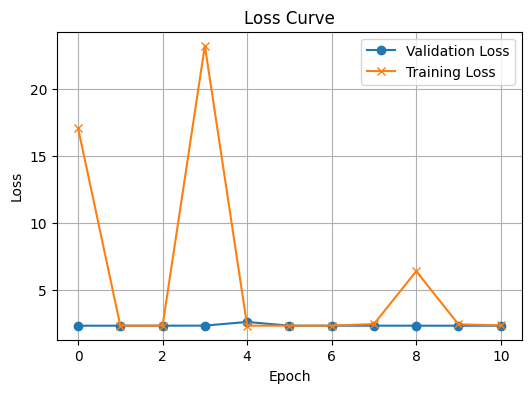

Test Accuracy: 0.1


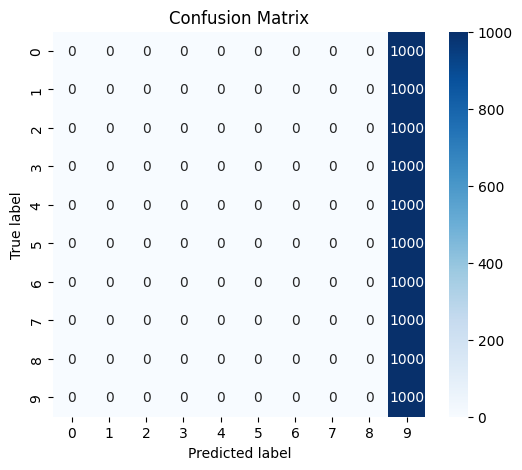

learning rate: 0.01
Early stopping at epoch 4
Best epoch: 4
Train Accuracy: 0.85926
Validation Score: 0.8657
Training Time: 17.460705518722534 seconds


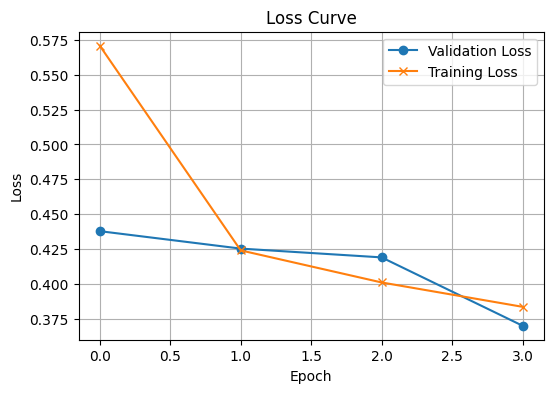

Test Accuracy: 0.8625


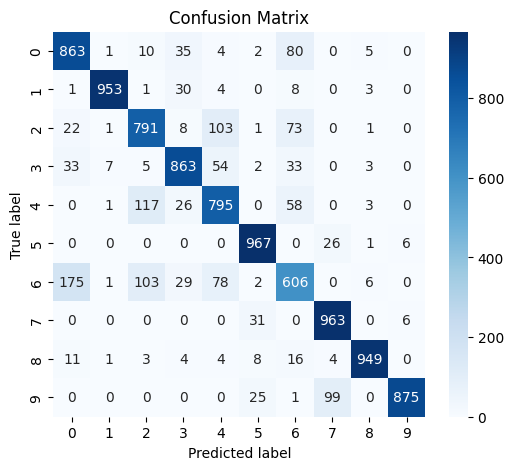

learning rate: 0.001
Early stopping at epoch 14
Best epoch: 14
Train Accuracy: 0.91688
Validation Score: 0.8927
Training Time: 36.35739803314209 seconds


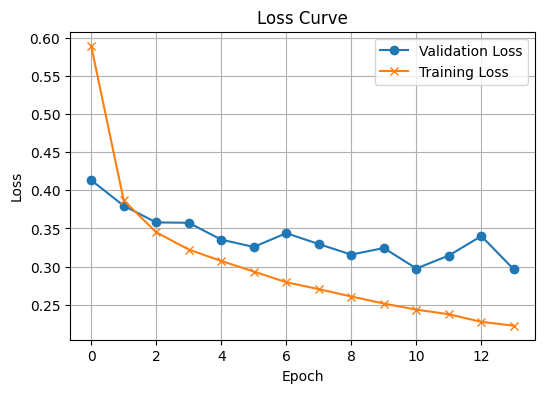

Test Accuracy: 0.8844


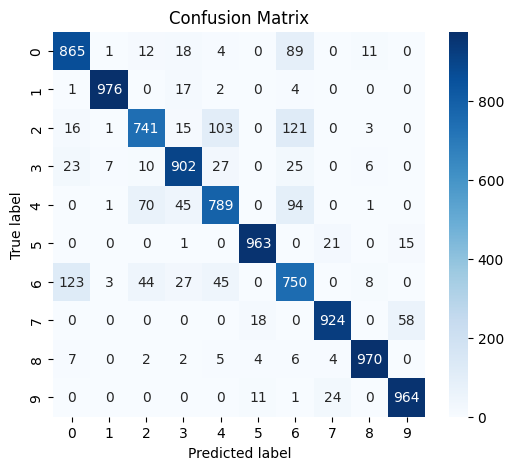

learning rate: 0.0001
Early stopping at epoch 37
Best epoch: 37
Train Accuracy: 0.92466
Validation Score: 0.8919
Training Time: 59.269304513931274 seconds


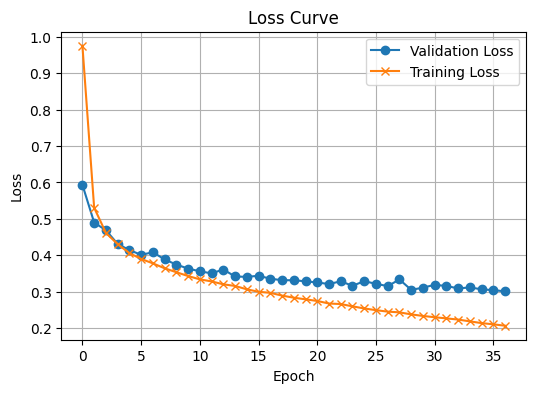

Test Accuracy: 0.8871


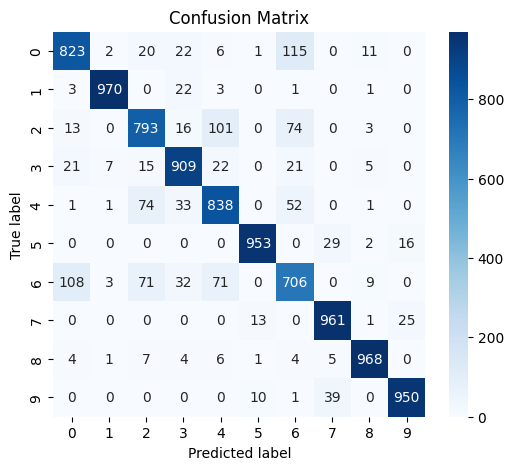

learning rate: 1e-05
Best epoch: 195
Train Accuracy: 0.90436
Validation Score: 0.8816
Training Time: 249.85400938987732 seconds


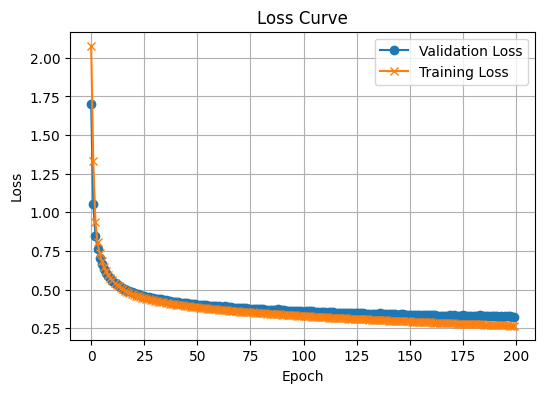

Test Accuracy: 0.875


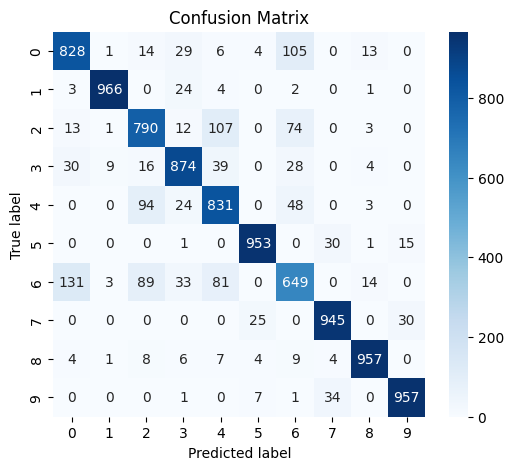

In [13]:
# Optimization methods and learning rate
# Adam
print("Adam")
for lr in [1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
  print(f"learning rate: {lr}")
  train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128]}, optimizer_class=torch.optim.Adam, optimizer_params={"lr":lr, "weight_decay": 1e-4})


AdamW
learning rate: 0.1
Early stopping at epoch 10
Best epoch: 10
Train Accuracy: 0.09808
Validation Score: 0.105
Training Time: 24.759583234786987 seconds


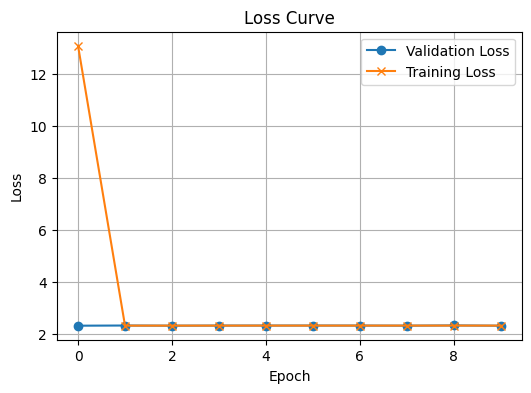

Test Accuracy: 0.1


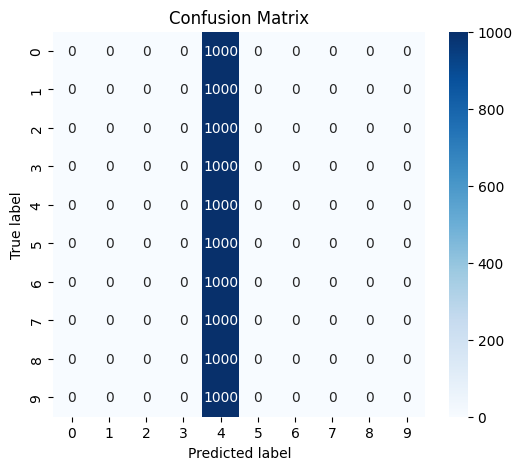

learning rate: 0.01
Early stopping at epoch 4
Best epoch: 4
Train Accuracy: 0.87044
Validation Score: 0.8718
Training Time: 17.104233503341675 seconds


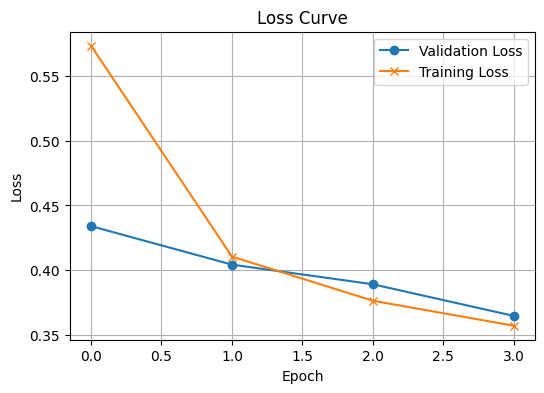

Test Accuracy: 0.8624


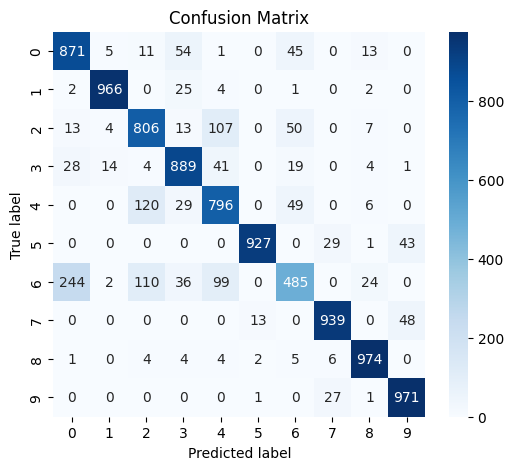

learning rate: 0.001
Early stopping at epoch 13
Best epoch: 13
Train Accuracy: 0.9207
Validation Score: 0.8889
Training Time: 27.926985502243042 seconds


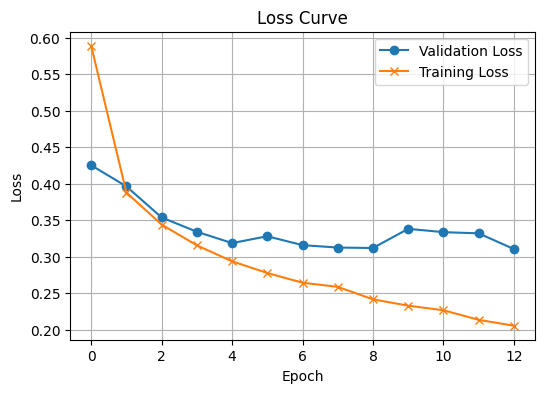

Test Accuracy: 0.8796


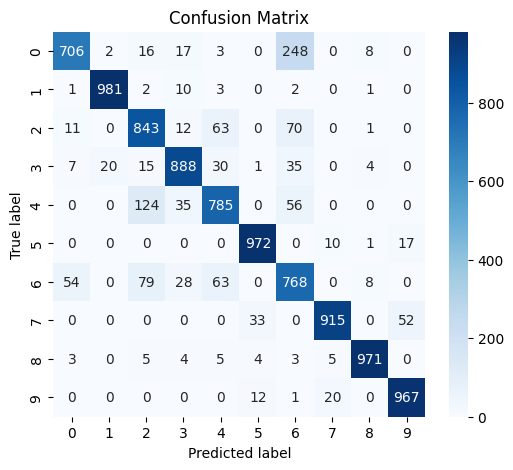

learning rate: 0.0001
Early stopping at epoch 35
Best epoch: 35
Train Accuracy: 0.92618
Validation Score: 0.8907
Training Time: 54.54727125167847 seconds


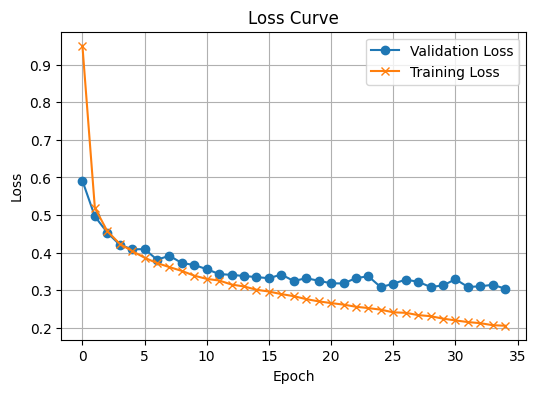

Test Accuracy: 0.8847


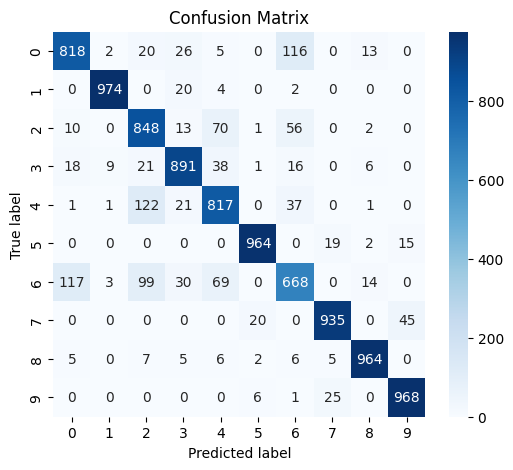

learning rate: 1e-05
Best epoch: 192
Train Accuracy: 0.90396
Validation Score: 0.882
Training Time: 246.60958862304688 seconds


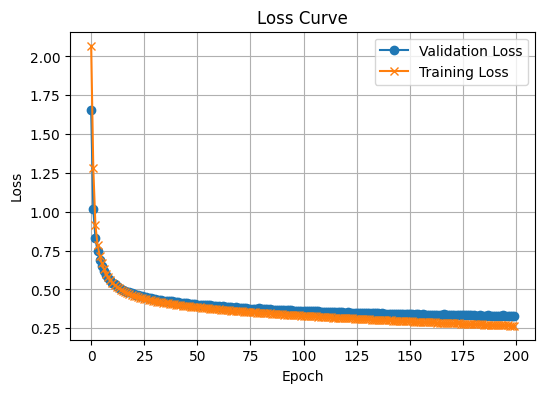

Test Accuracy: 0.8759


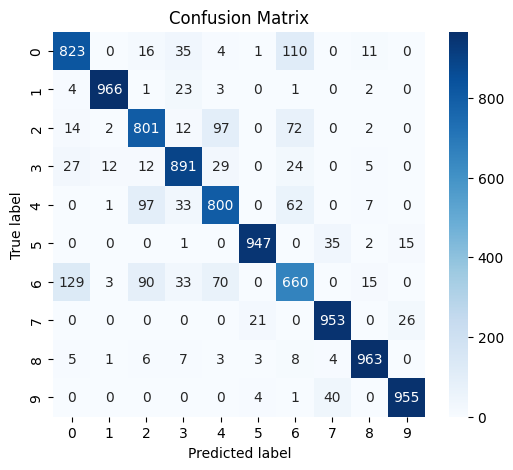

In [14]:
# AdamW
print("AdamW")
for lr in [1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
  print(f"learning rate: {lr}")
  train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128]}, optimizer_class=torch.optim.AdamW, optimizer_params={"lr":lr, "weight_decay": 1e-4})

SGD+Momentum
learning rate: 0.1
Early stopping at epoch 10
Best epoch: 10
Train Accuracy: 0.89024
Validation Score: 0.8841
Training Time: 22.906973838806152 seconds


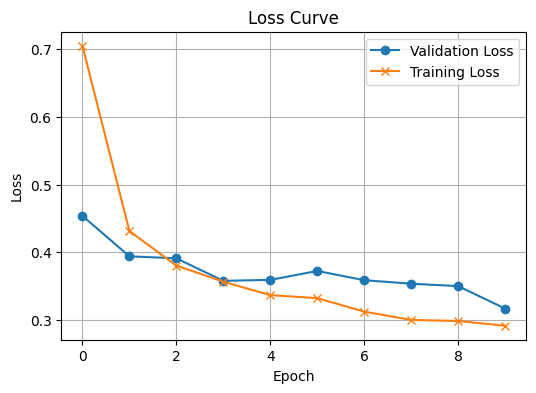

Test Accuracy: 0.8809


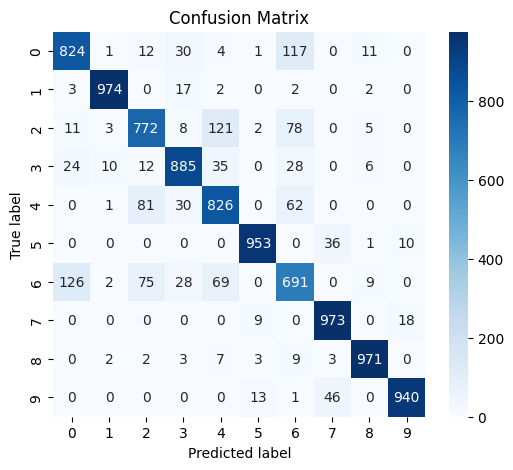

learning rate: 0.01
Early stopping at epoch 25
Best epoch: 25
Train Accuracy: 0.92812
Validation Score: 0.8985
Training Time: 40.08987021446228 seconds


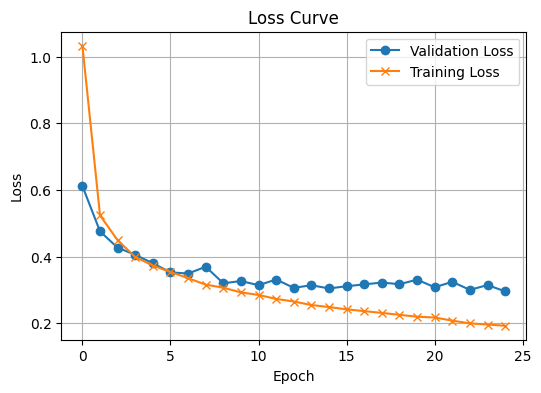

Test Accuracy: 0.8867


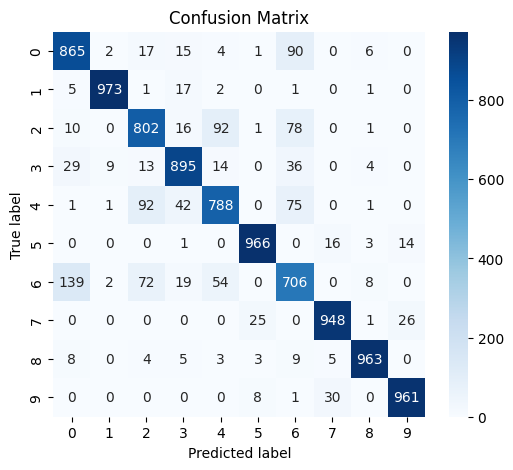

learning rate: 0.001
Early stopping at epoch 85
Best epoch: 85
Train Accuracy: 0.91578
Validation Score: 0.8893
Training Time: 109.71560025215149 seconds


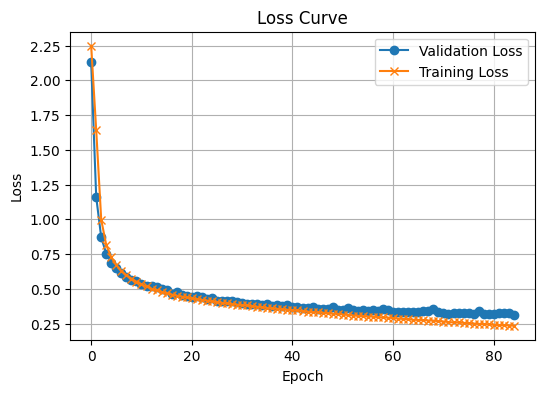

Test Accuracy: 0.8813


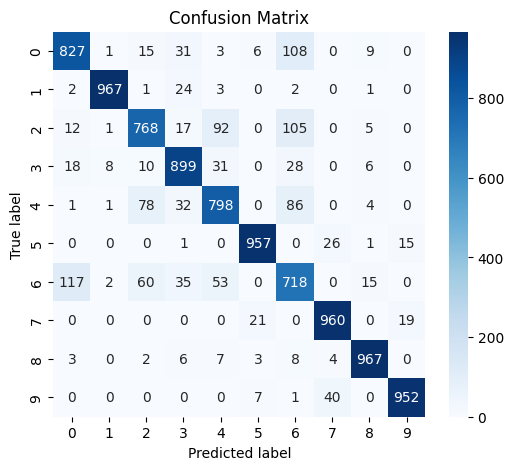

learning rate: 0.0001
Best epoch: 200
Train Accuracy: 0.85492
Validation Score: 0.8471
Training Time: 232.07121109962463 seconds


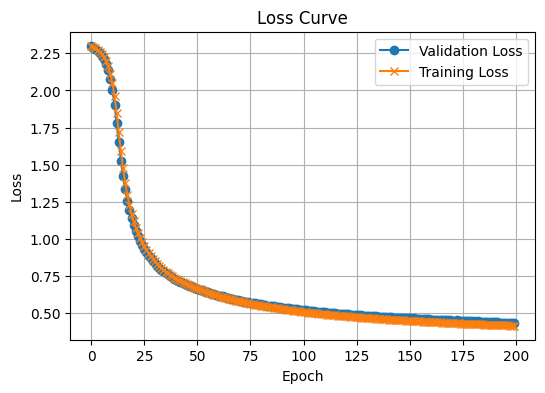

Test Accuracy: 0.8381


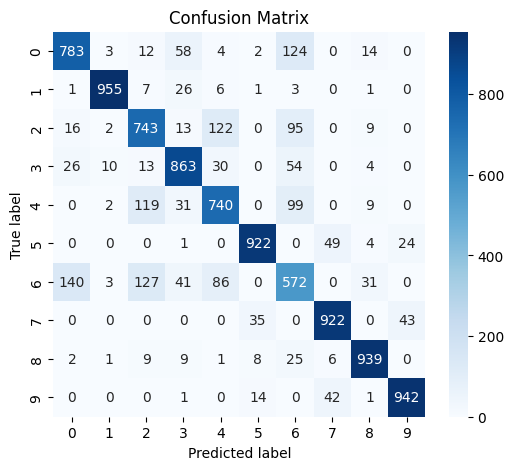

In [17]:
# SGD
print("SGD+Momentum")
for lr in [1e-1, 1e-2, 1e-3, 1e-4]:
  print(f"learning rate: {lr}")
  train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128]}, optimizer_class=torch.optim.SGD, optimizer_params={"lr":lr, "weight_decay": 1e-4, "momentum": 0.9})

Patience = 5
Early stopping at epoch 11
Best epoch: 11
Train Accuracy: 0.91708
Validation Score: 0.893
Training Time: 19.592451333999634 seconds


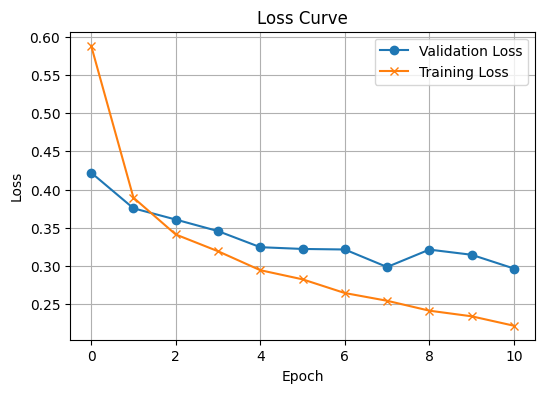

Test Accuracy: 0.889


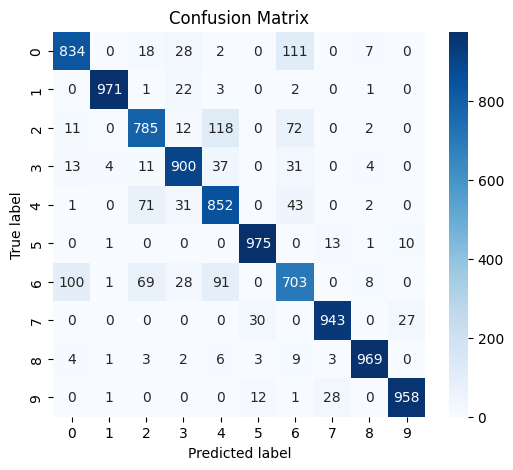

Patience = 10
Early stopping at epoch 15
Best epoch: 15
Train Accuracy: 0.92836
Validation Score: 0.8948
Training Time: 30.47852921485901 seconds


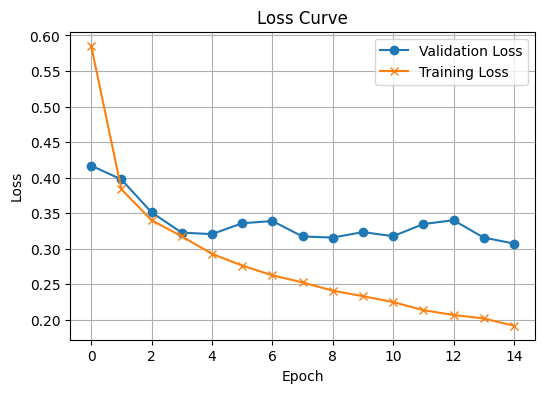

Test Accuracy: 0.8902


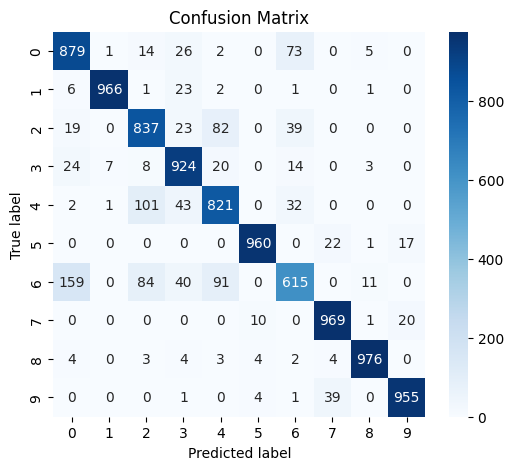

Patience = 20
Early stopping at epoch 12
Best epoch: 12
Train Accuracy: 0.91588
Validation Score: 0.8949
Training Time: 39.01400089263916 seconds


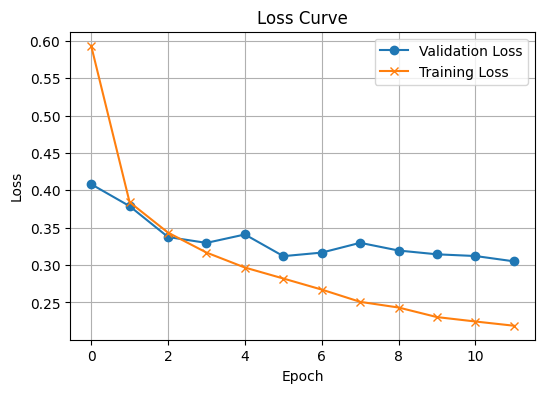

Test Accuracy: 0.8913


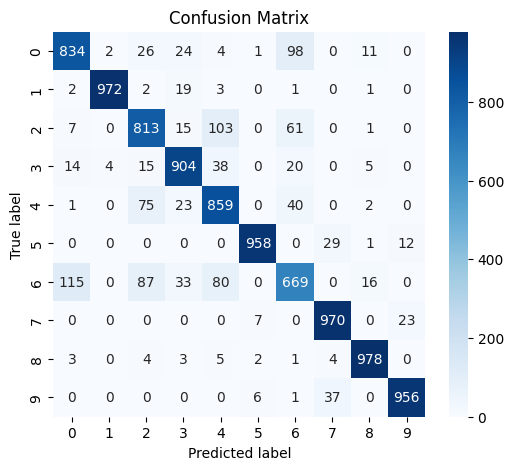

{'training accuracy': 0.91588,
 'testing accuracy': 0.8913,
 'validation score': 0.8949,
 'confusion_matrix': array([[834,   2,  26,  24,   4,   1,  98,   0,  11,   0],
        [  2, 972,   2,  19,   3,   0,   1,   0,   1,   0],
        [  7,   0, 813,  15, 103,   0,  61,   0,   1,   0],
        [ 14,   4,  15, 904,  38,   0,  20,   0,   5,   0],
        [  1,   0,  75,  23, 859,   0,  40,   0,   2,   0],
        [  0,   0,   0,   0,   0, 958,   0,  29,   1,  12],
        [115,   0,  87,  33,  80,   0, 669,   0,  16,   0],
        [  0,   0,   0,   0,   0,   7,   0, 970,   0,  23],
        [  3,   0,   4,   3,   5,   2,   1,   4, 978,   0],
        [  0,   0,   0,   0,   0,   6,   1,  37,   0, 956]]),
 'training_time': 39.01400089263916,
 'n_iter': 12}

In [15]:
# Early Stopping

print("Patience = 5")
train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128]}, early_stopping=True, patience=5)
print("Patience = 10")
train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128]}, early_stopping=True, patience=10)
print("Patience = 20")
train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128]}, early_stopping=True, patience=20)


No Early Stopping
Converged at epoch 138 (training loss)
Train Accuracy: 0.99538
Training Time: 177.10216975212097 seconds


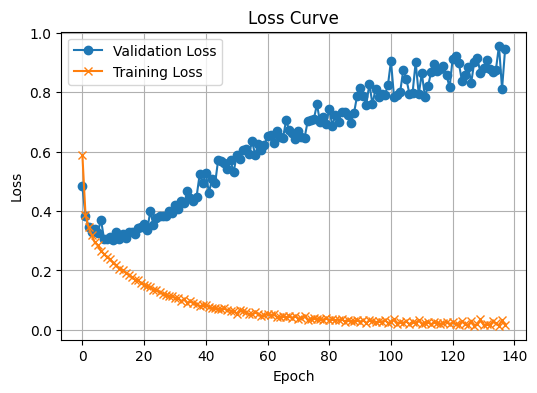

Test Accuracy: 0.894


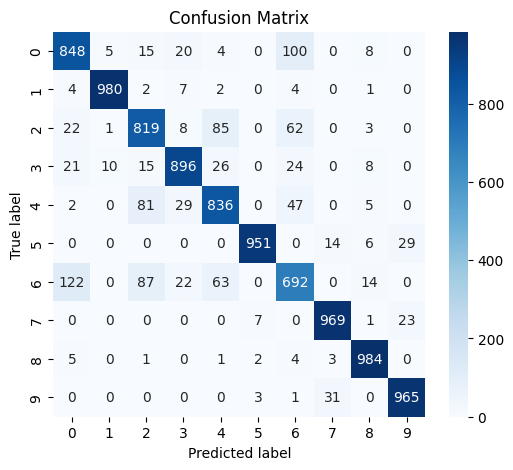

{'training accuracy': 0.99538,
 'testing accuracy': 0.894,
 'validation score': 0,
 'confusion_matrix': array([[848,   5,  15,  20,   4,   0, 100,   0,   8,   0],
        [  4, 980,   2,   7,   2,   0,   4,   0,   1,   0],
        [ 22,   1, 819,   8,  85,   0,  62,   0,   3,   0],
        [ 21,  10,  15, 896,  26,   0,  24,   0,   8,   0],
        [  2,   0,  81,  29, 836,   0,  47,   0,   5,   0],
        [  0,   0,   0,   0,   0, 951,   0,  14,   6,  29],
        [122,   0,  87,  22,  63,   0, 692,   0,  14,   0],
        [  0,   0,   0,   0,   0,   7,   0, 969,   1,  23],
        [  5,   0,   1,   0,   1,   2,   4,   3, 984,   0],
        [  0,   0,   0,   0,   0,   3,   1,  31,   0, 965]]),
 'training_time': 177.10216975212097,
 'n_iter': 138}

In [24]:
print("No Early Stopping")
train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128]}, early_stopping=False)

weight decay: 0.1
Converged at epoch 83 (training loss)
Train Accuracy: 0.95792
Training Time: 106.23915719985962 seconds


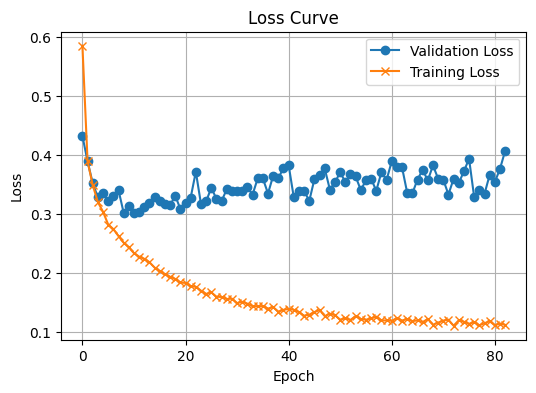

Test Accuracy: 0.8922


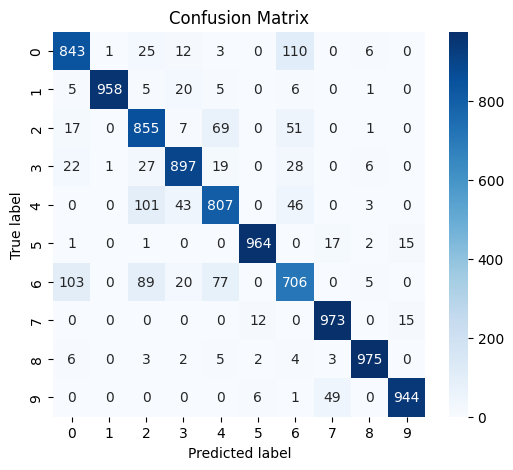

weight decay: 0.01
Converged at epoch 90 (training loss)
Train Accuracy: 0.988
Training Time: 115.03923273086548 seconds


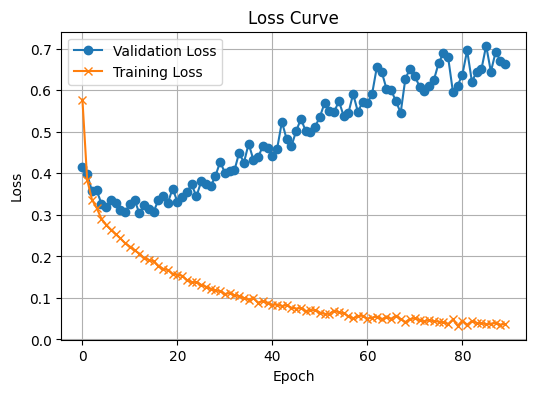

Test Accuracy: 0.8903


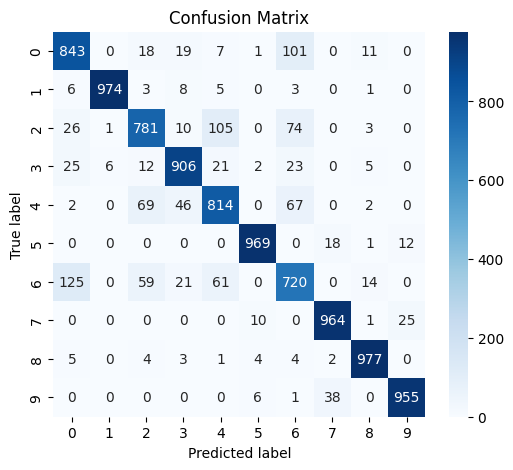

weight decay: 0.001
Converged at epoch 105 (training loss)
Train Accuracy: 0.99312
Training Time: 134.1169958114624 seconds


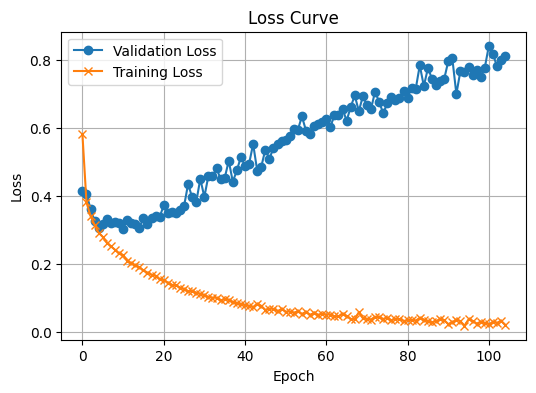

Test Accuracy: 0.8933


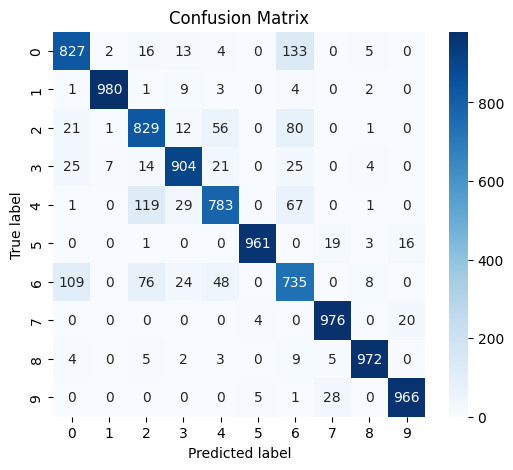

weight decay: 0.0001
Converged at epoch 100 (training loss)
Train Accuracy: 0.991
Training Time: 128.00345993041992 seconds


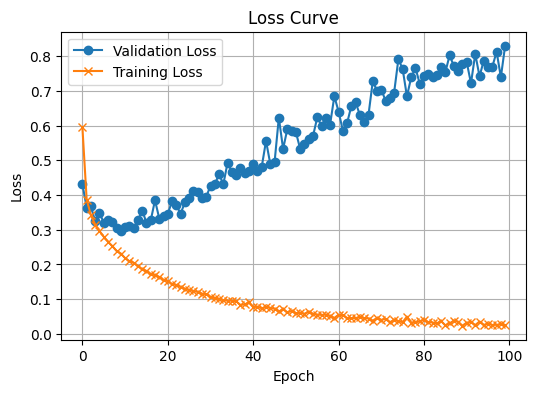

Test Accuracy: 0.8957


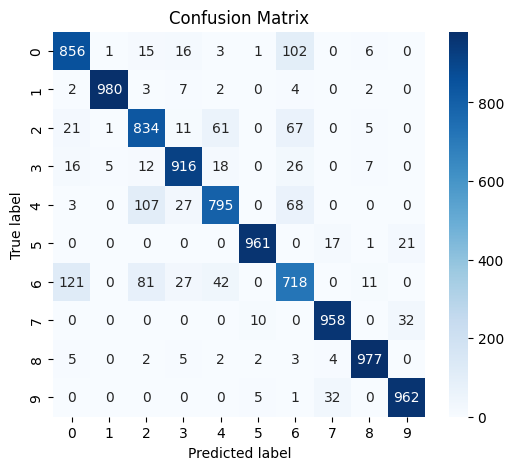

weight decay: 1e-05


In [ ]:
# Weight Decay (no early stopping)

for wd in [1e-1, 1e-2, 1e-3, 1e-4]:
  print(f"weight decay: {wd}")
  train_pipeline(model_class = NeuralNetwork, model_params = {'hidden_layers': [512, 256, 128]}, early_stopping=False, optimizer_params={"lr":1e-3, "weight_decay": wd})

